In [1]:
!export CUDA_VISIBLE_DEVICES=1
import os
os.environ['CUDA_VISIBLE_DEVICES'] = '1'


from tensorflow import keras
from tensorflow.keras import layers,models,losses,metrics,datasets, utils,optimizers,callbacks
from tensorflow.keras import backend as K
import tensorflow_probability as tfp
from sklearn.model_selection import train_test_split
import os
import glob
K.clear_session()
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import pickle
tf.config.list_physical_devices('CPU')
print(tf.config.list_physical_devices('GPU'))
print(tf.__version__)


print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

2025-01-27 21:16:17.548614: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-01-27 21:16:17.563252: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1738030577.576921 2161694 cuda_dnn.cc:8321] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1738030577.580762 2161694 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-01-27 21:16:17.595750: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instr

[]
2.18.0-dev20240917
Num GPUs Available:  0


2025-01-27 21:16:20.146417: E external/local_xla/xla/stream_executor/cuda/cuda_driver.cc:152] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2025-01-27 21:16:20.146447: I external/local_xla/xla/stream_executor/cuda/cuda_diagnostics.cc:137] retrieving CUDA diagnostic information for host: localhost.localdomain
2025-01-27 21:16:20.146451: I external/local_xla/xla/stream_executor/cuda/cuda_diagnostics.cc:144] hostname: localhost.localdomain
2025-01-27 21:16:20.146519: I external/local_xla/xla/stream_executor/cuda/cuda_diagnostics.cc:168] libcuda reported version is: 560.28.3
2025-01-27 21:16:20.146531: I external/local_xla/xla/stream_executor/cuda/cuda_diagnostics.cc:172] kernel reported version is: 560.28.3
2025-01-27 21:16:20.146534: I external/local_xla/xla/stream_executor/cuda/cuda_diagnostics.cc:259] kernel version seems to match DSO: 560.28.3


# Data Loader

In [2]:
with tf.device('/CPU:0'):
    data_folders = [f'./image-impeccable-train-data-part{i}' for i in range(1, 2)]
    x_dim = 300
    y_dim = 300
    time_length = 1259

In [3]:
with tf.device('/CPU:0'):
    def rescale_volume(seismic, low=0, high=100):
        """
        Rescaling 3D seismic volumes 0-255 range, clipping values between low and high percentiles
        """
        minval = np.percentile(seismic, low)
        maxval = np.percentile(seismic, high)
        seismic = tf.clip_by_value(seismic, minval, maxval)
        seismic = ((seismic - minval) / (maxval - minval))
        # seismic = (seismic - tf.reduce_mean(seismic))/tf.math.reduce_std(seismic)
        # seismic = seismic/tf.reduce_max(tf.abs(seismic))
        return seismic

        return seismic
    def padding_up(mat):
        num = 21
        first_row = mat[0,:]
        padding = np.tile(first_row,(num,1))
        padded_matrix = np.vstack([padding,mat])
        return padded_matrix

    def padding_lr(mat):
        num1,num2 = 10,10 
        first_column = np.zeros(mat[:,0].shape[0])
        last_column = np.zeros(mat[:,-1].shape[0])
        padding_left = np.tile(first_column,(num1,1)).T
        padding_right = np.tile(last_column,(num2,1)).T
        padded_matrix = np.hstack([padding_left,mat,padding_right])
        return padded_matrix

In [4]:
with tf.device('/CPU:0'):
    def padding_up(mat):
        num = 21
        first_row = mat[0,:]
        padding = np.tile(first_row,(num,1))
        padded_matrix = np.vstack([padding,mat])
        return padded_matrix

    # Function to load data from one folder
    def load_data_from_folder(folder_path):
        inputs = []
        outputs = []
        count = 0
        for subfolder in os.listdir(folder_path):
            subfolder_path = os.path.join(folder_path, subfolder)
            print("Data is loaded from: "+subfolder_path)
            file1_path = list(glob.iglob(subfolder_path+"/seismic_w_noise_vol*.npy"))[0]
            file2_path = list(glob.iglob(subfolder_path+"/seismicCubes_RFC_fullstack*.npy"))[0]

            
            # Load the .npy files
            input_data = np.transpose(np.load(file1_path,allow_pickle=True,mmap_mode='r+'),(2,0,1))  
            output_data = np.transpose(np.load(file2_path,allow_pickle=True,mmap_mode='r+'),(2,0,1)) 
            # print(input_data.shape)
            # print(output_data.shape)
            
            # Create 300 training samples from each .npy file
            for i in range(x_dim):
                inputs.append(input_data[i, :, :])  # Shape: (300, 1259)
                outputs.append(output_data[i, :, :])  # Shape: (300, 1259)
            count += 1

            if count==1:
                break
        
        return np.array(inputs), np.array(outputs)

Data is loaded from: ./image-impeccable-train-data-part1/42487393
17
Batch inputs shape: (1280, 320)
Batch outputs shape: (1280, 320)


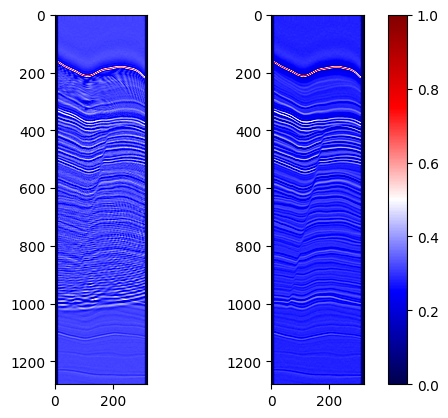

In [5]:
with tf.device('/CPU:0'):
    # Load all data from the 18 folders
    all_inputs = []
    all_outputs = []
    for folder in data_folders:
        inputs, outputs = load_data_from_folder(folder)
        all_inputs.append(inputs)
        all_outputs.append(outputs)
        break

    # Concatenate the data
    all_inputs = np.concatenate(all_inputs, axis=0)  # Shape: (N, 300, 1259)
    all_outputs = np.concatenate(all_outputs, axis=0)  # Shape: (N, 300, 1259)

    # Split into training and validation sets
    train_inputs, val_inputs, train_outputs, val_outputs = train_test_split(all_inputs, all_outputs, test_size=0.1, random_state=42)

    # Convert to TensorFlow datasets
    def create_dataset(inputs, outputs, batch_size=32):
        dataset = tf.data.Dataset.from_tensor_slices((inputs, outputs))
        dataset = dataset.shuffle(buffer_size=len(inputs))
        dataset = dataset.batch(batch_size)
        return dataset

    batch_size = 16
    train_dataset = create_dataset(train_inputs, train_outputs, batch_size)
    val_dataset = create_dataset(val_inputs, val_outputs, batch_size)
    print(len(train_dataset))

    # Example of how to use the dataset
    for batch_inputs, batch_outputs in train_dataset.take(1):
        input_section = batch_inputs[0]
        rescaled_input_section = rescale_volume(input_section)
        padded_input_section = padding_up(rescaled_input_section)
        padded_input_section = padding_lr(padded_input_section)

        output_section = batch_outputs[0]
        rescaled_output_section = rescale_volume(output_section)
        padded_output_section = padding_up(rescaled_output_section)
        padded_output_section = padding_lr(padded_output_section)

        print("Batch inputs shape:", padded_input_section.shape)
        print("Batch outputs shape:", padded_output_section.shape)
        fig,axes = plt.subplots(1,2)
        # vmin = np.min([np.min(batch_inputs[0]),np.min(batch_inputs[0])])
        # vmax = np.max([np.max(batch_inputs[0]),np.max(batch_inputs[0])])
        im1 = axes[0].imshow(padded_input_section,cmap='seismic',vmin=0,vmax=1)
        im2 = axes[1].imshow(padded_output_section,cmap='seismic',vmin=0,vmax=1)
        
        fig.colorbar(im2,ax=axes)
        plt.show()
        break
    

# Additional Layers

In [6]:

@keras.utils.register_keras_serializable()
class Rescale(layers.Layer):
    def __init__(self,**kwargs):
        super().__init__(**kwargs)

    def build(self,input_shape):
        pass

    @staticmethod
    def rescale_section(seismic, low=0, high=100):
        minval = tfp.stats.percentile(seismic, low)
        maxval = tfp.stats.percentile(seismic, high)
        seismic = tf.clip_by_value(seismic, minval, maxval)
        seismic = ((seismic - minval) / (maxval - minval))
        # seismic = (seismic - tf.reduce_mean(seismic))/tf.math.reduce_std(seismic)
        # seismic = seismic/tf.reduce_max(tf.abs(seismic))
        return seismic
    
    def call(self,inputs):
        input_sections = inputs

        def process_section(section):
            x = self.rescale_section(section)
            return x
        
        rescaled_section = tf.map_fn(process_section, input_sections, fn_output_signature=tf.float32)

        return rescaled_section
    
    def get_config(self):
        config = super().get_config()
        return config
    
    @classmethod
    def from_config(cls, config):
        return cls(**config)

(16, 1260, 300, 1) (16, 1260, 300, 1)
(1260, 300, 1)


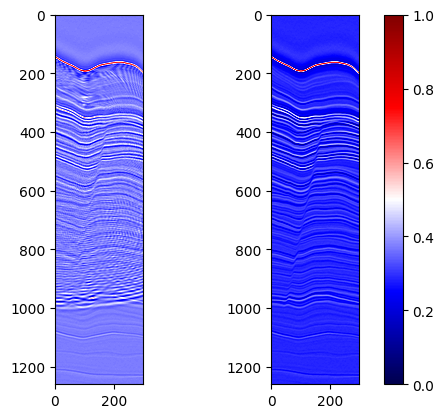

In [7]:

# Padding Layer
@keras.utils.register_keras_serializable()
class Padding(layers.Layer):
    def __init__(self,left,right, up, down,**kwargs):
        super().__init__(**kwargs)
        self.left = left
        self.right = right
        self.up = up
        self.down = down

    def build(self,input_shape):
        pass
    
    def padding_matrix(self,mat):
        # Define the padding: [[pad_top, pad_bottom], [pad_left, pad_right]]
        # padding = [[1, 1], [2, 2]]  # Example: Pad 1 row on top, 1 row on bottom, 2 columns on left, 2 columns on right
        padding = [[self.up,self.down],[self.left,self.right]]
        padded_matrix = tf.pad(mat, padding, mode='CONSTANT', constant_values=0)
        return padded_matrix
    
    def call(self,inputs):
        input_sections = inputs

        def process_section(section):
            x = self.padding_matrix(section)
            x = tf.expand_dims(x, axis=-1)
            x = tf.cast(x, dtype=tf.float32)
            return x
        
        input_sections_final = tf.map_fn(process_section, input_sections, fn_output_signature=tf.float32)
        

        return input_sections_final
        
    def get_config(self):
        config = super().get_config()
        config.update(
            {
                "left":keras.utils.serialize_keras_object(self.left),
                "right":keras.utils.serialize_keras_object(self.right),
                "up":keras.utils.serialize_keras_object(self.up),
                "down":keras.utils.serialize_keras_object(self.down)
            }
        )
        return config
    
    @classmethod
    def from_config(cls, config):
        left = keras.utils.deserialize_keras_object(config.pop("left"))
        right = keras.utils.deserialize_keras_object(config.pop("right"))
        up = keras.utils.deserialize_keras_object(config.pop("up"))
        down = keras.utils.deserialize_keras_object(config.pop("down"))
        return cls(left,right,up,down,**config)
    


# testing if the layer is working or not
rescale_layer = Rescale()
left,right, up, down = 0,0,1,0
padding_layer = Padding(left,right, up, down)
for input_sections,output_sections in train_dataset.take(1):
    
    input_sections_f,output_sections_f = padding_layer(rescale_layer(input_sections)),padding_layer(rescale_layer(output_sections))
    print(input_sections_f.shape,output_sections_f.shape)
    input_section_f,output_section_f = np.squeeze(input_sections_f[0],axis=-1),np.squeeze(output_sections_f[0],axis=-1)
    input_section_f,output_section_f = input_sections_f[0],output_sections_f[0]
    print(input_section_f.shape)


    fig,axes = plt.subplots(1,2)
    im1 = axes[0].imshow(input_section_f,cmap='seismic',vmin=0,vmax=1)
    im2 = axes[1].imshow(output_section_f,cmap='seismic',vmin=0,vmax=1)
    fig.colorbar(im2,ax=axes)

    # fig2,axes2 = plt.subplots(1,2)
    # im3 = axes2[0].imshow(input_sections[0],cmap='seismic')
    # im4 = axes2[1].imshow(output_sections[0],cmap='seismic')
    
    
    plt.show()
    break
        

(16, 1259, 300)


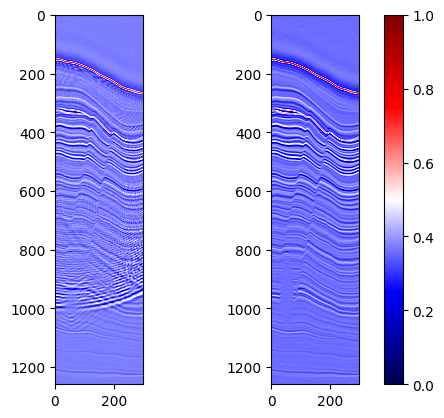

In [8]:

@keras.utils.register_keras_serializable()
class RemovePadding(layers.Layer):
    def __init__(self,left,right, up, down,**kwargs):
        super().__init__(**kwargs)
        self.left = left
        self.right = right
        self.up = up
        self.down = down

    def build(self,input_shape):
        pass

    
    def remove_padding_matrix(self,mat):
        return mat[self.up:mat.shape[0]-self.down,self.left:mat.shape[1]-self.right]

    def call(self,inputs):
        input_sections = inputs
        def process_section(section):
            x = self.remove_padding_matrix(section)
            x = tf.squeeze(x, axis=-1)
            x = tf.cast(x, dtype=tf.float32)
            return x
        
        input_sections_final = tf.map_fn(process_section, input_sections, fn_output_signature=tf.float32)

        return input_sections_final
    
    def get_config(self):
        config = super().get_config()
        config.update(
            {
                "left":keras.utils.serialize_keras_object(self.left),
                "right":keras.utils.serialize_keras_object(self.right),
                "up":keras.utils.serialize_keras_object(self.up),
                "down":keras.utils.serialize_keras_object(self.down)
            }
        )
        return config
    
    @classmethod
    def from_config(cls, config):
        left = keras.utils.deserialize_keras_object(config.pop("left"))
        right = keras.utils.deserialize_keras_object(config.pop("right"))
        up = keras.utils.deserialize_keras_object(config.pop("up"))
        down = keras.utils.deserialize_keras_object(config.pop("down"))
        return cls(left,right,up,down,**config)

rescale_layer = Rescale()
left,right, up, down = 0,0,1,0
padding_layer = Padding(left,right, up, down)
remove_padding_layer = RemovePadding(left,right, up, down)
for input_sections,output_sections in train_dataset.take(1):
    input_sections_f,output_sections_f = padding_layer(rescale_layer(input_sections)),padding_layer(rescale_layer(output_sections))
    input_section_f,output_section_f = remove_padding_layer(input_sections_f),remove_padding_layer(output_sections_f)
    print(input_section_f.shape)


    fig,axes = plt.subplots(1,2)
    im1 = axes[0].imshow(input_section_f[0],cmap='seismic',vmin=0,vmax=1)
    im2 = axes[1].imshow(output_section_f[0],cmap='seismic',vmin=0,vmax=1)
    fig.colorbar(im2,ax=axes)

    
    
    plt.show()
    break

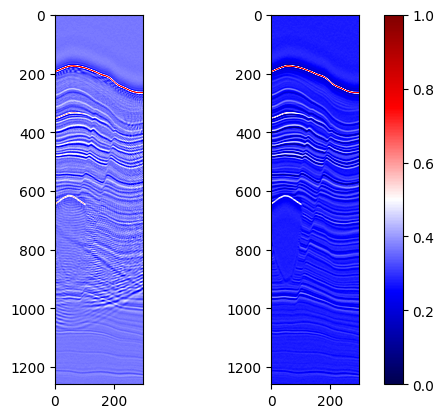

In [9]:

# testing padding layer and unpadding layer 
left,right, up, down = 0,0,1,0
model = tf.keras.Sequential([
    Rescale(),
    Padding(left,right, up, down),  # Add padding
    RemovePadding(left,right, up, down)  # Remove padding
])
for input_sections,output_sections in train_dataset.take(1):
    input_section_f,output_section_f = model(input_sections),model(output_sections)

    fig,axes = plt.subplots(1,2)
    im1 = axes[0].imshow(input_section_f[0],cmap='seismic',vmin=0,vmax=1)
    im2 = axes[1].imshow(output_section_f[0],cmap='seismic',vmin=0,vmax=1)
    fig.colorbar(im2,ax=axes)

    break

# Additional Matric and Loss function

In [10]:

# custom ssim metric
@keras.utils.register_keras_serializable()


class SSIMMetric(metrics.Metric):
    def __init__(self, max_val=1.0, name="ssim", **kwargs):
        super().__init__(name=name, **kwargs)  # Set the metric name
        self.ssim_sum = self.add_weight(name="ssim_sum", initializer="zeros")
        self.count = self.add_weight(name="count", initializer="zeros")
        self.max_val = max_val  # Max value of the image data (1.0 if normalized)

    def update_state(self, y_true, y_pred, sample_weight=None):
        # Calculate SSIM between true and predicted values
        ssim_value = tf.image.ssim(y_true, y_pred, max_val=self.max_val)
        
        # Update the sum of SSIM values
        self.ssim_sum.assign_add(tf.reduce_sum(ssim_value))
        
        # Update the count (number of images)
        self.count.assign_add(tf.cast(tf.size(ssim_value), tf.float32))
        
        # Optionally handle sample weighting
        if sample_weight is not None:
            sample_weight = tf.cast(sample_weight, tf.float32)
            ssim_value *= sample_weight

    def result(self):
        # Compute the mean SSIM
        return self.ssim_sum / self.count

    def reset_states(self):
        # Reset the SSIM sum and count variables at the start of each epoch
        self.ssim_sum.assign(0.0)
        self.count.assign(0.0)

# Example usage:
# model.compile(optimizer='adam', loss='mse', metrics=[SSIMMetric(max_val=1.0, name="custom_ssim")])



In [11]:

# Custom SSIM Loss Function as a Class
@keras.utils.register_keras_serializable()
class SSIMLoss(keras.losses.Loss):
    def __init__(self,name="ssim_loss", max_val=1.0,**kwargs):
        super().__init__(name="ssim_loss",**kwargs)
        self.max_val = max_val  # Maximum pixel value in the input images

    def call(self, y_true, y_pred):
        # Compute the SSIM between y_true and y_pred
        ssim_value = tf.image.ssim(y_true, y_pred, max_val=self.max_val)
        
        # The SSIM loss is 1 - SSIM, to maximize SSIM we minimize this loss
        return 1 - tf.reduce_mean(ssim_value)

# Model

In [12]:
@keras.utils.register_keras_serializable()
class Patches(layers.Layer):
    def __init__(self,patch_size,**kwargs):
        super().__init__(**kwargs)
        self.patch_size = patch_size
        self.resize = layers.Reshape((-1,patch_size[0]*patch_size[1]*1)) # assuming image has one channel, each patch would be of size (patch_size[0],patch_size[1],1)


    @tf.function
    def call(self, inputs):
        
        # Extract patches using tf.image.extract_patches
        patches = tf.image.extract_patches(
            images=inputs,
            sizes=[1, self.patch_size[0], self.patch_size[1], 1],
            strides=[1, self.patch_size[0], self.patch_size[1], 1],
            rates=[1, 1, 1, 1],
            padding='VALID'
        )

        patches = self.resize(patches)
        return patches
    
    def reconstruction_from_patches(self,patches,img_shape):
        num_patches = patches.shape[0]
        n = img_shape[0]//self.patch_size[0]
        patches = tf.reshape(patches, (num_patches, self.patch_size[0], self.patch_size[1], 1))
        rows = tf.split(patches,n,axis=0)
        rows = [tf.concat(tf.unstack(x), axis=1) for x in rows]
        reconstructed = tf.concat(rows, axis=0)
        return reconstructed


    def get_config(self):
        config = super().get_config()
        config.update({
            'patch_size': keras.utils.serialize_keras_object(self.patch_size),
        })
        return config
    
    @classmethod
    def from_config(cls, config):
        patch_size = keras.utils.deserialize_keras_object(config.pop("patch_size"))
        return cls(patch_size,**config)
    # a nice trick to print model summary
    def summary(self):
        x = layers.Input(shape=(1260,300,1))
        mod = models.Model(inputs=[x],outputs=self(x))
        '''
        Instead of calling self.call(x) directly, you should pass the input tensor x through the layer or model instance, which will handle the symbolic nature of the tensor properly.
        '''
        return mod.summary()
    
# PATCH_SIZE = (60,15)
# patches = Patches(patch_size=PATCH_SIZE)

# left,right, up, down = 0,0,1,0
# model = tf.keras.Sequential([
#     Rescale(),
#     Padding(left,right, up, down),  # Add padding
#     #RemovePadding(left,right, up, down)  # Remove padding
# ])

# for input_sections,output_sections in train_dataset.take(1):
#     input_section_f,output_section_f = model(input_sections),model(output_sections)
#     patch_input = patches(input_section_f)
#     print(patch_input.shape)

#     reconstructed_section = patches.reconstruction_from_patches(patch_input[0],img_shape=(1260,300))
#     print(reconstructed_section.shape)

#     # for i, patch in enumerate(patch_input[0]):
#     #     # print(patch.shape)
#     #     ax = plt.subplot(1260//PATCH_SIZE[0],  300//PATCH_SIZE[1], i + 1)
#     #     patch_img = tf.reshape(patch, (PATCH_SIZE[0], PATCH_SIZE[1],1))
#     #     plt.imshow(patch_img)
#     #     plt.axis("off")
#         # break
#     break

# patches.summary()


In [13]:
@keras.utils.register_keras_serializable()
class PatchEncoder(layers.Layer):
    def __init__(self,patch_size,num_patches,projection_dim,mask_proportion,downstream=False,**kwargs):
        super().__init__(**kwargs)

        self.patch_size = patch_size
        self.num_patches = num_patches
        self.projection_dim = projection_dim
        self.mask_proportion = mask_proportion
        self.downstream = downstream

        # trainable mask toaken initialized randomly from a normal distribution
        self.mask_token = tf.Variable(tf.random.normal([1, patch_size[0] * patch_size[1] * 1]), trainable=True)
    

    def build(self,input_shape):
        # (_,self.num_patches,self.patch_area) = input_shape
        self.projection = layers.Dense(self.projection_dim)

        # positional embedding layer
        self.positon_embedding = layers.Embedding(input_dim=self.num_patches,output_dim=self.projection_dim)

        # number of patches that will be masked
        self.num_mask = int(self.mask_proportion*self.num_patches)


    def call(self,inputs): # inputs are basically patches
        positions = tf.range(start=0, limit=self.num_patches, delta=1)

        batch_size = tf.shape(inputs)[0]

        '''
        tf.newaxis is the same as using None in Python indexing and is used to add a new dimension to the tensor. 
        Specifically, positions[tf.newaxis, ...] adds an extra dimension at the beginning of positions.

        The ellipsis (...) is a shorthand for including all remaining dimensions of the tensor. 
        It means "include all the dimensions that follow."
        '''
        pos_embeddings = self.positon_embedding(positions[tf.newaxis, ...])
        pos_embeddings = tf.tile(pos_embeddings, [batch_size, 1, 1])  # (B, num_patches, projection_dim)

        patch_embeddings = self.projection(inputs) + pos_embeddings

        if self.downstream:
            return patch_embeddings
        else:
            mask_indices, unmask_indices = self.get_random_indices(batch_size)
            # The encoder input is the unmasked patch embeddings. Here we gather all the patches that should be unmasked.

            unmasked_embeddings = tf.gather(patch_embeddings, unmask_indices, axis=1, batch_dims=1)  # (B, unmask_numbers, projection_dim)

            # Get the unmasked and masked position embeddings. We will need them for the decoder.
            unmasked_positions = tf.gather(pos_embeddings, unmask_indices, axis=1, batch_dims=1)  # (B, unmask_numbers, projection_dim)
            masked_positions = tf.gather(pos_embeddings, mask_indices, axis=1, batch_dims=1)  # (B, mask_numbers, projection_dim)


            # Repeat the mask token number of mask times.
            # Mask tokens replace the masks of the image.
            mask_tokens = tf.repeat(self.mask_token, repeats=self.num_mask, axis=0)
            mask_tokens = tf.repeat(mask_tokens[tf.newaxis, ...], repeats=batch_size, axis=0)

            # Get the masked embeddings for the tokens.
            masked_embeddings = self.projection(mask_tokens) + masked_positions
            return (
                unmasked_embeddings,  # input to the encoder
                masked_embeddings,  # first part of input to the decoder
                unmasked_positions,  # added to the encoder outputs
                mask_indices,  # the indices that were masked
                unmask_indices,  # the indices that were unmaksed
            )

    def get_random_indices(self, batch_size):
        # Create random indices from a uniform distribution and then split it into mask and unmask indices.
        rand_indices = tf.argsort(tf.random.uniform(shape=(batch_size, self.num_patches)), axis=-1)
        mask_indices = rand_indices[:, : self.num_mask]
        unmask_indices = rand_indices[:, self.num_mask :]

        return mask_indices, unmask_indices
    

    def show_masked_image(self, patches, unmask_indices):
        # choose a random patch and it corresponding unmask index
        idx = np.random.choice(patches.shape[0])
        patch = patches[idx]
        unmask_index = unmask_indices[idx]

        # build a numpy array of same shape as pathc
        new_patch = np.zeros_like(patch)

        # iterate of the new_patch and plug the unmasked patches
        count = 0
        for i in range(unmask_index.shape[0]):
            new_patch[unmask_index[i]] = patch[unmask_index[i]]
        return new_patch, idx
    
    def get_config(self):
        config = super().get_config()
        config.update({
            'patch_size': keras.utils.serialize_keras_object(self.patch_size),
            'num_patches': keras.utils.serialize_keras_object(self.num_patches),
            'projection_dim': keras.utils.serialize_keras_object(self.projection_dim),
            'mask_proportion': keras.utils.serialize_keras_object(self.mask_proportion),
            'downstream': keras.utils.serialize_keras_object(self.downstream)
        })
        return config
    
    @classmethod
    def from_config(cls, config):
        patch_size = keras.utils.deserialize_keras_object(config.pop("patch_size"))
        num_patches = keras.utils.deserialize_keras_object(config.pop("num_patches"))
        projection_dim = keras.utils.deserialize_keras_object(config.pop("projection_dim"))
        mask_proportion = keras.utils.deserialize_keras_object(config.pop("mask_proportion"))
        downstream = keras.utils.deserialize_keras_object(config.pop("downstream"))
        return cls(patch_size,num_patches,projection_dim, mask_proportion, downstream,**config)
    
    # a nice trick to print model summary
    def summary(self):
        x = layers.Input(shape=(420,900))
        mod = models.Model(inputs=[x],outputs=self(x))
        return mod.summary()
    

# rescale_layer = Rescale()
# left,right, up, down = 0,0,1,0
# padding_layer = Padding(left,right, up, down)
# remove_padding_layer = RemovePadding(left,right, up, down)

# # Define input parameters
# input_shape_before_padding = (1259, 300) # input shape after padding
# input_shape_after_padding = (input_shape_before_padding[0]+up+down, input_shape_before_padding[1]+left+right, 1)

# encoder_projection_dim = 32
# encoder_latent_dims = [2*encoder_projection_dim,encoder_projection_dim]
# encoder_num_heads = 8
# encoder_num_layers = 4
# decoder_projection_dim = 16
# decoder_latent_dims = [2*decoder_projection_dim,decoder_projection_dim]
# decoder_num_heads = 8
# decoder_num_layers = 4

# patch_size = (60,15)
# # Calculate the number of patches
# num_patches_height = input_shape_after_padding[0] // patch_size[0]
# num_patches_width = input_shape_after_padding[1] // patch_size[1]
# num_patches = num_patches_height * num_patches_width

# mask_proportion = 0.5
# downstream = True

# patches = Patches(patch_size=patch_size)

# patch_encoder = PatchEncoder(patch_size=patch_size,num_patches=num_patches,projection_dim=encoder_projection_dim,mask_proportion=mask_proportion,downstream=downstream)

# patch_encoder.summary()

# input_shape = (1260, 300,1)

# dummy_input = tf.random.normal([1] + list(input_shape))

# x = patches(dummy_input)
# # x = patch_encoder(x)
# print(x.shape)


In [14]:
# MLP
@keras.utils.register_keras_serializable()
class MLP(layers.Layer):
    def __init__(self,hidden_units,dropout_rate,**kwargs):
        super().__init__(**kwargs)

        self.hidden_units = hidden_units
        self.dropout_rate = dropout_rate

        self.dense_layers = [ layers.Dense(unit) for unit in self.hidden_units ]
        self.dropout_layers = [ layers.Dropout(self.dropout_rate) for unit in self.hidden_units ]

    def build(self,input_shape):
        pass
        
    @tf.function
    def call(self,inputs,training=False):
        x = inputs
        for dense_layer, dropout_layer in zip(self.dense_layers, self.dropout_layers):
            x = dense_layer(x)
            x = dropout_layer(x, training=training)
        return x
    
    def get_config(self):
        config = super().get_config()
        config.update({
            'hidden_units': keras.utils.serialize_keras_object(self.hidden_units),
            'dropout_rate': keras.utils.serialize_keras_object(self.dropout_rate),
        })
        return config
    
    @classmethod
    def from_config(cls, config):
        hidden_units = keras.utils.deserialize_keras_object(config.pop("hidden_units"))
        dropout_rate = keras.utils.deserialize_keras_object(config.pop("dropout_rate"))
        return cls(hidden_units,dropout_rate,**config)
    
    # a nice trick to print model summary
    def summary(self):
        x = layers.Input(shape=(420, 900))
        mod = models.Model(inputs=[x],outputs=self(x))
        '''
        Instead of calling self.call(x) directly, you should pass the input tensor x through the layer or model instance, which will handle the symbolic nature of the tensor properly.
        '''
        return mod.summary()
    

rescale_layer = Rescale()
left,right, up, down = 0,0,1,0
padding_layer = Padding(left,right, up, down)
remove_padding_layer = RemovePadding(left,right, up, down)

# Define input parameters
input_shape_before_padding = (1259, 300) # input shape after padding
input_shape_after_padding = (input_shape_before_padding[0]+up+down, input_shape_before_padding[1]+left+right, 1)

encoder_projection_dim = 32
encoder_latent_dims = [2*encoder_projection_dim,encoder_projection_dim]
encoder_num_heads = 8
encoder_num_layers = 4
decoder_projection_dim = 16
decoder_latent_dims = [2*decoder_projection_dim,decoder_projection_dim]
decoder_num_heads = 8
decoder_num_layers = 4

patch_size = (60,15)
# Calculate the number of patches
num_patches_height = input_shape_after_padding[0] // patch_size[0]
num_patches_width = input_shape_after_padding[1] // patch_size[1]
num_patches = num_patches_height * num_patches_width

mask_proportion = 0.5
downstream = True

patches = Patches(patch_size=patch_size)

patch_encoder = PatchEncoder(patch_size=patch_size,num_patches=num_patches,projection_dim=encoder_projection_dim,mask_proportion=mask_proportion,downstream=downstream)

encoder_projection_dim = 32
encoder_latent_dims = [2*encoder_projection_dim,encoder_projection_dim]
encoder_num_heads = 8
encoder_num_layers = 4
decoder_projection_dim = 16
decoder_latent_dims = [2*decoder_projection_dim,decoder_projection_dim]

    
mlp_encoder = MLP(hidden_units=encoder_latent_dims,dropout_rate=0.1)
mlp_decoder = MLP(hidden_units=decoder_latent_dims,dropout_rate=0.1)
mlp_encoder.summary()
mlp_decoder.summary()




Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 420, 900)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mlp (MLP)                       │ (None, 420, 32)        │        59,744 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 59,744 (233.38 KB)

 Trainable params: 59,744 (233.38 KB)

 Non-trainable params: 0 (0.00 B)

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, 420, 900)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mlp_1 (MLP)                     │ (None, 420, 16)        │        29,360 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 29,360 (114.69 KB)

 Trainable params: 29,360 (114.69 KB)

 Non-trainable params: 0 (0.00 B)

In [15]:
@keras.utils.register_keras_serializable()
class Encoder(models.Model):
    def __init__(self,num_heads,num_layers,latent_dims,mlp_layer,**kwargs):
        super().__init__(**kwargs)
        self.num_heads = num_heads
        self.num_layers = num_layers
        self.latent_dims = latent_dims
        self.mlp_layer = mlp_layer

        self.normalization_layer = layers.LayerNormalization(epsilon=1e-6)
        self.attention_layer  = layers.MultiHeadAttention(num_heads=self.num_heads,key_dim=self.latent_dims,dropout=0.1)
        self.layer_add = layers.Add() 

    def build(self,input_shape):
        pass
    
    @tf.function
    def call(self,inputs,training=False):
        x = inputs
        for _ in tf.range(self.num_layers):
            x1 = self.normalization_layer(x,training=training)
            attention_out = self.attention_layer(x1,x1)
            x2 = self.layer_add([attention_out,x]) # skip connection
            x3 = self.normalization_layer(x2,training=training)
            x3 = self.mlp_layer(x3)
            x = self.layer_add([x3,x2])
        output = self.normalization_layer(x,training=training)
        return output
        

    def get_config(self):
        config = super().get_config()
        config.update({
            'num_heads': keras.utils.serialize_keras_object(self.num_heads),
            'num_layers': keras.utils.serialize_keras_object(self.num_layers),
            'latent_dims': keras.utils.serialize_keras_object(self.latent_dims),
            'mlp_layer':keras.utils.serialize_keras_object(self.mlp_layer)
        })
        return config
    
    @classmethod
    def from_config(cls, config):
        num_heads = keras.utils.deserialize_keras_object(config.pop("num_heads"))
        num_layers = keras.utils.deserialize_keras_object(config.pop("num_layers"))
        latent_dims = keras.utils.deserialize_keras_object(config.pop("latent_dims"))
        mlp_layer = keras.utils.deserialize_keras_object(config.pop("mlp_layer"))
        return cls(num_heads,num_layers,latent_dims,mlp_layer,**config)
    
    # a nice trick to print model summary
    def summary(self):
        x = layers.Input(shape=(420, 32))
        mod = models.Model(inputs=[x],outputs=self(x))
        return mod.summary()
    

# rescale_layer = Rescale()
# left,right, up, down = 0,0,1,0
# padding_layer = Padding(left,right, up, down)
# remove_padding_layer = RemovePadding(left,right, up, down)

# # Define input parameters
# input_shape_before_padding = (1259, 300) # input shape after padding
# input_shape_after_padding = (input_shape_before_padding[0]+up+down, input_shape_before_padding[1]+left+right, 1)

# encoder_projection_dim = 32
# encoder_latent_dims = [2*encoder_projection_dim,encoder_projection_dim]
# encoder_num_heads = 8
# encoder_num_layers = 4
# decoder_projection_dim = 16
# decoder_latent_dims = [2*decoder_projection_dim,decoder_projection_dim]
# decoder_num_heads = 8
# decoder_num_layers = 4

# patch_size = (60,15)
# # Calculate the number of patches
# num_patches_height = input_shape_after_padding[0] // patch_size[0]
# num_patches_width = input_shape_after_padding[1] // patch_size[1]
# num_patches = num_patches_height * num_patches_width

# mask_proportion = 0.5
# downstream = True

# patches = Patches(patch_size=patch_size)

# patch_encoder = PatchEncoder(patch_size=patch_size,num_patches=num_patches,projection_dim=encoder_projection_dim,mask_proportion=mask_proportion,downstream=downstream)

# encoder_projection_dim = 32
# encoder_latent_dims = [2*encoder_projection_dim,encoder_projection_dim]
# encoder_num_heads = 8
# encoder_num_layers = 4
# decoder_projection_dim = 16
# decoder_latent_dims = [2*decoder_projection_dim,decoder_projection_dim]

    
# mlp_encoder = MLP(hidden_units=encoder_latent_dims,dropout_rate=0.1)

# encoder = Encoder(num_heads=encoder_num_heads,num_layers=encoder_num_layers,latent_dims=encoder_projection_dim,mlp_layer=mlp_encoder)

# input_shape = (420, 32)

# dummy_input = tf.random.normal([1] + list(input_shape))

# x = encoder(dummy_input)
# # print(x.shape)
# encoder.summary()

In [16]:
@keras.utils.register_keras_serializable()
class Decoder(models.Model):
    def __init__(self,num_heads,num_layers,latent_dims,mlp_layer,image_size,**kwargs):
        super().__init__(**kwargs)
        self.num_heads = num_heads
        self.num_layers = num_layers
        self.latent_dims = latent_dims
        self.mlp_layer = mlp_layer
        self.image_size = image_size

        self.initial_dense = layers.Dense(latent_dims)
        self.normalization_layer = layers.LayerNormalization(epsilon=1e-6)
        self.attention_layer  = layers.MultiHeadAttention(num_heads=self.num_heads,key_dim=self.latent_dims,dropout=0.1)
        self.layer_add = layers.Add() 
        self.flatten = layers.Flatten()
        self.dense = layers.Dense(units=image_size[0]*image_size[1]*1,activation="sigmoid")
        self.reshape = layers.Reshape((image_size[0],image_size[1],1))
        self.conv = layers.Conv1D(filters=latent_dims, kernel_size=1,strides=1,padding='valid')
    

    def build(self,input_shape):
        pass
    
    @tf.function
    def call(self,inputs,training=False):
        x = self.initial_dense(inputs)
        for _ in tf.range(self.num_layers):
            x1 = self.normalization_layer(x,training=training)
            attention_out = self.attention_layer(x1,x1)
            x2 = self.layer_add([attention_out,x]) # skip connection
            x3 = self.normalization_layer(x2,training=training)
            x3 = self.mlp_layer(x3)
            x = self.layer_add([x3,x2])
        x = self.normalization_layer(x,training=training)
        x = self.flatten(x)
        x = self.dense(x)
        output = self.reshape(x)
        return output
        

    def get_config(self):
        config = super().get_config()
        config.update({
            'num_heads': keras.utils.serialize_keras_object(self.num_heads),
            'num_layers': keras.utils.serialize_keras_object(self.num_layers),
            'latent_dims': keras.utils.serialize_keras_object(self.latent_dims),
            'mlp_layer':keras.utils.serialize_keras_object(self.mlp_layer),
            'image_size':keras.utils.serialize_keras_object(self.image_size)
        })
        return config
    
    @classmethod
    def from_config(cls, config):
        num_heads = keras.utils.deserialize_keras_object(config.pop("num_heads"))
        num_layers = keras.utils.deserialize_keras_object(config.pop("num_layers"))
        latent_dims = keras.utils.deserialize_keras_object(config.pop("latent_dims"))
        mlp_layer = keras.utils.deserialize_keras_object(config.pop("mlp_layer"))
        image_size = keras.utils.deserialize_keras_object(config.pop("image_size"))
        return cls(num_heads,num_layers,latent_dims,mlp_layer,image_size,**config)
    
    def summary(self):
        x = layers.Input(shape=(420,32))
        mod = models.Model(inputs=[x],outputs=self(x))
        return mod.summary()

# rescale_layer = Rescale()
# left,right, up, down = 0,0,1,0
# padding_layer = Padding(left,right, up, down)
# remove_padding_layer = RemovePadding(left,right, up, down)

# # Define input parameters
# input_shape_before_padding = (1259, 300) # input shape after padding
# input_shape_after_padding = (input_shape_before_padding[0]+up+down, input_shape_before_padding[1]+left+right, 1)

# encoder_projection_dim = 32
# encoder_latent_dims = [2*encoder_projection_dim,encoder_projection_dim]
# encoder_num_heads = 8
# encoder_num_layers = 4
# decoder_projection_dim = 16
# decoder_latent_dims = [2*decoder_projection_dim,decoder_projection_dim]
# decoder_num_heads = 8
# decoder_num_layers = 4

# patch_size = (60,15)
# # Calculate the number of patches
# num_patches_height = input_shape_after_padding[0] // patch_size[0]
# num_patches_width = input_shape_after_padding[1] // patch_size[1]
# num_patches = num_patches_height * num_patches_width

# mask_proportion = 0.5
# downstream = True

# patches = Patches(patch_size=patch_size)

# patch_encoder = PatchEncoder(patch_size=patch_size,num_patches=num_patches,projection_dim=encoder_projection_dim,mask_proportion=mask_proportion,downstream=downstream)

# encoder_projection_dim = 32
# encoder_latent_dims = [2*encoder_projection_dim,encoder_projection_dim]
# encoder_num_heads = 8
# encoder_num_layers = 4
# decoder_projection_dim = 16
# decoder_latent_dims = [2*decoder_projection_dim,decoder_projection_dim]

    
# mlp_encoder = MLP(hidden_units=encoder_latent_dims,dropout_rate=0.1)
# mlp_decoder = MLP(hidden_units=decoder_latent_dims,dropout_rate=0.1)

# encoder = Encoder(num_heads=encoder_num_heads,num_layers=encoder_num_layers,latent_dims=encoder_projection_dim,mlp_layer=mlp_encoder)
# decoder = Decoder(num_heads=decoder_num_heads,num_layers=decoder_num_layers,latent_dims=decoder_projection_dim,mlp_layer=mlp_decoder,image_size=input_shape_after_padding)

# decoder.summary()

# input_shape = (1260, 300,1)

# dummy_input = tf.random.normal([1] + list(input_shape))
# x = patches(dummy_input)
# x = patch_encoder(x)
# x = encoder(x)
# x = decoder(x)
# print(x.shape)



In [17]:
@tf.keras.utils.register_keras_serializable()
class VitMae(models.Model):
    def __init__(self,encoder,decoder,rescale_layer,padding_layer,remove_padding_layer,patches,patch_encoder,downstream, **kwargs):
        super().__init__(**kwargs)

        self.encoder = encoder
        self.decoder = decoder
        self.rescale = rescale_layer
        self.padding = padding_layer
        self.remove_padding = remove_padding_layer
        self.patches = patches
        self.patch_encoder = patch_encoder
        self.downstream = downstream

    def call(self,inputs,training = False):
        x = self.rescale(inputs)
        x = self.padding(x)
        x = self.patches(x)
        # if self.downstream:
        #     x = self.patch_encoder(x) # patch_embeddings 
        #     x = self.encoder(x,training=training)
        #     x = self.decoder(x,training=training)
        #     x = self.remove_padding(x)
        # else:
        #     ################## dont use this, this is not fully completed. It is supposed to be for the generative task.
        #     x,a,b,c,d = self.patch_encoder(x)  #unmasked_embeddings, masked_embeddings, unmasked_positions, mask_indices,unmask_indices
        #     x = self.encoder(x,training=training)
        #     x = x + b # unmasked position is added to encoder output, they will go to decoder as part of the input
        #     x = tf.concat([x,a],axis = 1) # masked embedding is concatenated befor going to decoder 

        #     x = self.decoder(x ,training=training)  #
        #     # x = self.patches(x)
        #     x = self.remove_padding(x)
        
        x = self.patch_encoder(x) # patch_embeddings 
        x = self.encoder(x,training=training)
        x = self.decoder(x,training=training)
        x = self.remove_padding(x)
        return x
    
    def compile(self,optimizer,loss_fn,metrics,**kwargs):
            super().compile(**kwargs)
            self.optimizer = optimizer
            self.loss_fn = loss_fn
            self.metrics_list = metrics

    @tf.function
    def train_step(self,inputs):
        noisy_section, clean_section = inputs
        clean_section =  self.rescale(clean_section)
        with tf.GradientTape() as tape:
            denoised_section = self.call(noisy_section,training=True)
            loss = self.loss_fn(clean_section, denoised_section)
        gradients = tape.gradient(loss,self.trainable_variables)
        self.optimizer.apply_gradients(zip(gradients,self.trainable_variables))
        self.metrics_list[0].update_state(clean_section,denoised_section)
        return {self.loss_fn.name:loss,self.metrics_list[0].name:self.metrics_list[0].result()}
    
    @tf.function
    def test_step(self,inputs):
        noisy_section, clean_section = inputs
        clean_section = self.rescale(clean_section)
        denoised_section = self(noisy_section,training=False)
        loss = self.loss_fn(clean_section, denoised_section)
        self.metrics_list[0].update_state(clean_section,denoised_section)
        return {self.loss_fn.name:loss,self.metrics_list[0].name:self.metrics_list[0].result()}

    def get_config(self):
        config = super().get_config()
        config.update({
            'encoder': keras.utils.serialize_keras_object(self.encoder),
            'decoder': keras.utils.serialize_keras_object(self.decoder),
            'rescale_layer': keras.utils.serialize_keras_object(self.rescale),
            'padding_layer': keras.utils.serialize_keras_object(self.padding),
            'remove_padding_layer':keras.utils.serialize_keras_object(self.remove_padding),
            'patches':keras.utils.serialize_keras_object(self.patches),
            'patch_encoder':keras.utils.serialize_keras_object(self.patch_encoder),
            'downstream':keras.utils.serialize_keras_object(self.downstream),
        })
        return config
    
    def get_compile_config(self):
            return {
                "model_optimizer":keras.utils.serialize_keras_object(self.optimizer),
                "loss_function":keras.utils.serialize_keras_object(self.loss_fn),
                "metrics_list":keras.utils.serialize_keras_object(self.metrics_list),
            }
    def compile_from_config(self,config):
        model_optimizer = keras.utils.deserialize_keras_object(config["model_optimizer"])
        loss_function = keras.utils.deserialize_keras_object(config["loss_function"])
        metrics_list = keras.utils.deserialize_keras_object(config["metrics_list"])
        self.compile(optimizer=model_optimizer,loss_fn=loss_function,metrics=metrics_list)
    
    @classmethod
    def from_config(cls, config):
        encoder = keras.utils.deserialize_keras_object(config.pop("encoder"))
        decoder = keras.utils.deserialize_keras_object(config.pop("decoder"))
        rescale_layer = keras.utils.deserialize_keras_object(config.pop("rescale_layer"))
        padding_layer = keras.utils.deserialize_keras_object(config.pop("padding_layer"))
        remove_padding_layer = keras.utils.deserialize_keras_object(config.pop("remove_padding_layer"))
        patches = keras.utils.deserialize_keras_object(config.pop("patches"))
        patch_encoder = keras.utils.deserialize_keras_object(config.pop("patch_encoder"))
        downstream = keras.utils.deserialize_keras_object(config.pop("downstream"))
        return cls(encoder,decoder,rescale_layer,padding_layer,remove_padding_layer,patches,patch_encoder,downstream,**config)
    

In [18]:
rescale_layer = Rescale()
left,right, up, down = 0,0,1,0
padding_layer = Padding(left,right, up, down)
remove_padding_layer = RemovePadding(left,right, up, down)

# Define input parameters
input_shape_before_padding = (1259, 300) # input shape after padding
input_shape_after_padding = (input_shape_before_padding[0]+up+down, input_shape_before_padding[1]+left+right, 1)

encoder_projection_dim = 32
encoder_latent_dims = [2*encoder_projection_dim,encoder_projection_dim]
encoder_num_heads = 8
encoder_num_layers = 4
decoder_projection_dim = 16
decoder_latent_dims = [2*decoder_projection_dim,decoder_projection_dim]
decoder_num_heads = 8
decoder_num_layers = 4

patch_size = (60,20)
# Calculate the number of patches
num_patches_height = input_shape_after_padding[0] // patch_size[0]
num_patches_width = input_shape_after_padding[1] // patch_size[1]
num_patches = num_patches_height * num_patches_width

mask_proportion = 0.5
downstream = True



# ----------------------------------------------------------------

patches = Patches(patch_size=patch_size)

patch_encoder = PatchEncoder(patch_size=patch_size,num_patches=num_patches,projection_dim=encoder_projection_dim,mask_proportion=mask_proportion,downstream=downstream)

mlp_encoder = MLP(hidden_units=encoder_latent_dims,dropout_rate=0.1)
mlp_decoder = MLP(hidden_units=decoder_latent_dims,dropout_rate=0.1)

encoder = Encoder(num_heads=encoder_num_heads,num_layers=encoder_num_layers,latent_dims=encoder_projection_dim,mlp_layer=mlp_encoder)
decoder = Decoder(num_heads=decoder_num_heads,num_layers=decoder_num_layers,latent_dims=decoder_projection_dim,mlp_layer=mlp_decoder,image_size=input_shape_after_padding)
vit_mae = VitMae(encoder=encoder,decoder=decoder,rescale_layer=rescale_layer,padding_layer=padding_layer,remove_padding_layer=remove_padding_layer,patches=patches,patch_encoder=patch_encoder,downstream=downstream)


In [19]:
initial_learning_rate = 1e-5
vit_mae.compile(optimizer=optimizers.Adam(learning_rate=initial_learning_rate),loss_fn=SSIMLoss(),metrics=[SSIMMetric()])

In [20]:
# callbacks

model_checkpt_callback = callbacks.ModelCheckpoint(
    filepath="./vit_mae_1.keras",
    save_weights_only=False,
    monitor="val_ssim_loss",
    mode='min',
    save_best_only=True,
    # save_freq="epoch"
)

# Define EarlyStopping callback
early_stopping = callbacks.EarlyStopping(
    monitor='ssim_loss',  # you can also monitor 'val_loss' if you have validation data
    patience=15,      # number of epochs with no improvement after which training will be stopped
    restore_best_weights=False,  # restores weights from the epoch with the best performance
    mode = 'min',
    min_delta = 1e-4,
    start_from_epoch = 25
)

class ImageGenerator(callbacks.Callback):
    def __init__(self, num_img,rescale_layer,validation_data):
        self.num_img = num_img
        self.rescale_layer = rescale_layer
        for i,j in  validation_data.take(1):
            self.val_inputs,self.val_outputs = i,j
            break

    def on_epoch_end(self,epoch,logs=None):
        ssim_value = logs.get('val_ssim')
        val_ssim_loss = logs.get('val_ssim_loss')
        if ssim_value is not None:
            print(f"\nEnd of epoch {epoch}, Validation SSIM_Loss: {val_ssim_loss:.4f}")
            print(f"\nEnd of epoch {epoch}, Validation SSIM: {ssim_value:.4f}")
        total_val_sample = tf.shape(self.val_inputs)[0]
        val_sample_ind = tf.random.uniform(shape=(self.num_img,),minval=0,maxval=total_val_sample,dtype=tf.int32)

        # Create subplots with 2 rows and n columns
        fig, axes = plt.subplots(self.num_img,3)

        # Example plotting in each subplot
        for j in range(self.num_img):  # Loop over columns
            x = val_sample_ind[j]
            section = self.val_inputs[x]
            true_section = self.val_outputs[x]
            rescaled_section = self.rescale_layer(section)
            section_expanded = tf.expand_dims(section,axis=0)
            out = self.model.call(section_expanded ,training=False)
            out = tf.squeeze(out,axis=0)
            ax0,ax1,ax2 = axes[j, 0],axes[j,1],axes[j,2]
            ax0.imshow(rescaled_section,cmap='seismic',vmin=0,vmax=1)
            ax1.imshow(out,cmap='seismic',vmin=0,vmax=1)
            ax2.imshow(self.rescale_layer(true_section),cmap='seismic',vmin=0,vmax=1)

        #Adjust layout
        plt.tight_layout()
        plt.show()

# Use ExponentialDecay to reduce the learning rate
reduce_lr = keras.callbacks.ReduceLROnPlateau(
    monitor='val_ssim_loss',       # Monitor the validation loss
    factor=0.5,               # Factor by which the learning rate will be reduced
    patience=4,               # Number of epochs with no improvement before reducing
    min_lr=1e-15,           # Minimum learning rate
    verbose=1                 # Print when the learning rate is reduced
)

# import datetime

# log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
# tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)


21:16:30
Epoch 1/150


2025-01-27 21:16:49.954731: E tensorflow/core/util/util.cc:131] oneDNN supports DT_INT32 only on platforms with AVX-512. Falling back to the default Eigen-based implementation if present.


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - ssim: 0.2337 - ssim_loss: 0.7365
End of epoch 0, Validation SSIM_Loss: 0.7703

End of epoch 0, Validation SSIM: 0.2350


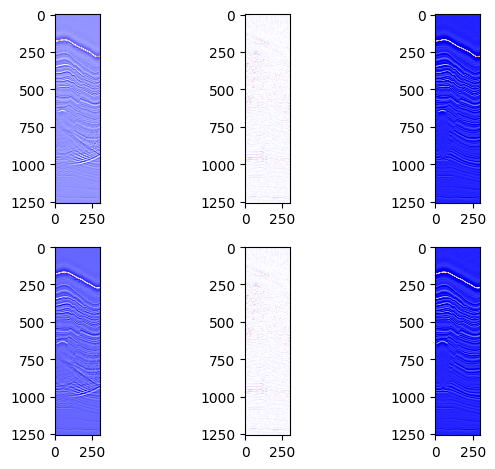

17/17 ━━━━━━━━━━━━━━━━━━━━ 152s 8s/step - ssim: 0.2353 - ssim_loss: 0.7269 - val_ssim: 0.2350 - val_ssim_loss: 0.7703 - learning_rate: 1.0000e-05
Epoch 2/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - ssim: 0.2801 - ssim_loss: 0.6968
End of epoch 1, Validation SSIM_Loss: 0.6156

End of epoch 1, Validation SSIM: 0.3235


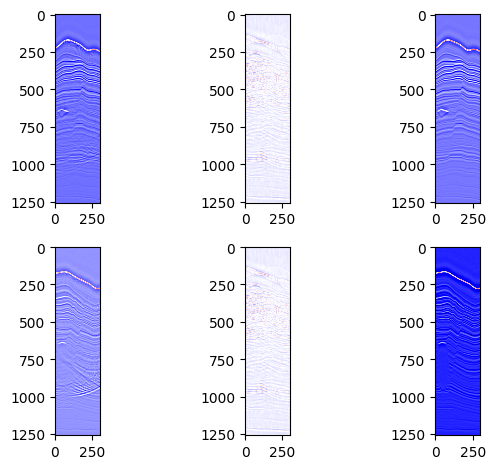

17/17 ━━━━━━━━━━━━━━━━━━━━ 138s 8s/step - ssim: 0.2814 - ssim_loss: 0.6929 - val_ssim: 0.3235 - val_ssim_loss: 0.6156 - learning_rate: 1.0000e-05
Epoch 3/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - ssim: 0.3041 - ssim_loss: 0.6955
End of epoch 2, Validation SSIM_Loss: 0.5606

End of epoch 2, Validation SSIM: 0.3439


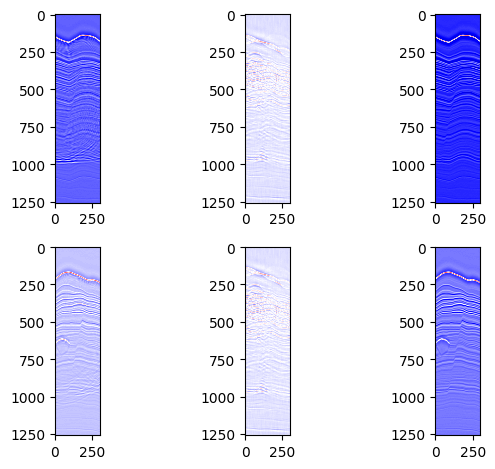

17/17 ━━━━━━━━━━━━━━━━━━━━ 135s 8s/step - ssim: 0.3041 - ssim_loss: 0.6954 - val_ssim: 0.3439 - val_ssim_loss: 0.5606 - learning_rate: 1.0000e-05
Epoch 4/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - ssim: 0.3272 - ssim_loss: 0.6787
End of epoch 3, Validation SSIM_Loss: 0.6586

End of epoch 3, Validation SSIM: 0.3373


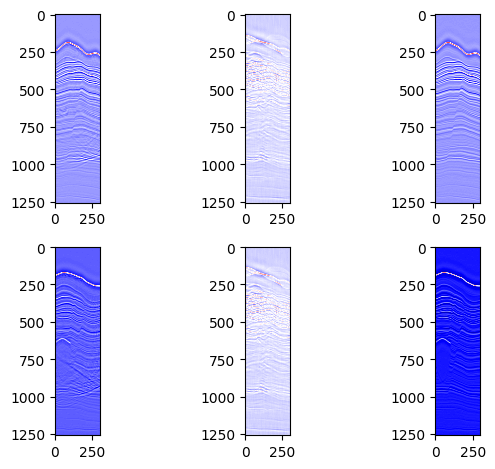

17/17 ━━━━━━━━━━━━━━━━━━━━ 93s 5s/step - ssim: 0.3268 - ssim_loss: 0.6824 - val_ssim: 0.3373 - val_ssim_loss: 0.6586 - learning_rate: 1.0000e-05
Epoch 5/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - ssim: 0.2857 - ssim_loss: 0.7023
End of epoch 4, Validation SSIM_Loss: 0.7083

End of epoch 4, Validation SSIM: 0.3066


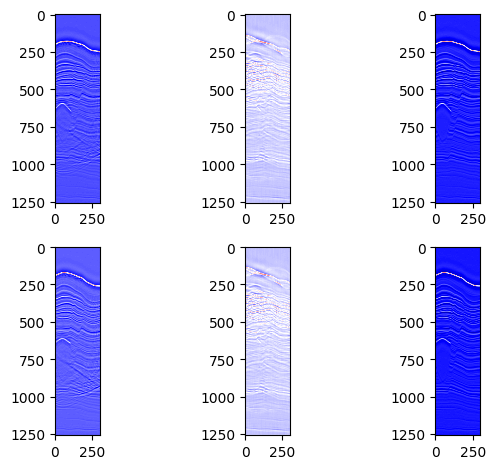

17/17 ━━━━━━━━━━━━━━━━━━━━ 96s 6s/step - ssim: 0.2864 - ssim_loss: 0.6986 - val_ssim: 0.3066 - val_ssim_loss: 0.7083 - learning_rate: 1.0000e-05
Epoch 6/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - ssim: 0.3278 - ssim_loss: 0.6679
End of epoch 5, Validation SSIM_Loss: 0.6510

End of epoch 5, Validation SSIM: 0.3336


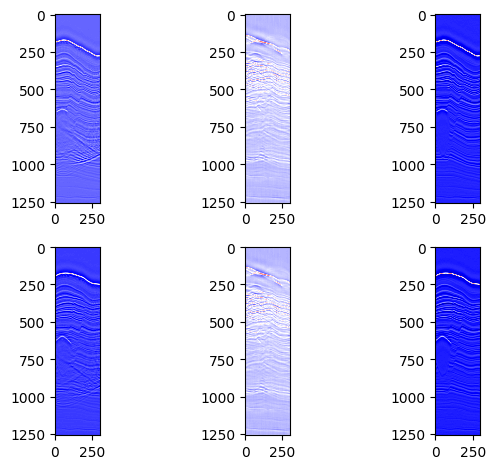

17/17 ━━━━━━━━━━━━━━━━━━━━ 97s 6s/step - ssim: 0.3281 - ssim_loss: 0.6709 - val_ssim: 0.3336 - val_ssim_loss: 0.6510 - learning_rate: 1.0000e-05
Epoch 7/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - ssim: 0.3440 - ssim_loss: 0.6612
Epoch 7: ReduceLROnPlateau reducing learning rate to 4.999999873689376e-06.

End of epoch 6, Validation SSIM_Loss: 0.7409

End of epoch 6, Validation SSIM: 0.3239


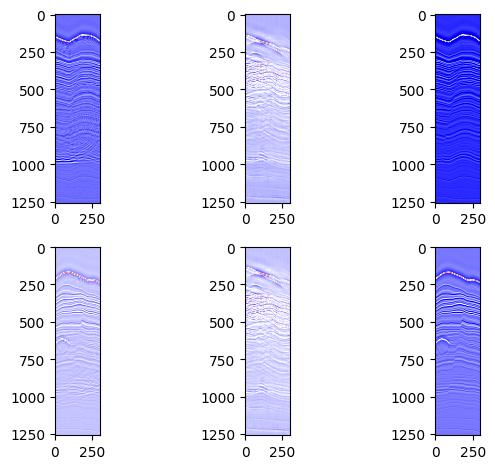

17/17 ━━━━━━━━━━━━━━━━━━━━ 97s 6s/step - ssim: 0.3437 - ssim_loss: 0.6590 - val_ssim: 0.3239 - val_ssim_loss: 0.7409 - learning_rate: 1.0000e-05
Epoch 8/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - ssim: 0.3671 - ssim_loss: 0.6313
End of epoch 7, Validation SSIM_Loss: 0.5720

End of epoch 7, Validation SSIM: 0.4154


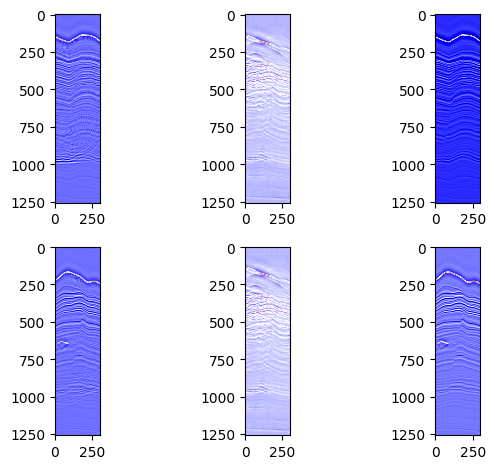

17/17 ━━━━━━━━━━━━━━━━━━━━ 98s 6s/step - ssim: 0.3672 - ssim_loss: 0.6331 - val_ssim: 0.4154 - val_ssim_loss: 0.5720 - learning_rate: 5.0000e-06
Epoch 9/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - ssim: 0.3890 - ssim_loss: 0.6073
End of epoch 8, Validation SSIM_Loss: 0.5317

End of epoch 8, Validation SSIM: 0.4492


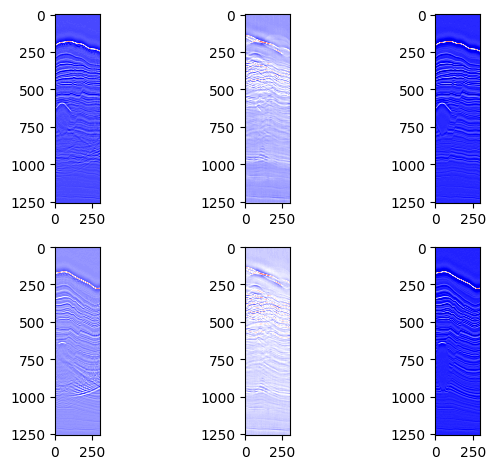

17/17 ━━━━━━━━━━━━━━━━━━━━ 147s 9s/step - ssim: 0.3892 - ssim_loss: 0.6068 - val_ssim: 0.4492 - val_ssim_loss: 0.5317 - learning_rate: 5.0000e-06
Epoch 10/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - ssim: 0.4173 - ssim_loss: 0.5869
End of epoch 9, Validation SSIM_Loss: 0.5115

End of epoch 9, Validation SSIM: 0.4600


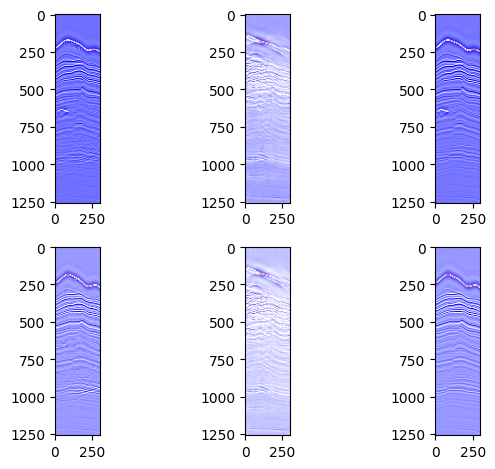

17/17 ━━━━━━━━━━━━━━━━━━━━ 142s 9s/step - ssim: 0.4171 - ssim_loss: 0.5894 - val_ssim: 0.4600 - val_ssim_loss: 0.5115 - learning_rate: 5.0000e-06
Epoch 11/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - ssim: 0.4200 - ssim_loss: 0.5676
End of epoch 10, Validation SSIM_Loss: 0.5205

End of epoch 10, Validation SSIM: 0.4541


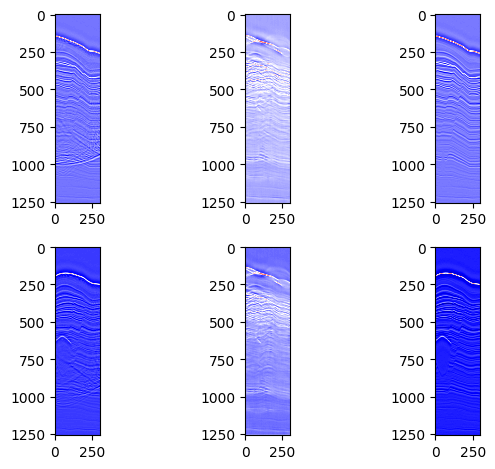

17/17 ━━━━━━━━━━━━━━━━━━━━ 104s 6s/step - ssim: 0.4207 - ssim_loss: 0.5624 - val_ssim: 0.4541 - val_ssim_loss: 0.5205 - learning_rate: 5.0000e-06
Epoch 12/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - ssim: 0.4049 - ssim_loss: 0.5780
End of epoch 11, Validation SSIM_Loss: 0.6969

End of epoch 11, Validation SSIM: 0.4342


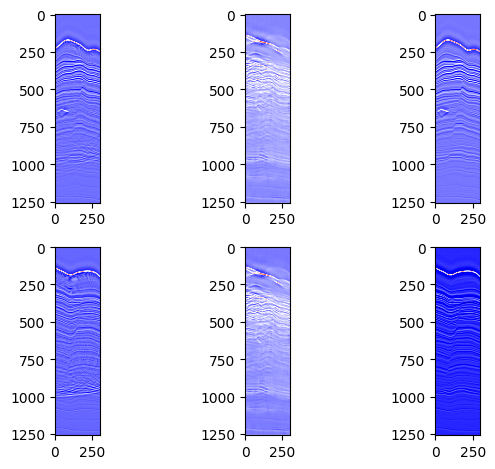

17/17 ━━━━━━━━━━━━━━━━━━━━ 107s 6s/step - ssim: 0.4059 - ssim_loss: 0.5749 - val_ssim: 0.4342 - val_ssim_loss: 0.6969 - learning_rate: 5.0000e-06
Epoch 13/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - ssim: 0.4840 - ssim_loss: 0.5493
End of epoch 12, Validation SSIM_Loss: 0.5208

End of epoch 12, Validation SSIM: 0.5083


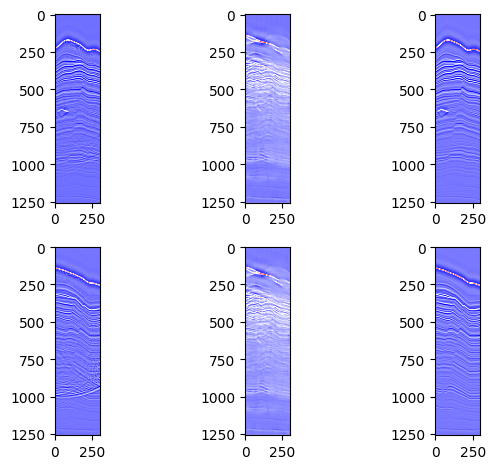

17/17 ━━━━━━━━━━━━━━━━━━━━ 108s 6s/step - ssim: 0.4822 - ssim_loss: 0.5510 - val_ssim: 0.5083 - val_ssim_loss: 0.5208 - learning_rate: 5.0000e-06
Epoch 14/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - ssim: 0.4857 - ssim_loss: 0.5173
End of epoch 13, Validation SSIM_Loss: 0.4632

End of epoch 13, Validation SSIM: 0.5293


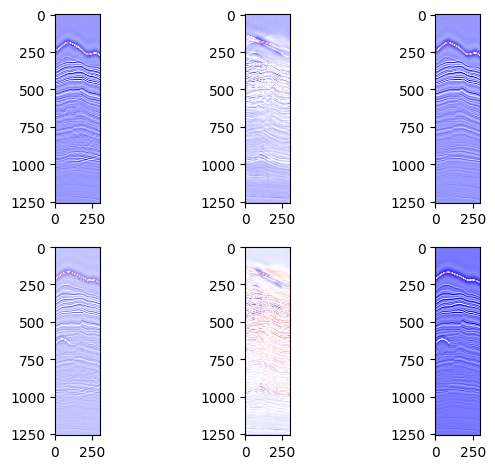

17/17 ━━━━━━━━━━━━━━━━━━━━ 149s 9s/step - ssim: 0.4855 - ssim_loss: 0.5125 - val_ssim: 0.5293 - val_ssim_loss: 0.4632 - learning_rate: 5.0000e-06
Epoch 15/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - ssim: 0.4548 - ssim_loss: 0.5156
End of epoch 14, Validation SSIM_Loss: 0.3081

End of epoch 14, Validation SSIM: 0.5407


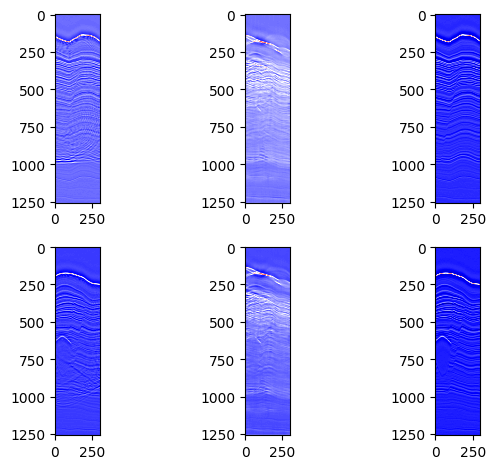

17/17 ━━━━━━━━━━━━━━━━━━━━ 139s 8s/step - ssim: 0.4564 - ssim_loss: 0.5116 - val_ssim: 0.5407 - val_ssim_loss: 0.3081 - learning_rate: 5.0000e-06
Epoch 16/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - ssim: 0.4962 - ssim_loss: 0.5155
End of epoch 15, Validation SSIM_Loss: 0.3813

End of epoch 15, Validation SSIM: 0.4889


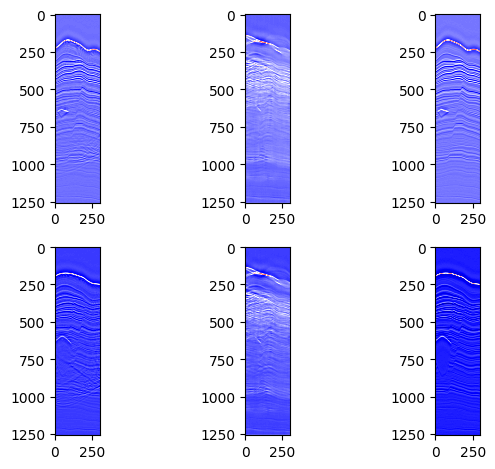

17/17 ━━━━━━━━━━━━━━━━━━━━ 109s 6s/step - ssim: 0.4956 - ssim_loss: 0.5169 - val_ssim: 0.4889 - val_ssim_loss: 0.3813 - learning_rate: 5.0000e-06
Epoch 17/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - ssim: 0.5114 - ssim_loss: 0.5194
End of epoch 16, Validation SSIM_Loss: 0.4933

End of epoch 16, Validation SSIM: 0.4965


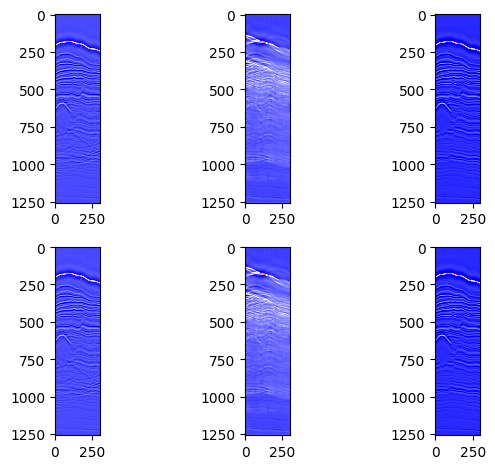

17/17 ━━━━━━━━━━━━━━━━━━━━ 109s 6s/step - ssim: 0.5097 - ssim_loss: 0.5183 - val_ssim: 0.4965 - val_ssim_loss: 0.4933 - learning_rate: 5.0000e-06
Epoch 18/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - ssim: 0.4710 - ssim_loss: 0.5076
End of epoch 17, Validation SSIM_Loss: 0.4099

End of epoch 17, Validation SSIM: 0.5928


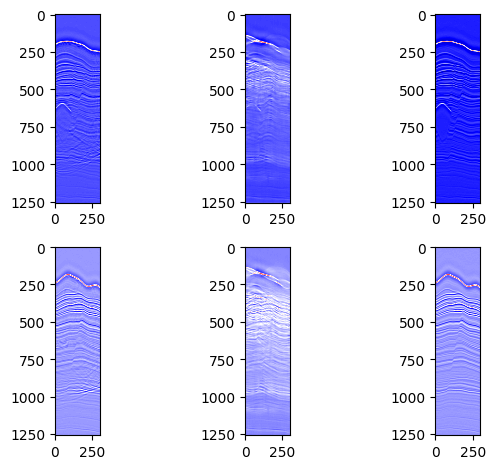

17/17 ━━━━━━━━━━━━━━━━━━━━ 110s 6s/step - ssim: 0.4721 - ssim_loss: 0.5022 - val_ssim: 0.5928 - val_ssim_loss: 0.4099 - learning_rate: 5.0000e-06
Epoch 19/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - ssim: 0.5014 - ssim_loss: 0.4941
Epoch 19: ReduceLROnPlateau reducing learning rate to 2.499999936844688e-06.

End of epoch 18, Validation SSIM_Loss: 0.3616

End of epoch 18, Validation SSIM: 0.5451


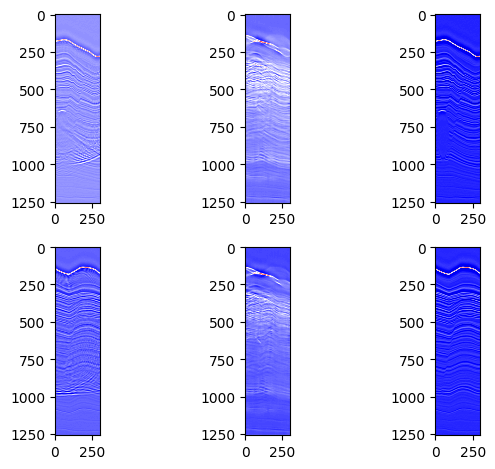

17/17 ━━━━━━━━━━━━━━━━━━━━ 111s 7s/step - ssim: 0.5016 - ssim_loss: 0.4884 - val_ssim: 0.5451 - val_ssim_loss: 0.3616 - learning_rate: 5.0000e-06
Epoch 20/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - ssim: 0.5196 - ssim_loss: 0.4797
End of epoch 19, Validation SSIM_Loss: 0.4579

End of epoch 19, Validation SSIM: 0.5262


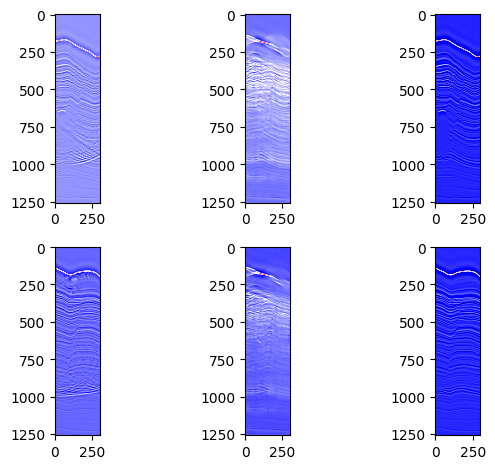

17/17 ━━━━━━━━━━━━━━━━━━━━ 111s 7s/step - ssim: 0.5196 - ssim_loss: 0.4775 - val_ssim: 0.5262 - val_ssim_loss: 0.4579 - learning_rate: 2.5000e-06
Epoch 21/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - ssim: 0.5134 - ssim_loss: 0.4850
End of epoch 20, Validation SSIM_Loss: 0.5335

End of epoch 20, Validation SSIM: 0.5337


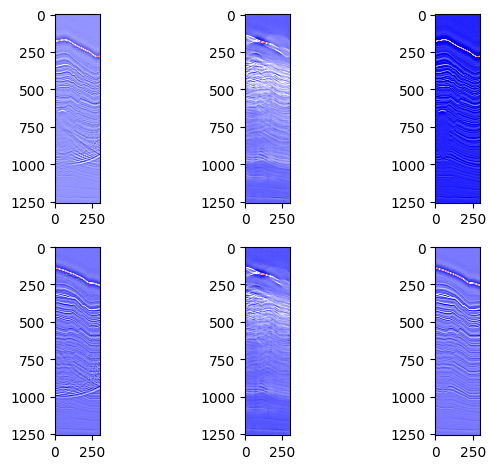

17/17 ━━━━━━━━━━━━━━━━━━━━ 111s 7s/step - ssim: 0.5135 - ssim_loss: 0.4833 - val_ssim: 0.5337 - val_ssim_loss: 0.5335 - learning_rate: 2.5000e-06
Epoch 22/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - ssim: 0.5423 - ssim_loss: 0.4732
End of epoch 21, Validation SSIM_Loss: 0.5017

End of epoch 21, Validation SSIM: 0.5698


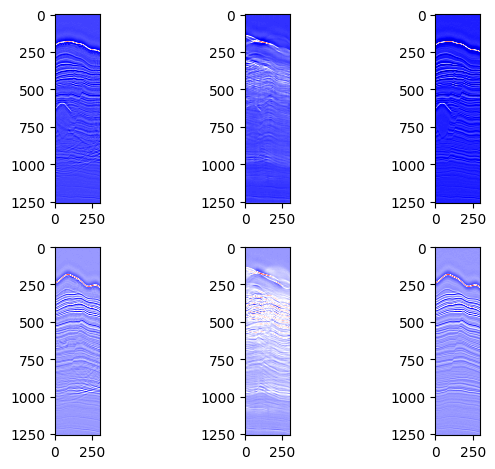

17/17 ━━━━━━━━━━━━━━━━━━━━ 111s 7s/step - ssim: 0.5414 - ssim_loss: 0.4935 - val_ssim: 0.5698 - val_ssim_loss: 0.5017 - learning_rate: 2.5000e-06
Epoch 23/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - ssim: 0.5195 - ssim_loss: 0.4695
Epoch 23: ReduceLROnPlateau reducing learning rate to 1.249999968422344e-06.

End of epoch 22, Validation SSIM_Loss: 0.5204

End of epoch 22, Validation SSIM: 0.5370


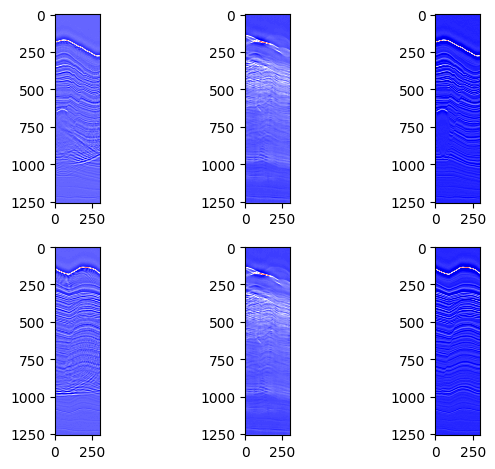

17/17 ━━━━━━━━━━━━━━━━━━━━ 111s 7s/step - ssim: 0.5201 - ssim_loss: 0.4631 - val_ssim: 0.5370 - val_ssim_loss: 0.5204 - learning_rate: 2.5000e-06
Epoch 24/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - ssim: 0.4738 - ssim_loss: 0.5086
End of epoch 23, Validation SSIM_Loss: 0.5309

End of epoch 23, Validation SSIM: 0.5345


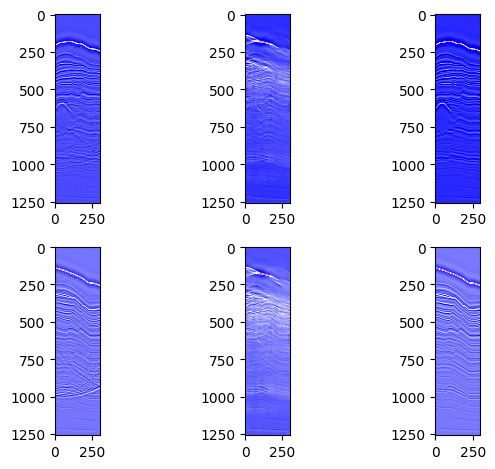

17/17 ━━━━━━━━━━━━━━━━━━━━ 111s 7s/step - ssim: 0.4748 - ssim_loss: 0.5101 - val_ssim: 0.5345 - val_ssim_loss: 0.5309 - learning_rate: 1.2500e-06
Epoch 25/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - ssim: 0.5347 - ssim_loss: 0.4703
End of epoch 24, Validation SSIM_Loss: 0.3660

End of epoch 24, Validation SSIM: 0.5588


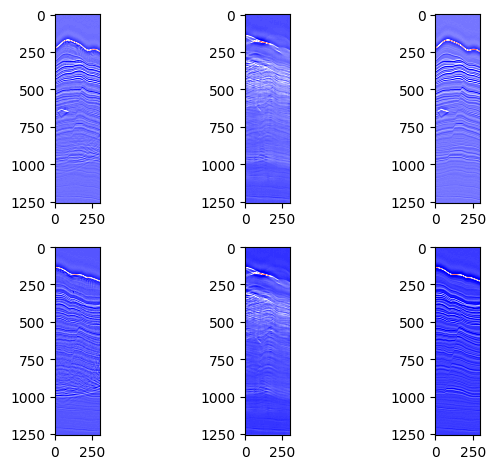

17/17 ━━━━━━━━━━━━━━━━━━━━ 112s 7s/step - ssim: 0.5344 - ssim_loss: 0.4729 - val_ssim: 0.5588 - val_ssim_loss: 0.3660 - learning_rate: 1.2500e-06
Epoch 26/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - ssim: 0.5059 - ssim_loss: 0.4772
End of epoch 25, Validation SSIM_Loss: 0.4724

End of epoch 25, Validation SSIM: 0.5562


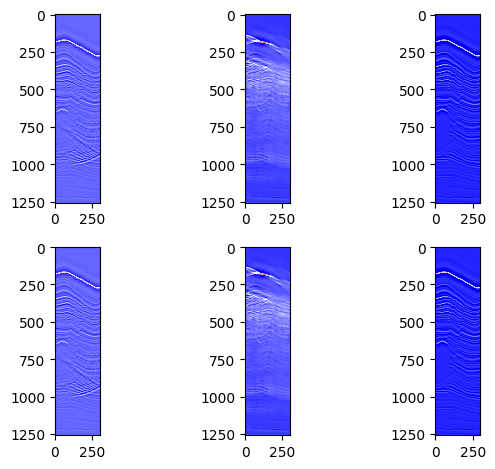

17/17 ━━━━━━━━━━━━━━━━━━━━ 112s 7s/step - ssim: 0.5068 - ssim_loss: 0.4705 - val_ssim: 0.5562 - val_ssim_loss: 0.4724 - learning_rate: 1.2500e-06
Epoch 27/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - ssim: 0.5112 - ssim_loss: 0.4753
Epoch 27: ReduceLROnPlateau reducing learning rate to 6.24999984211172e-07.

End of epoch 26, Validation SSIM_Loss: 0.3828

End of epoch 26, Validation SSIM: 0.5514


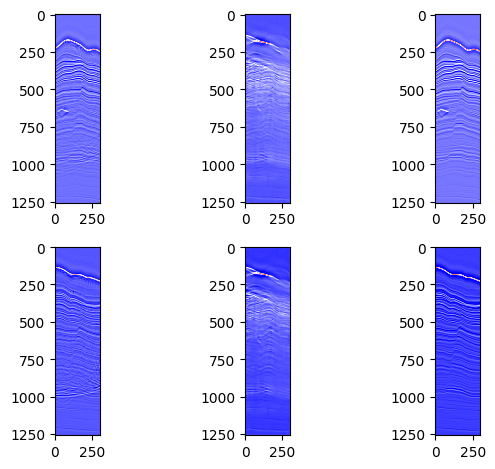

17/17 ━━━━━━━━━━━━━━━━━━━━ 112s 7s/step - ssim: 0.5120 - ssim_loss: 0.4745 - val_ssim: 0.5514 - val_ssim_loss: 0.3828 - learning_rate: 1.2500e-06
Epoch 28/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - ssim: 0.5252 - ssim_loss: 0.4622
End of epoch 27, Validation SSIM_Loss: 0.5415

End of epoch 27, Validation SSIM: 0.5299


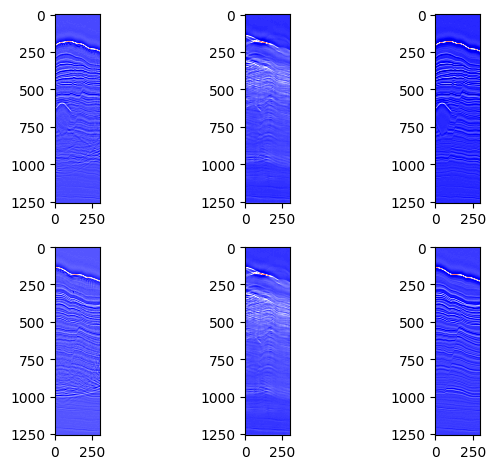

17/17 ━━━━━━━━━━━━━━━━━━━━ 113s 7s/step - ssim: 0.5259 - ssim_loss: 0.4540 - val_ssim: 0.5299 - val_ssim_loss: 0.5415 - learning_rate: 6.2500e-07
Epoch 29/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - ssim: 0.5381 - ssim_loss: 0.4750
End of epoch 28, Validation SSIM_Loss: 0.3686

End of epoch 28, Validation SSIM: 0.5920


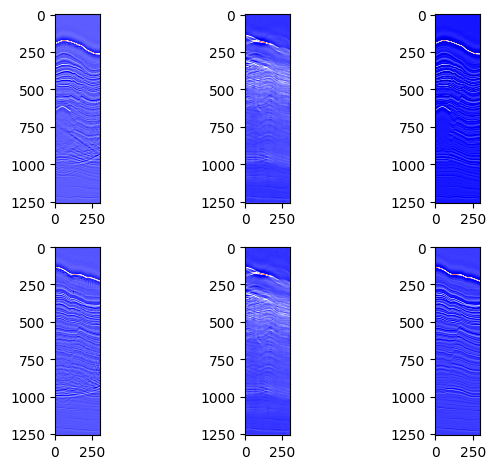

17/17 ━━━━━━━━━━━━━━━━━━━━ 114s 7s/step - ssim: 0.5373 - ssim_loss: 0.4818 - val_ssim: 0.5920 - val_ssim_loss: 0.3686 - learning_rate: 6.2500e-07
Epoch 30/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - ssim: 0.5320 - ssim_loss: 0.4470
End of epoch 29, Validation SSIM_Loss: 0.3104

End of epoch 29, Validation SSIM: 0.6362


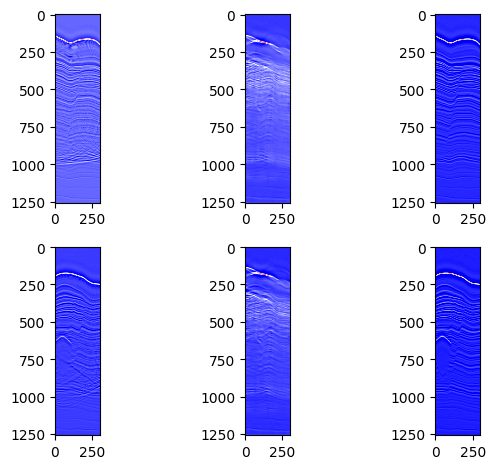

17/17 ━━━━━━━━━━━━━━━━━━━━ 116s 7s/step - ssim: 0.5332 - ssim_loss: 0.4474 - val_ssim: 0.6362 - val_ssim_loss: 0.3104 - learning_rate: 6.2500e-07
Epoch 31/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - ssim: 0.5448 - ssim_loss: 0.4725
Epoch 31: ReduceLROnPlateau reducing learning rate to 3.12499992105586e-07.

End of epoch 30, Validation SSIM_Loss: 0.4972

End of epoch 30, Validation SSIM: 0.5144


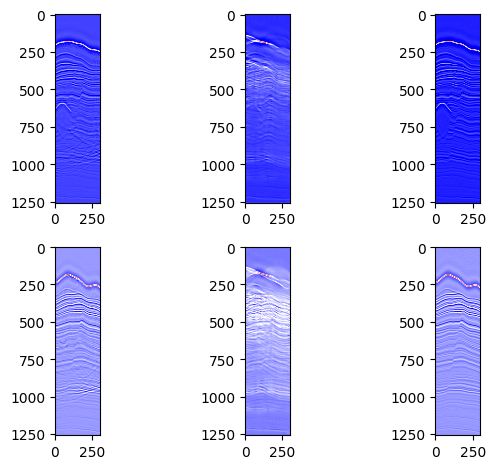

17/17 ━━━━━━━━━━━━━━━━━━━━ 118s 7s/step - ssim: 0.5438 - ssim_loss: 0.4621 - val_ssim: 0.5144 - val_ssim_loss: 0.4972 - learning_rate: 6.2500e-07
Epoch 32/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - ssim: 0.5000 - ssim_loss: 0.4851
End of epoch 31, Validation SSIM_Loss: 0.4219

End of epoch 31, Validation SSIM: 0.5823


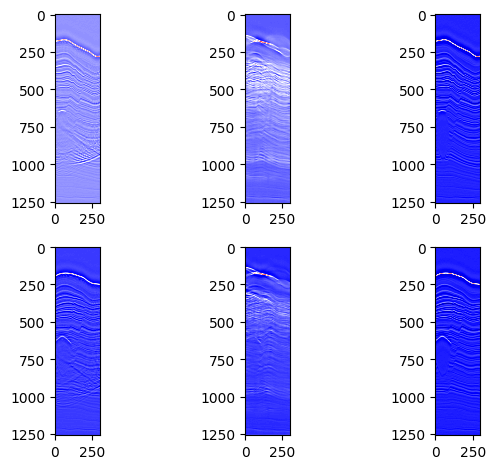

17/17 ━━━━━━━━━━━━━━━━━━━━ 119s 7s/step - ssim: 0.5008 - ssim_loss: 0.4843 - val_ssim: 0.5823 - val_ssim_loss: 0.4219 - learning_rate: 3.1250e-07
Epoch 33/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - ssim: 0.5215 - ssim_loss: 0.4609
End of epoch 32, Validation SSIM_Loss: 0.4176

End of epoch 32, Validation SSIM: 0.5408


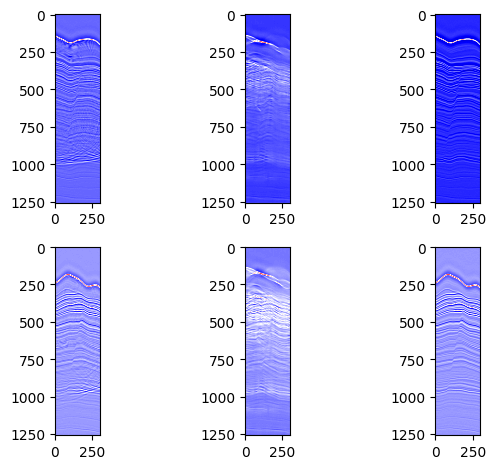

17/17 ━━━━━━━━━━━━━━━━━━━━ 120s 7s/step - ssim: 0.5225 - ssim_loss: 0.4584 - val_ssim: 0.5408 - val_ssim_loss: 0.4176 - learning_rate: 3.1250e-07
Epoch 34/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - ssim: 0.5854 - ssim_loss: 0.4342
End of epoch 33, Validation SSIM_Loss: 0.4270

End of epoch 33, Validation SSIM: 0.5746


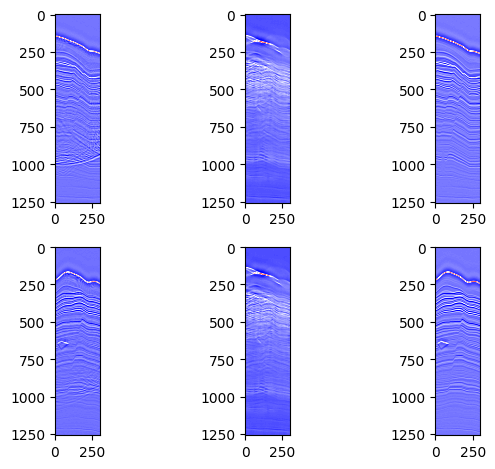

17/17 ━━━━━━━━━━━━━━━━━━━━ 120s 7s/step - ssim: 0.5843 - ssim_loss: 0.4386 - val_ssim: 0.5746 - val_ssim_loss: 0.4270 - learning_rate: 3.1250e-07
Epoch 35/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - ssim: 0.5359 - ssim_loss: 0.4521
Epoch 35: ReduceLROnPlateau reducing learning rate to 1.56249996052793e-07.

End of epoch 34, Validation SSIM_Loss: 0.3993

End of epoch 34, Validation SSIM: 0.6004


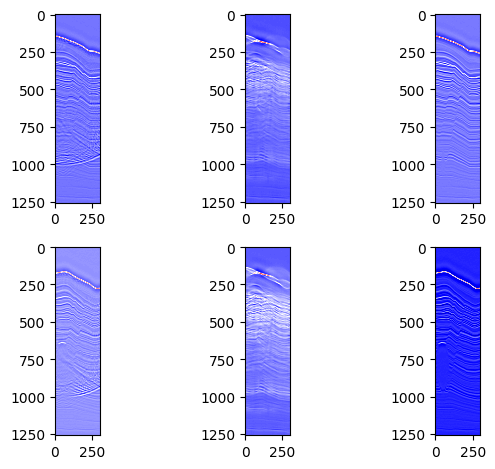

17/17 ━━━━━━━━━━━━━━━━━━━━ 119s 7s/step - ssim: 0.5366 - ssim_loss: 0.4554 - val_ssim: 0.6004 - val_ssim_loss: 0.3993 - learning_rate: 3.1250e-07
Epoch 36/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - ssim: 0.5614 - ssim_loss: 0.4620
End of epoch 35, Validation SSIM_Loss: 0.4200

End of epoch 35, Validation SSIM: 0.5788


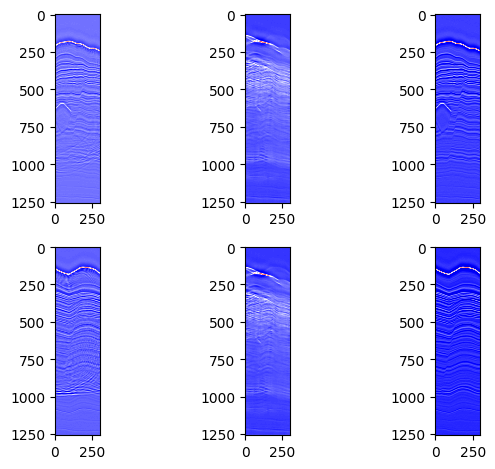

17/17 ━━━━━━━━━━━━━━━━━━━━ 117s 7s/step - ssim: 0.5601 - ssim_loss: 0.4578 - val_ssim: 0.5788 - val_ssim_loss: 0.4200 - learning_rate: 1.5625e-07
Epoch 37/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - ssim: 0.4880 - ssim_loss: 0.4607
End of epoch 36, Validation SSIM_Loss: 0.5034

End of epoch 36, Validation SSIM: 0.5634


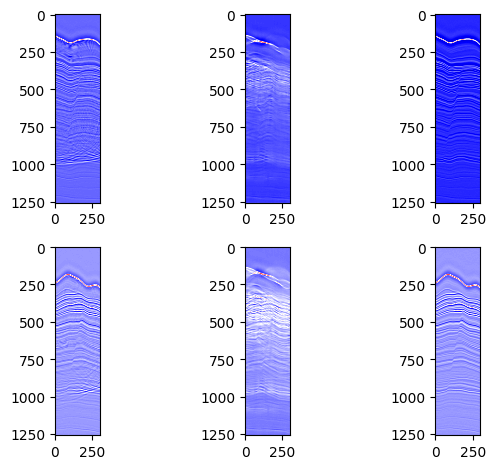

17/17 ━━━━━━━━━━━━━━━━━━━━ 115s 7s/step - ssim: 0.4909 - ssim_loss: 0.4616 - val_ssim: 0.5634 - val_ssim_loss: 0.5034 - learning_rate: 1.5625e-07
Epoch 38/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - ssim: 0.5178 - ssim_loss: 0.4624
End of epoch 37, Validation SSIM_Loss: 0.4346

End of epoch 37, Validation SSIM: 0.5704


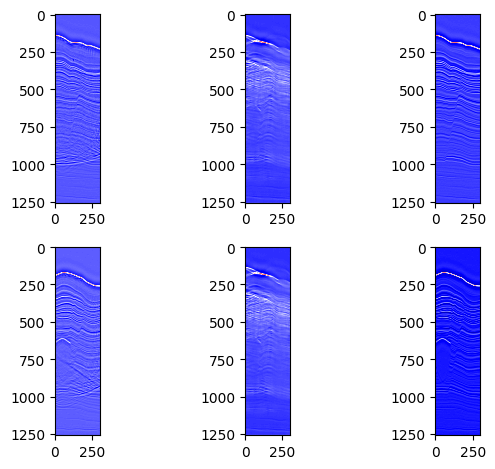

17/17 ━━━━━━━━━━━━━━━━━━━━ 114s 7s/step - ssim: 0.5189 - ssim_loss: 0.4716 - val_ssim: 0.5704 - val_ssim_loss: 0.4346 - learning_rate: 1.5625e-07
Epoch 39/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - ssim: 0.4978 - ssim_loss: 0.5004
Epoch 39: ReduceLROnPlateau reducing learning rate to 7.81249980263965e-08.

End of epoch 38, Validation SSIM_Loss: 0.3854

End of epoch 38, Validation SSIM: 0.5544


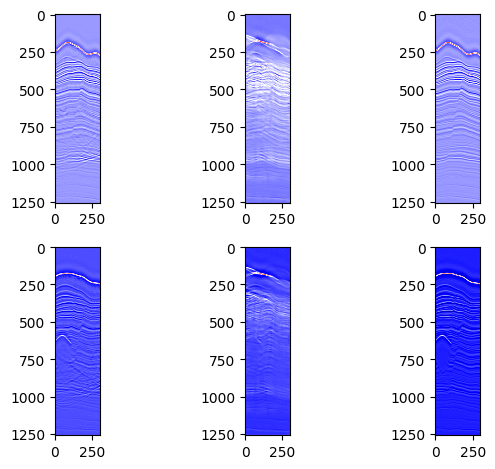

17/17 ━━━━━━━━━━━━━━━━━━━━ 113s 7s/step - ssim: 0.4979 - ssim_loss: 0.5212 - val_ssim: 0.5544 - val_ssim_loss: 0.3854 - learning_rate: 1.5625e-07
Epoch 40/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - ssim: 0.5492 - ssim_loss: 0.4608
End of epoch 39, Validation SSIM_Loss: 0.4008

End of epoch 39, Validation SSIM: 0.5227


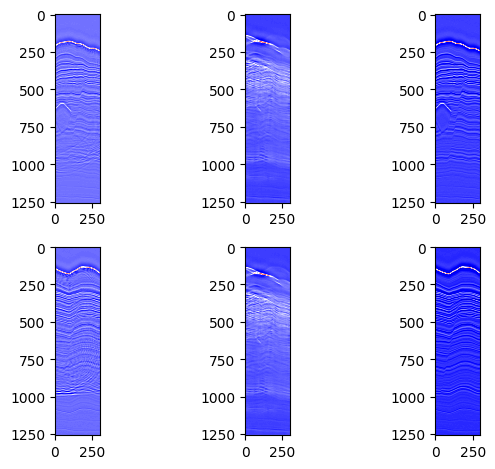

17/17 ━━━━━━━━━━━━━━━━━━━━ 112s 7s/step - ssim: 0.5487 - ssim_loss: 0.4667 - val_ssim: 0.5227 - val_ssim_loss: 0.4008 - learning_rate: 7.8125e-08
Epoch 41/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - ssim: 0.5793 - ssim_loss: 0.4433
End of epoch 40, Validation SSIM_Loss: 0.4408

End of epoch 40, Validation SSIM: 0.5895


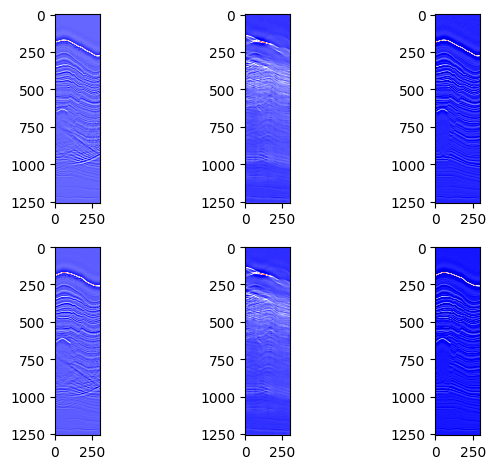

17/17 ━━━━━━━━━━━━━━━━━━━━ 111s 6s/step - ssim: 0.5780 - ssim_loss: 0.4521 - val_ssim: 0.5895 - val_ssim_loss: 0.4408 - learning_rate: 7.8125e-08
Epoch 42/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - ssim: 0.4710 - ssim_loss: 0.4713
End of epoch 41, Validation SSIM_Loss: 0.3746

End of epoch 41, Validation SSIM: 0.6085


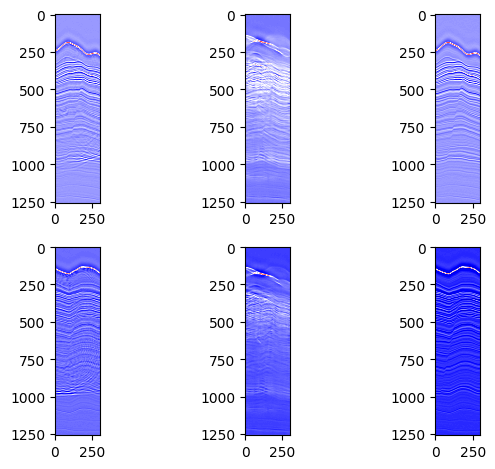

17/17 ━━━━━━━━━━━━━━━━━━━━ 109s 6s/step - ssim: 0.4743 - ssim_loss: 0.4653 - val_ssim: 0.6085 - val_ssim_loss: 0.3746 - learning_rate: 7.8125e-08
Epoch 43/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - ssim: 0.5464 - ssim_loss: 0.4743
Epoch 43: ReduceLROnPlateau reducing learning rate to 3.906249901319825e-08.

End of epoch 42, Validation SSIM_Loss: 0.3539

End of epoch 42, Validation SSIM: 0.6428


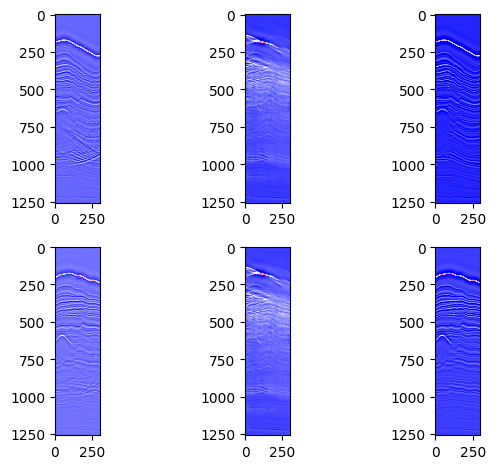

17/17 ━━━━━━━━━━━━━━━━━━━━ 108s 6s/step - ssim: 0.5452 - ssim_loss: 0.4727 - val_ssim: 0.6428 - val_ssim_loss: 0.3539 - learning_rate: 7.8125e-08
Epoch 44/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - ssim: 0.5868 - ssim_loss: 0.4524
End of epoch 43, Validation SSIM_Loss: 0.4236

End of epoch 43, Validation SSIM: 0.6061


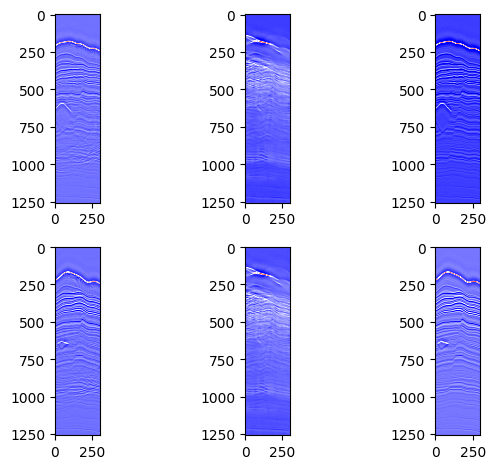

17/17 ━━━━━━━━━━━━━━━━━━━━ 107s 6s/step - ssim: 0.5846 - ssim_loss: 0.4570 - val_ssim: 0.6061 - val_ssim_loss: 0.4236 - learning_rate: 3.9062e-08
Epoch 45/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - ssim: 0.5554 - ssim_loss: 0.4459
End of epoch 44, Validation SSIM_Loss: 0.4878

End of epoch 44, Validation SSIM: 0.5608


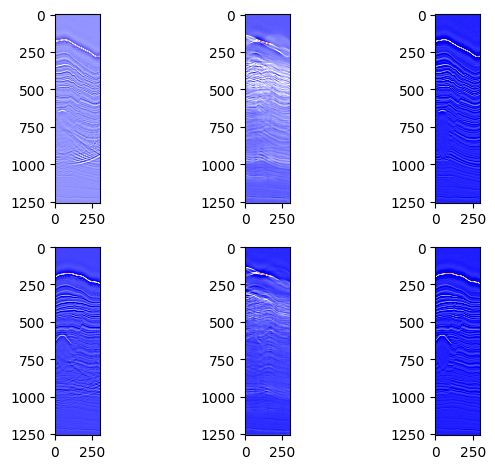

17/17 ━━━━━━━━━━━━━━━━━━━━ 108s 6s/step - ssim: 0.5553 - ssim_loss: 0.4534 - val_ssim: 0.5608 - val_ssim_loss: 0.4878 - learning_rate: 3.9062e-08
Epoch 46/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - ssim: 0.5240 - ssim_loss: 0.4635
End of epoch 45, Validation SSIM_Loss: 0.3169

End of epoch 45, Validation SSIM: 0.5789


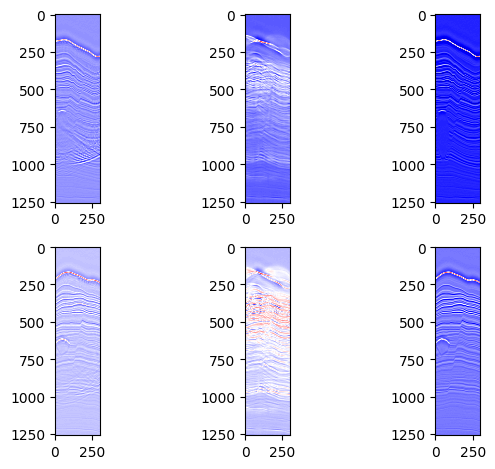

17/17 ━━━━━━━━━━━━━━━━━━━━ 108s 6s/step - ssim: 0.5247 - ssim_loss: 0.4620 - val_ssim: 0.5789 - val_ssim_loss: 0.3169 - learning_rate: 3.9062e-08
Epoch 47/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - ssim: 0.5242 - ssim_loss: 0.4536
Epoch 47: ReduceLROnPlateau reducing learning rate to 1.9531249506599124e-08.

End of epoch 46, Validation SSIM_Loss: 0.5691

End of epoch 46, Validation SSIM: 0.5374


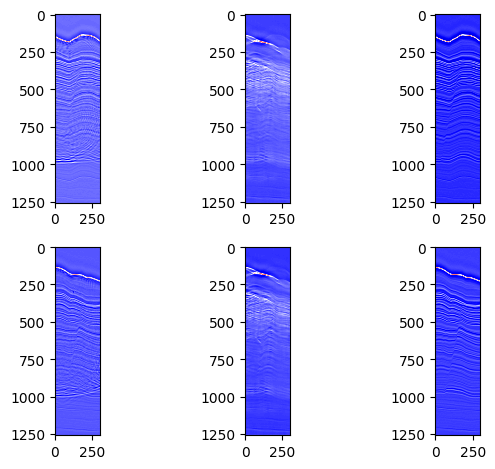

17/17 ━━━━━━━━━━━━━━━━━━━━ 109s 6s/step - ssim: 0.5254 - ssim_loss: 0.4555 - val_ssim: 0.5374 - val_ssim_loss: 0.5691 - learning_rate: 3.9062e-08
Epoch 48/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - ssim: 0.5202 - ssim_loss: 0.4778
End of epoch 47, Validation SSIM_Loss: 0.5955

End of epoch 47, Validation SSIM: 0.5122


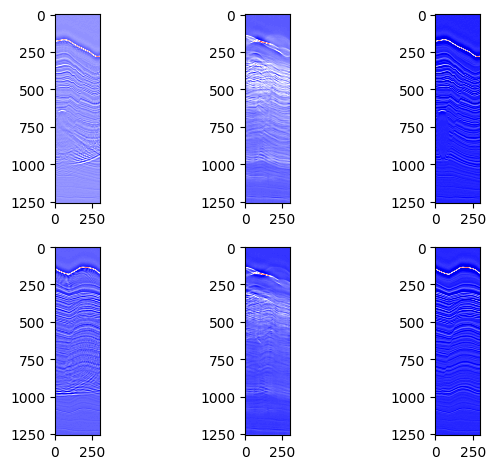

17/17 ━━━━━━━━━━━━━━━━━━━━ 109s 6s/step - ssim: 0.5203 - ssim_loss: 0.4766 - val_ssim: 0.5122 - val_ssim_loss: 0.5955 - learning_rate: 1.9531e-08
Epoch 49/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - ssim: 0.5467 - ssim_loss: 0.4872
End of epoch 48, Validation SSIM_Loss: 0.5936

End of epoch 48, Validation SSIM: 0.4735


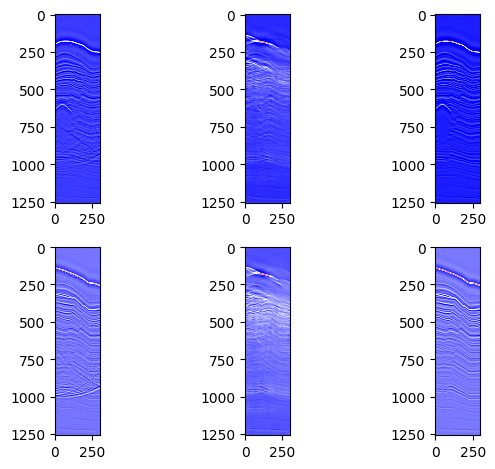

17/17 ━━━━━━━━━━━━━━━━━━━━ 111s 7s/step - ssim: 0.5449 - ssim_loss: 0.4892 - val_ssim: 0.4735 - val_ssim_loss: 0.5936 - learning_rate: 1.9531e-08
Epoch 50/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - ssim: 0.5428 - ssim_loss: 0.4501
End of epoch 49, Validation SSIM_Loss: 0.3577

End of epoch 49, Validation SSIM: 0.6478


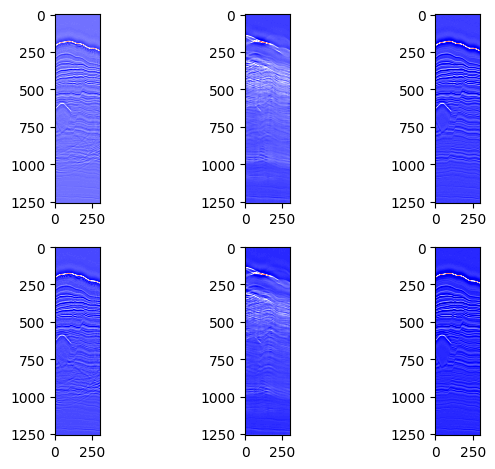

17/17 ━━━━━━━━━━━━━━━━━━━━ 112s 7s/step - ssim: 0.5432 - ssim_loss: 0.4503 - val_ssim: 0.6478 - val_ssim_loss: 0.3577 - learning_rate: 1.9531e-08
Epoch 51/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - ssim: 0.4849 - ssim_loss: 0.4584
Epoch 51: ReduceLROnPlateau reducing learning rate to 9.765624753299562e-09.

End of epoch 50, Validation SSIM_Loss: 0.3808

End of epoch 50, Validation SSIM: 0.5877


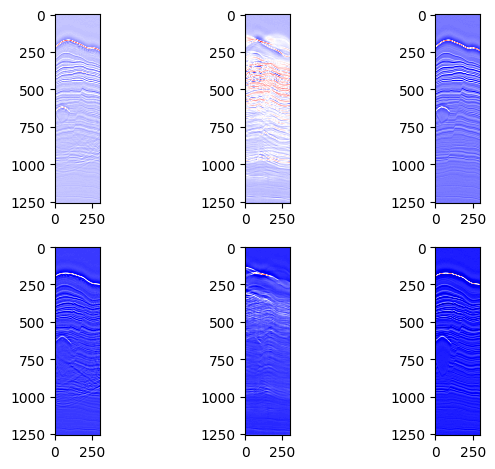

17/17 ━━━━━━━━━━━━━━━━━━━━ 112s 7s/step - ssim: 0.4880 - ssim_loss: 0.4537 - val_ssim: 0.5877 - val_ssim_loss: 0.3808 - learning_rate: 1.9531e-08
Epoch 52/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - ssim: 0.5431 - ssim_loss: 0.4633
End of epoch 51, Validation SSIM_Loss: 0.5101

End of epoch 51, Validation SSIM: 0.5157


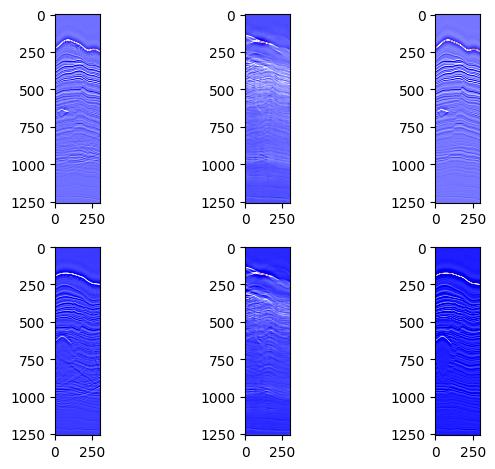

17/17 ━━━━━━━━━━━━━━━━━━━━ 113s 7s/step - ssim: 0.5428 - ssim_loss: 0.4624 - val_ssim: 0.5157 - val_ssim_loss: 0.5101 - learning_rate: 9.7656e-09
Epoch 53/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - ssim: 0.5249 - ssim_loss: 0.4662
End of epoch 52, Validation SSIM_Loss: 0.4754

End of epoch 52, Validation SSIM: 0.5566


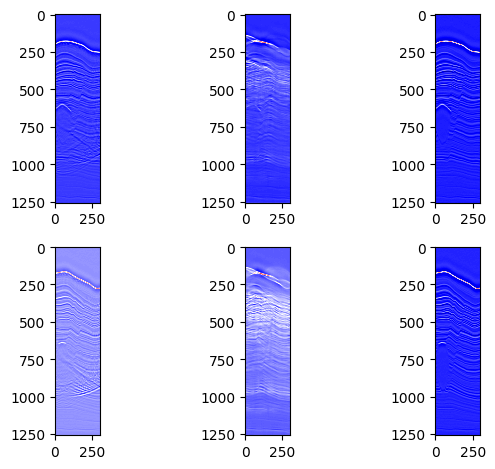

17/17 ━━━━━━━━━━━━━━━━━━━━ 112s 7s/step - ssim: 0.5254 - ssim_loss: 0.4624 - val_ssim: 0.5566 - val_ssim_loss: 0.4754 - learning_rate: 9.7656e-09
Epoch 54/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - ssim: 0.4648 - ssim_loss: 0.4810
End of epoch 53, Validation SSIM_Loss: 0.4096

End of epoch 53, Validation SSIM: 0.5590


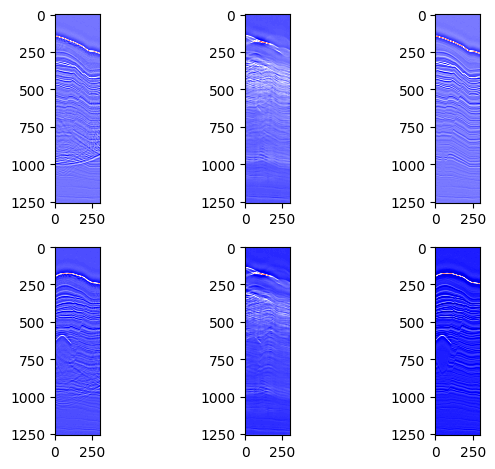

17/17 ━━━━━━━━━━━━━━━━━━━━ 114s 7s/step - ssim: 0.4678 - ssim_loss: 0.4759 - val_ssim: 0.5590 - val_ssim_loss: 0.4096 - learning_rate: 9.7656e-09
Epoch 55/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - ssim: 0.5284 - ssim_loss: 0.4774
Epoch 55: ReduceLROnPlateau reducing learning rate to 4.882812376649781e-09.

End of epoch 54, Validation SSIM_Loss: 0.4547

End of epoch 54, Validation SSIM: 0.5394


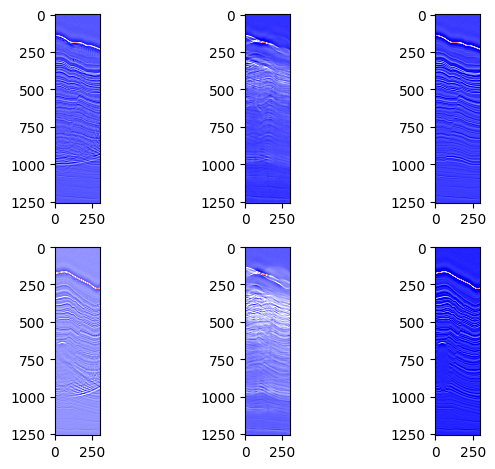

17/17 ━━━━━━━━━━━━━━━━━━━━ 116s 7s/step - ssim: 0.5281 - ssim_loss: 0.4815 - val_ssim: 0.5394 - val_ssim_loss: 0.4547 - learning_rate: 9.7656e-09
Epoch 56/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - ssim: 0.5486 - ssim_loss: 0.4620
End of epoch 55, Validation SSIM_Loss: 0.4593

End of epoch 55, Validation SSIM: 0.5118


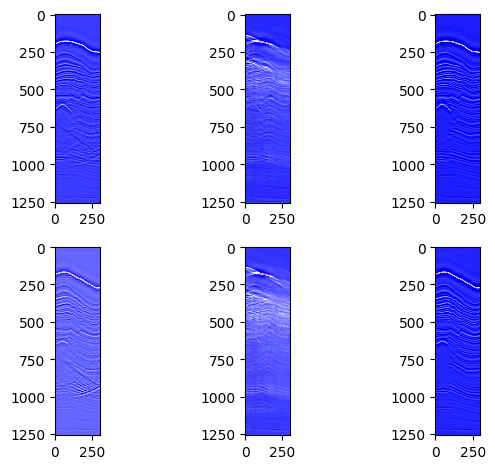

17/17 ━━━━━━━━━━━━━━━━━━━━ 116s 7s/step - ssim: 0.5480 - ssim_loss: 0.4608 - val_ssim: 0.5118 - val_ssim_loss: 0.4593 - learning_rate: 4.8828e-09
Epoch 57/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - ssim: 0.5330 - ssim_loss: 0.4911
End of epoch 56, Validation SSIM_Loss: 0.4229

End of epoch 56, Validation SSIM: 0.5140


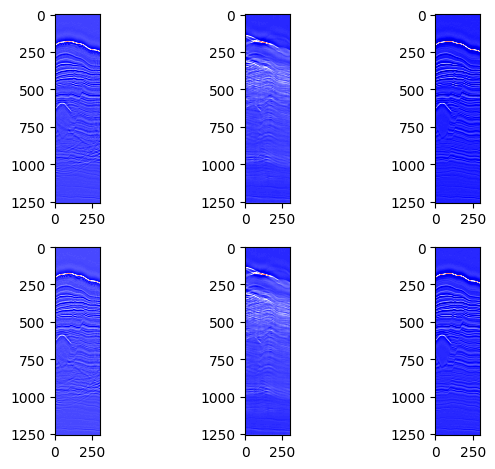

17/17 ━━━━━━━━━━━━━━━━━━━━ 117s 7s/step - ssim: 0.5317 - ssim_loss: 0.4883 - val_ssim: 0.5140 - val_ssim_loss: 0.4229 - learning_rate: 4.8828e-09
Epoch 58/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - ssim: 0.5887 - ssim_loss: 0.4087
End of epoch 57, Validation SSIM_Loss: 0.3531

End of epoch 57, Validation SSIM: 0.6017


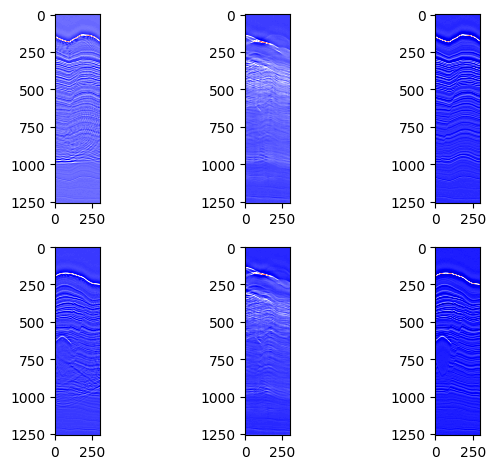

17/17 ━━━━━━━━━━━━━━━━━━━━ 117s 7s/step - ssim: 0.5888 - ssim_loss: 0.4046 - val_ssim: 0.6017 - val_ssim_loss: 0.3531 - learning_rate: 4.8828e-09
Epoch 59/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - ssim: 0.5723 - ssim_loss: 0.4397
Epoch 59: ReduceLROnPlateau reducing learning rate to 2.4414061883248905e-09.

End of epoch 58, Validation SSIM_Loss: 0.4077

End of epoch 58, Validation SSIM: 0.5911


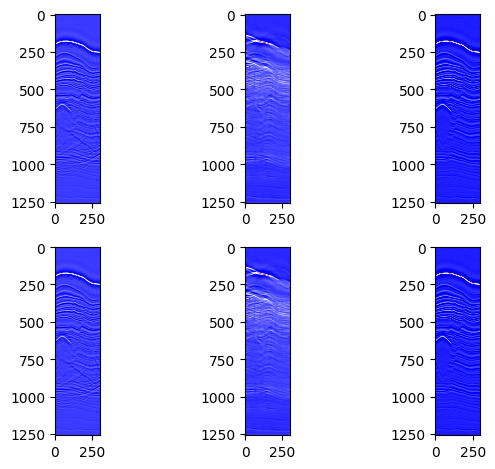

17/17 ━━━━━━━━━━━━━━━━━━━━ 117s 7s/step - ssim: 0.5716 - ssim_loss: 0.4368 - val_ssim: 0.5911 - val_ssim_loss: 0.4077 - learning_rate: 4.8828e-09
Epoch 60/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - ssim: 0.5258 - ssim_loss: 0.4700
End of epoch 59, Validation SSIM_Loss: 0.3894

End of epoch 59, Validation SSIM: 0.5527


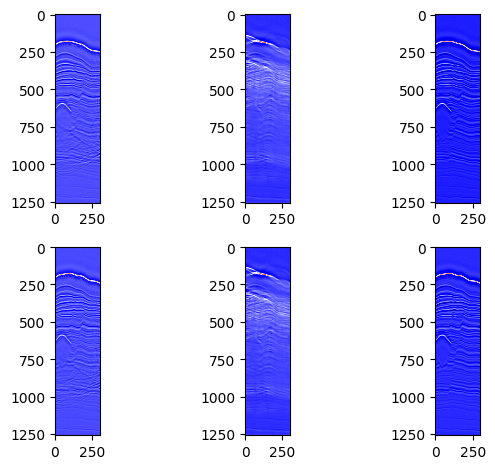

17/17 ━━━━━━━━━━━━━━━━━━━━ 117s 7s/step - ssim: 0.5260 - ssim_loss: 0.4687 - val_ssim: 0.5527 - val_ssim_loss: 0.3894 - learning_rate: 2.4414e-09
Epoch 61/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - ssim: 0.5336 - ssim_loss: 0.4518
End of epoch 60, Validation SSIM_Loss: 0.4238

End of epoch 60, Validation SSIM: 0.5041


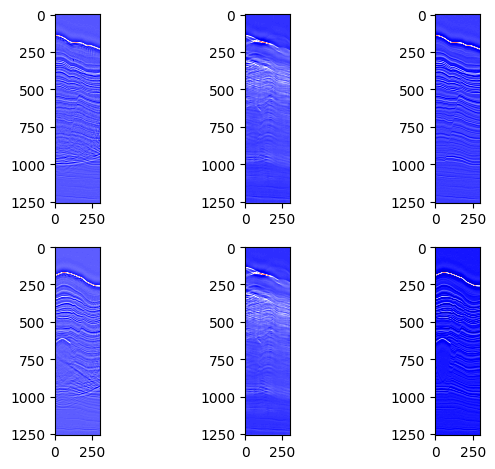

17/17 ━━━━━━━━━━━━━━━━━━━━ 117s 7s/step - ssim: 0.5345 - ssim_loss: 0.4516 - val_ssim: 0.5041 - val_ssim_loss: 0.4238 - learning_rate: 2.4414e-09
Epoch 62/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - ssim: 0.5330 - ssim_loss: 0.4747
End of epoch 61, Validation SSIM_Loss: 0.5197

End of epoch 61, Validation SSIM: 0.5259


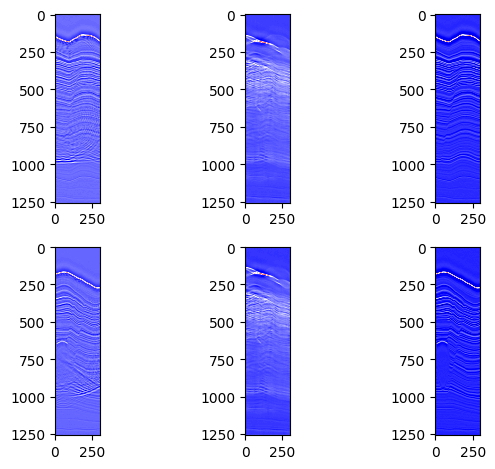

17/17 ━━━━━━━━━━━━━━━━━━━━ 117s 7s/step - ssim: 0.5325 - ssim_loss: 0.4740 - val_ssim: 0.5259 - val_ssim_loss: 0.5197 - learning_rate: 2.4414e-09
Epoch 63/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - ssim: 0.5418 - ssim_loss: 0.4610
Epoch 63: ReduceLROnPlateau reducing learning rate to 1.2207030941624453e-09.

End of epoch 62, Validation SSIM_Loss: 0.4879

End of epoch 62, Validation SSIM: 0.5462


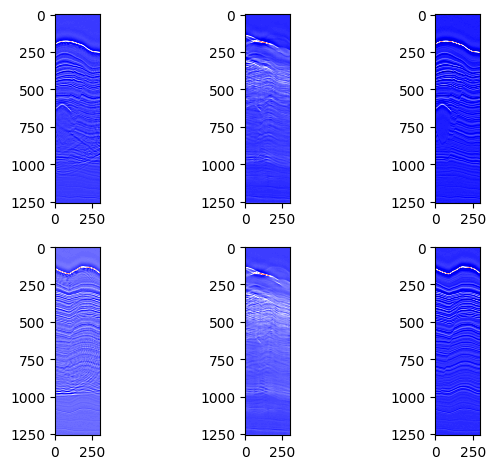

17/17 ━━━━━━━━━━━━━━━━━━━━ 118s 7s/step - ssim: 0.5416 - ssim_loss: 0.4599 - val_ssim: 0.5462 - val_ssim_loss: 0.4879 - learning_rate: 2.4414e-09
Epoch 64/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - ssim: 0.5789 - ssim_loss: 0.4576
End of epoch 63, Validation SSIM_Loss: 0.4449

End of epoch 63, Validation SSIM: 0.4948


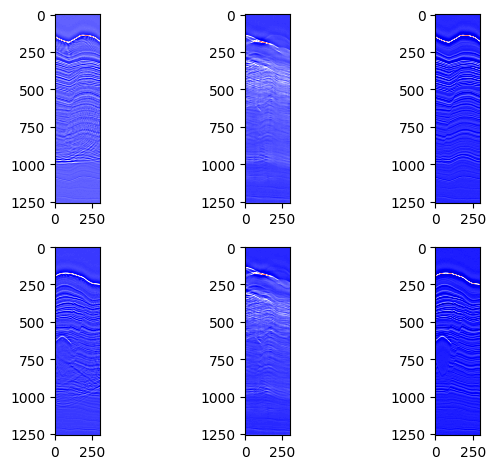

17/17 ━━━━━━━━━━━━━━━━━━━━ 118s 7s/step - ssim: 0.5768 - ssim_loss: 0.4610 - val_ssim: 0.4948 - val_ssim_loss: 0.4449 - learning_rate: 1.2207e-09
Epoch 65/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - ssim: 0.5233 - ssim_loss: 0.4638
End of epoch 64, Validation SSIM_Loss: 0.3132

End of epoch 64, Validation SSIM: 0.6165


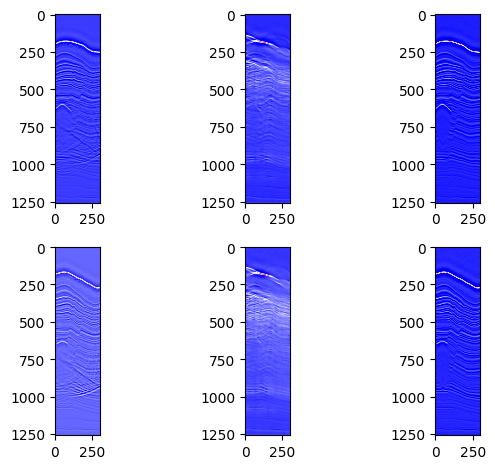

17/17 ━━━━━━━━━━━━━━━━━━━━ 118s 7s/step - ssim: 0.5240 - ssim_loss: 0.4566 - val_ssim: 0.6165 - val_ssim_loss: 0.3132 - learning_rate: 1.2207e-09
Epoch 66/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - ssim: 0.5041 - ssim_loss: 0.4746
End of epoch 65, Validation SSIM_Loss: 0.4004

End of epoch 65, Validation SSIM: 0.5834


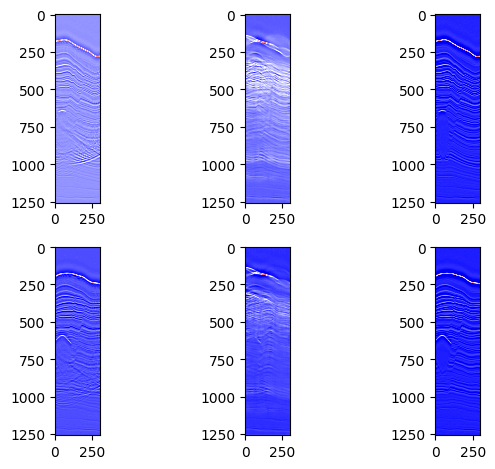

17/17 ━━━━━━━━━━━━━━━━━━━━ 119s 7s/step - ssim: 0.5053 - ssim_loss: 0.4683 - val_ssim: 0.5834 - val_ssim_loss: 0.4004 - learning_rate: 1.2207e-09
Epoch 67/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - ssim: 0.5134 - ssim_loss: 0.4559
Epoch 67: ReduceLROnPlateau reducing learning rate to 6.103515470812226e-10.

End of epoch 66, Validation SSIM_Loss: 0.5807

End of epoch 66, Validation SSIM: 0.5294


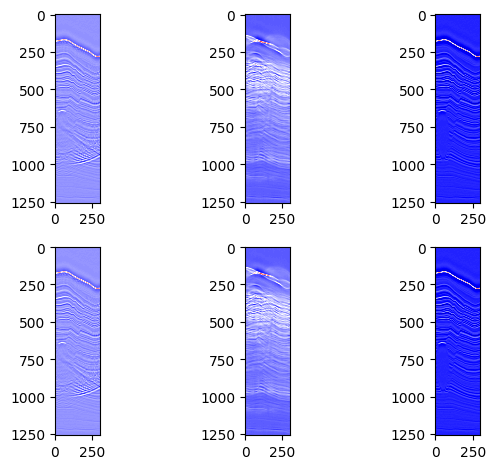

17/17 ━━━━━━━━━━━━━━━━━━━━ 119s 7s/step - ssim: 0.5151 - ssim_loss: 0.4577 - val_ssim: 0.5294 - val_ssim_loss: 0.5807 - learning_rate: 1.2207e-09
Epoch 68/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - ssim: 0.5482 - ssim_loss: 0.4536
End of epoch 67, Validation SSIM_Loss: 0.4582

End of epoch 67, Validation SSIM: 0.5587


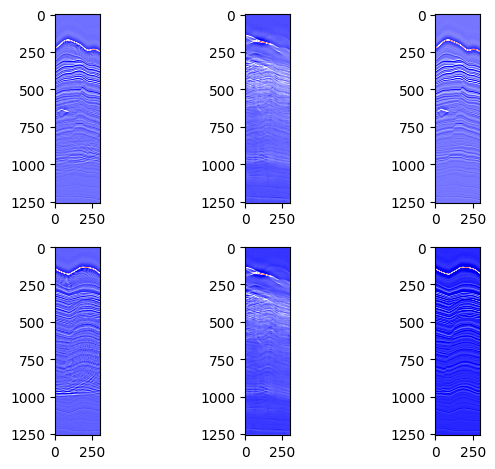

17/17 ━━━━━━━━━━━━━━━━━━━━ 119s 7s/step - ssim: 0.5481 - ssim_loss: 0.4498 - val_ssim: 0.5587 - val_ssim_loss: 0.4582 - learning_rate: 6.1035e-10
Epoch 69/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - ssim: 0.4667 - ssim_loss: 0.5103
End of epoch 68, Validation SSIM_Loss: 0.4919

End of epoch 68, Validation SSIM: 0.4631


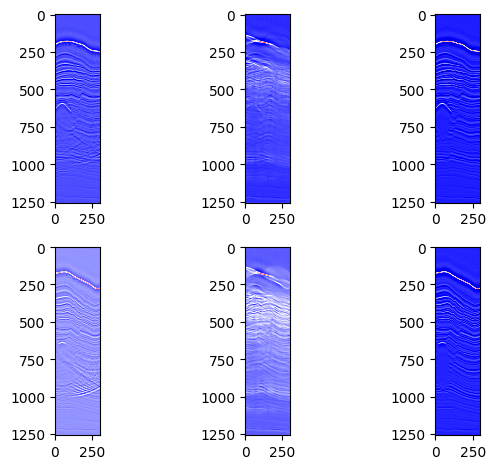

17/17 ━━━━━━━━━━━━━━━━━━━━ 120s 7s/step - ssim: 0.4680 - ssim_loss: 0.5027 - val_ssim: 0.4631 - val_ssim_loss: 0.4919 - learning_rate: 6.1035e-10
Epoch 70/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - ssim: 0.5571 - ssim_loss: 0.4448
End of epoch 69, Validation SSIM_Loss: 0.5677

End of epoch 69, Validation SSIM: 0.5117


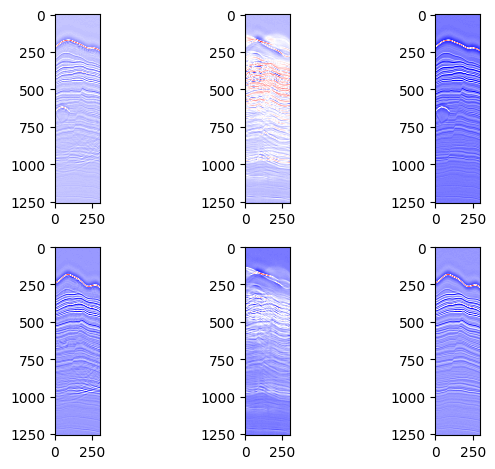

17/17 ━━━━━━━━━━━━━━━━━━━━ 120s 7s/step - ssim: 0.5570 - ssim_loss: 0.4437 - val_ssim: 0.5117 - val_ssim_loss: 0.5677 - learning_rate: 6.1035e-10
Epoch 71/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - ssim: 0.5758 - ssim_loss: 0.4400
Epoch 71: ReduceLROnPlateau reducing learning rate to 3.051757735406113e-10.

End of epoch 70, Validation SSIM_Loss: 0.5362

End of epoch 70, Validation SSIM: 0.5392


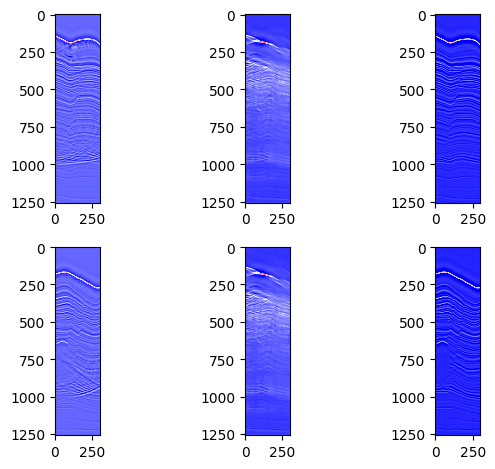

17/17 ━━━━━━━━━━━━━━━━━━━━ 120s 7s/step - ssim: 0.5749 - ssim_loss: 0.4517 - val_ssim: 0.5392 - val_ssim_loss: 0.5362 - learning_rate: 6.1035e-10
Epoch 72/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - ssim: 0.4966 - ssim_loss: 0.4783
End of epoch 71, Validation SSIM_Loss: 0.4305

End of epoch 71, Validation SSIM: 0.5525


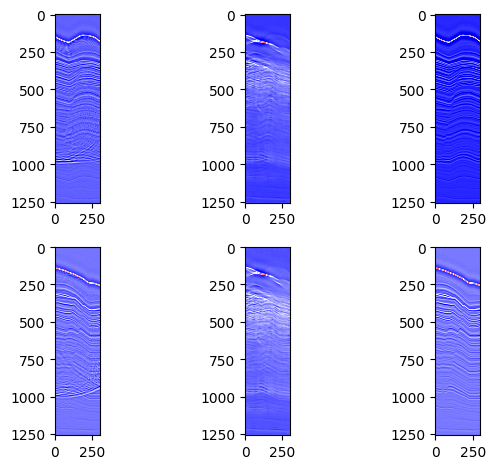

17/17 ━━━━━━━━━━━━━━━━━━━━ 121s 7s/step - ssim: 0.4980 - ssim_loss: 0.4762 - val_ssim: 0.5525 - val_ssim_loss: 0.4305 - learning_rate: 3.0518e-10
Epoch 73/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - ssim: 0.5509 - ssim_loss: 0.4675
End of epoch 72, Validation SSIM_Loss: 0.4405

End of epoch 72, Validation SSIM: 0.5027


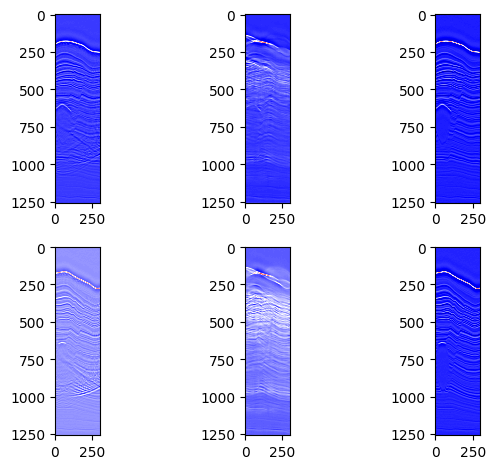

17/17 ━━━━━━━━━━━━━━━━━━━━ 121s 7s/step - ssim: 0.5499 - ssim_loss: 0.4613 - val_ssim: 0.5027 - val_ssim_loss: 0.4405 - learning_rate: 3.0518e-10
Epoch 74/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - ssim: 0.5553 - ssim_loss: 0.4683
End of epoch 73, Validation SSIM_Loss: 0.4537

End of epoch 73, Validation SSIM: 0.5138


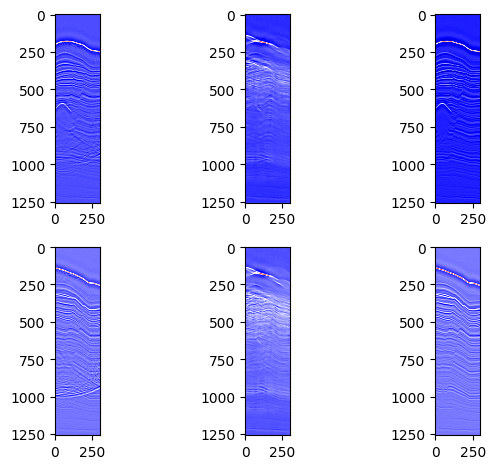

17/17 ━━━━━━━━━━━━━━━━━━━━ 121s 7s/step - ssim: 0.5540 - ssim_loss: 0.4729 - val_ssim: 0.5138 - val_ssim_loss: 0.4537 - learning_rate: 3.0518e-10
Epoch 75/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - ssim: 0.5469 - ssim_loss: 0.4711
Epoch 75: ReduceLROnPlateau reducing learning rate to 1.5258788677030566e-10.

End of epoch 74, Validation SSIM_Loss: 0.3823

End of epoch 74, Validation SSIM: 0.6187


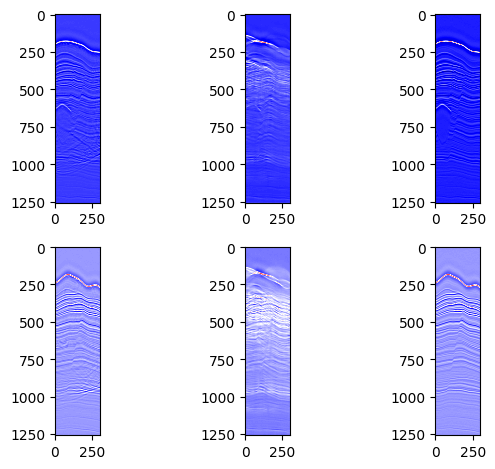

17/17 ━━━━━━━━━━━━━━━━━━━━ 121s 7s/step - ssim: 0.5459 - ssim_loss: 0.4693 - val_ssim: 0.6187 - val_ssim_loss: 0.3823 - learning_rate: 3.0518e-10
Epoch 76/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - ssim: 0.4609 - ssim_loss: 0.4932
End of epoch 75, Validation SSIM_Loss: 0.4892

End of epoch 75, Validation SSIM: 0.5268


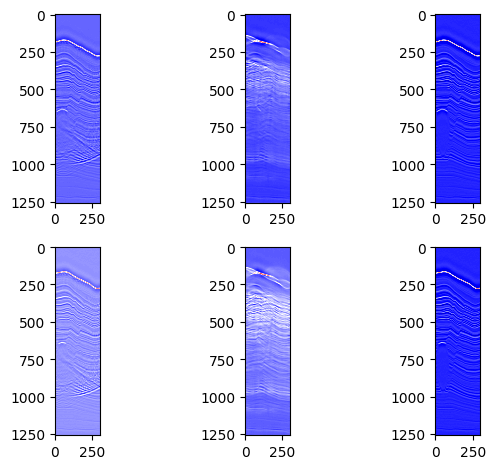

17/17 ━━━━━━━━━━━━━━━━━━━━ 121s 7s/step - ssim: 0.4634 - ssim_loss: 0.4805 - val_ssim: 0.5268 - val_ssim_loss: 0.4892 - learning_rate: 1.5259e-10
Epoch 77/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - ssim: 0.5109 - ssim_loss: 0.4704
End of epoch 76, Validation SSIM_Loss: 0.5773

End of epoch 76, Validation SSIM: 0.4357


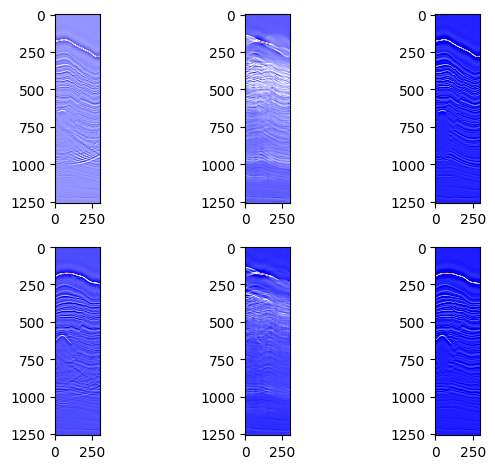

17/17 ━━━━━━━━━━━━━━━━━━━━ 122s 7s/step - ssim: 0.5120 - ssim_loss: 0.4685 - val_ssim: 0.4357 - val_ssim_loss: 0.5773 - learning_rate: 1.5259e-10
Epoch 78/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - ssim: 0.5493 - ssim_loss: 0.4555
End of epoch 77, Validation SSIM_Loss: 0.4248

End of epoch 77, Validation SSIM: 0.5732


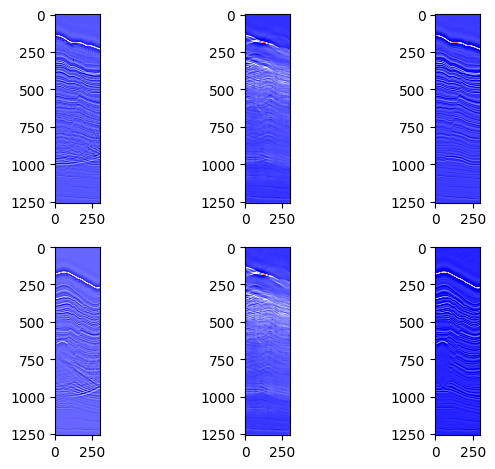

17/17 ━━━━━━━━━━━━━━━━━━━━ 122s 7s/step - ssim: 0.5490 - ssim_loss: 0.4635 - val_ssim: 0.5732 - val_ssim_loss: 0.4248 - learning_rate: 1.5259e-10
Epoch 79/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - ssim: 0.5382 - ssim_loss: 0.4628
Epoch 79: ReduceLROnPlateau reducing learning rate to 7.629394338515283e-11.

End of epoch 78, Validation SSIM_Loss: 0.3728

End of epoch 78, Validation SSIM: 0.5748


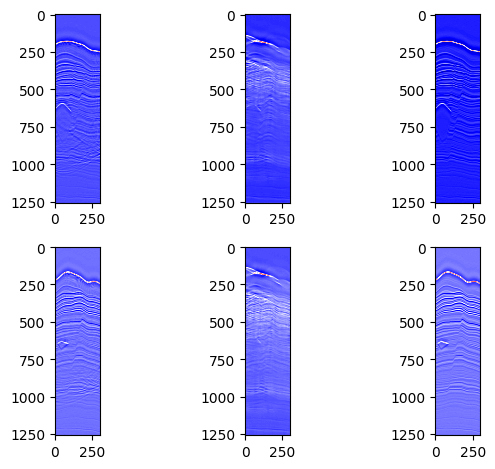

17/17 ━━━━━━━━━━━━━━━━━━━━ 122s 7s/step - ssim: 0.5382 - ssim_loss: 0.4624 - val_ssim: 0.5748 - val_ssim_loss: 0.3728 - learning_rate: 1.5259e-10
Epoch 80/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - ssim: 0.5687 - ssim_loss: 0.4442
End of epoch 79, Validation SSIM_Loss: 0.3053

End of epoch 79, Validation SSIM: 0.5599


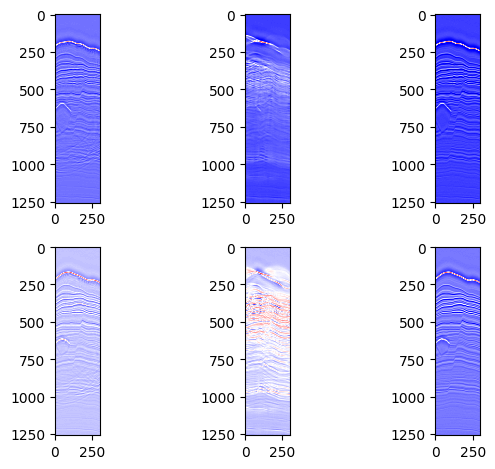

17/17 ━━━━━━━━━━━━━━━━━━━━ 165s 10s/step - ssim: 0.5680 - ssim_loss: 0.4429 - val_ssim: 0.5599 - val_ssim_loss: 0.3053 - learning_rate: 7.6294e-11
Epoch 81/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - ssim: 0.4947 - ssim_loss: 0.4618
End of epoch 80, Validation SSIM_Loss: 0.5306

End of epoch 80, Validation SSIM: 0.5150


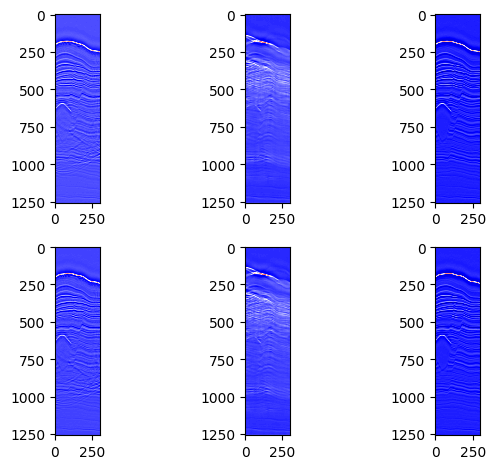

17/17 ━━━━━━━━━━━━━━━━━━━━ 125s 7s/step - ssim: 0.4971 - ssim_loss: 0.4527 - val_ssim: 0.5150 - val_ssim_loss: 0.5306 - learning_rate: 7.6294e-11
Epoch 82/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - ssim: 0.5253 - ssim_loss: 0.5000
End of epoch 81, Validation SSIM_Loss: 0.5385

End of epoch 81, Validation SSIM: 0.5351


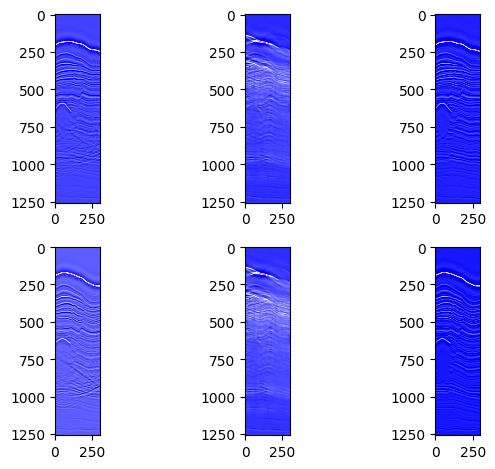

17/17 ━━━━━━━━━━━━━━━━━━━━ 127s 7s/step - ssim: 0.5239 - ssim_loss: 0.5009 - val_ssim: 0.5351 - val_ssim_loss: 0.5385 - learning_rate: 7.6294e-11
Epoch 83/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - ssim: 0.5296 - ssim_loss: 0.4738
End of epoch 82, Validation SSIM_Loss: 0.5978

End of epoch 82, Validation SSIM: 0.5090


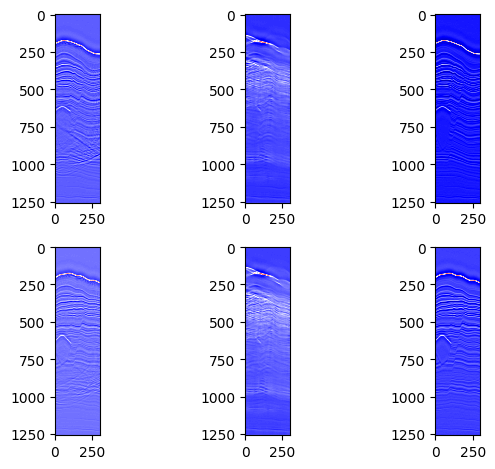

17/17 ━━━━━━━━━━━━━━━━━━━━ 128s 8s/step - ssim: 0.5294 - ssim_loss: 0.4709 - val_ssim: 0.5090 - val_ssim_loss: 0.5978 - learning_rate: 7.6294e-11
Epoch 84/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - ssim: 0.4956 - ssim_loss: 0.4778
Epoch 84: ReduceLROnPlateau reducing learning rate to 3.8146971692576415e-11.

End of epoch 83, Validation SSIM_Loss: 0.4221

End of epoch 83, Validation SSIM: 0.5876


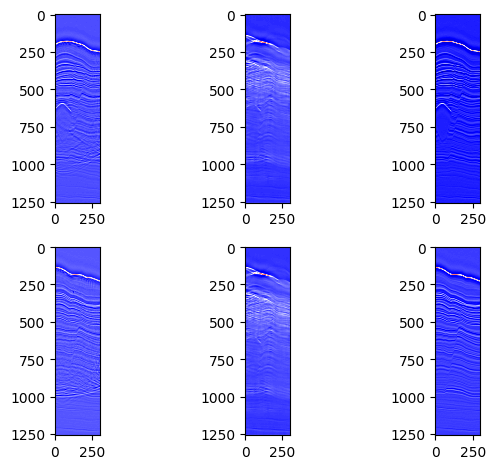

17/17 ━━━━━━━━━━━━━━━━━━━━ 128s 8s/step - ssim: 0.4971 - ssim_loss: 0.4847 - val_ssim: 0.5876 - val_ssim_loss: 0.4221 - learning_rate: 7.6294e-11
Epoch 85/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - ssim: 0.5213 - ssim_loss: 0.4760
End of epoch 84, Validation SSIM_Loss: 0.3701

End of epoch 84, Validation SSIM: 0.6089


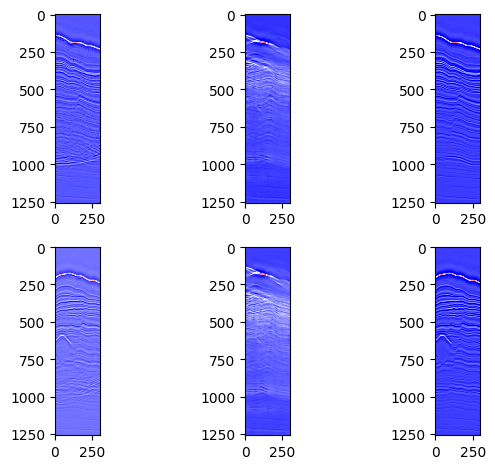

17/17 ━━━━━━━━━━━━━━━━━━━━ 130s 8s/step - ssim: 0.5214 - ssim_loss: 0.4686 - val_ssim: 0.6089 - val_ssim_loss: 0.3701 - learning_rate: 3.8147e-11
Epoch 86/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - ssim: 0.4964 - ssim_loss: 0.4625
End of epoch 85, Validation SSIM_Loss: 0.4500

End of epoch 85, Validation SSIM: 0.5647


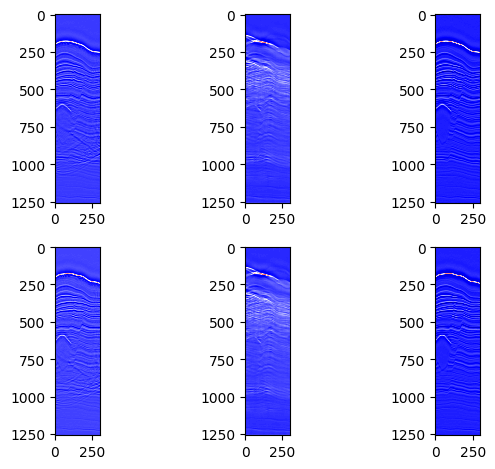

17/17 ━━━━━━━━━━━━━━━━━━━━ 129s 8s/step - ssim: 0.4987 - ssim_loss: 0.4646 - val_ssim: 0.5647 - val_ssim_loss: 0.4500 - learning_rate: 3.8147e-11
Epoch 87/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 8s/step - ssim: 0.5670 - ssim_loss: 0.4371
End of epoch 86, Validation SSIM_Loss: 0.4300

End of epoch 86, Validation SSIM: 0.5112


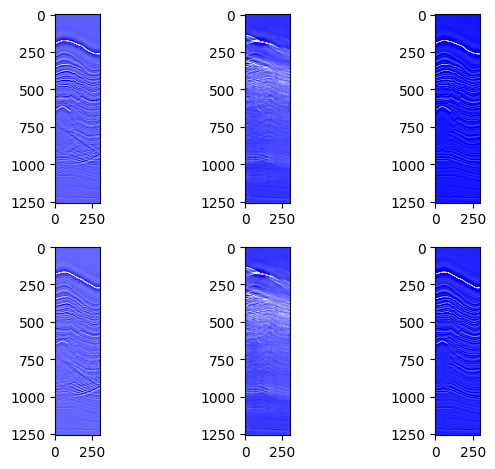

17/17 ━━━━━━━━━━━━━━━━━━━━ 130s 8s/step - ssim: 0.5668 - ssim_loss: 0.4331 - val_ssim: 0.5112 - val_ssim_loss: 0.4300 - learning_rate: 3.8147e-11
Epoch 88/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 8s/step - ssim: 0.4844 - ssim_loss: 0.4639
Epoch 88: ReduceLROnPlateau reducing learning rate to 1.9073485846288207e-11.

End of epoch 87, Validation SSIM_Loss: 0.5026

End of epoch 87, Validation SSIM: 0.5013


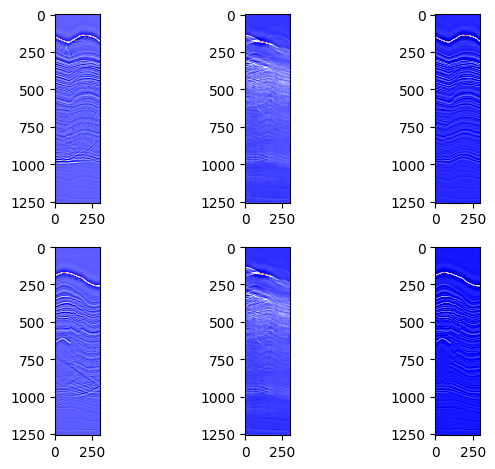

17/17 ━━━━━━━━━━━━━━━━━━━━ 130s 8s/step - ssim: 0.4873 - ssim_loss: 0.4597 - val_ssim: 0.5013 - val_ssim_loss: 0.5026 - learning_rate: 3.8147e-11
Epoch 89/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 8s/step - ssim: 0.5400 - ssim_loss: 0.4682
End of epoch 88, Validation SSIM_Loss: 0.4875

End of epoch 88, Validation SSIM: 0.5561


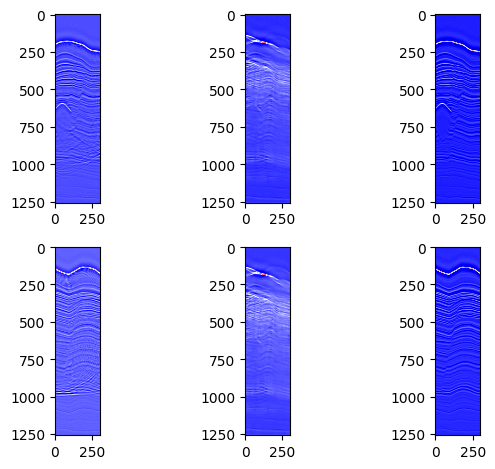

17/17 ━━━━━━━━━━━━━━━━━━━━ 132s 8s/step - ssim: 0.5396 - ssim_loss: 0.4690 - val_ssim: 0.5561 - val_ssim_loss: 0.4875 - learning_rate: 1.9073e-11
Epoch 90/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 8s/step - ssim: 0.5582 - ssim_loss: 0.4347
End of epoch 89, Validation SSIM_Loss: 0.4656

End of epoch 89, Validation SSIM: 0.5477


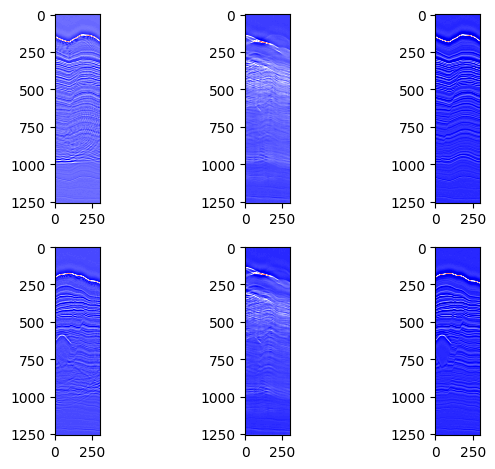

17/17 ━━━━━━━━━━━━━━━━━━━━ 132s 8s/step - ssim: 0.5586 - ssim_loss: 0.4324 - val_ssim: 0.5477 - val_ssim_loss: 0.4656 - learning_rate: 1.9073e-11
Epoch 91/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 8s/step - ssim: 0.5235 - ssim_loss: 0.4704
End of epoch 90, Validation SSIM_Loss: 0.4955

End of epoch 90, Validation SSIM: 0.5896


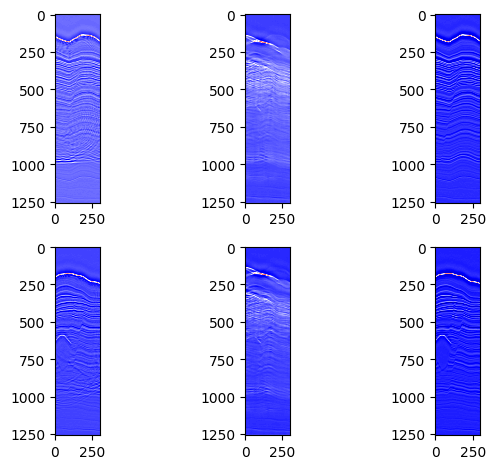

17/17 ━━━━━━━━━━━━━━━━━━━━ 132s 8s/step - ssim: 0.5238 - ssim_loss: 0.4699 - val_ssim: 0.5896 - val_ssim_loss: 0.4955 - learning_rate: 1.9073e-11
Epoch 92/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 8s/step - ssim: 0.5484 - ssim_loss: 0.4461
Epoch 92: ReduceLROnPlateau reducing learning rate to 9.536742923144104e-12.

End of epoch 91, Validation SSIM_Loss: 0.3628

End of epoch 91, Validation SSIM: 0.6081


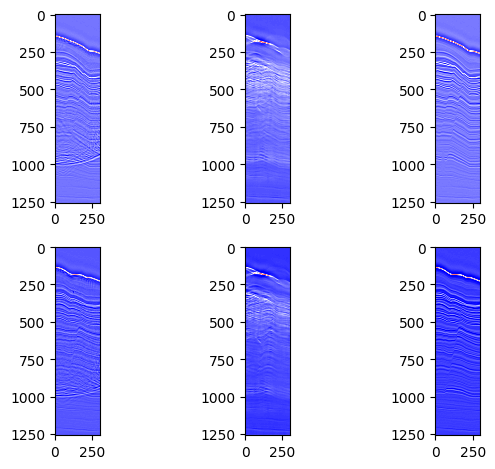

17/17 ━━━━━━━━━━━━━━━━━━━━ 132s 8s/step - ssim: 0.5487 - ssim_loss: 0.4412 - val_ssim: 0.6081 - val_ssim_loss: 0.3628 - learning_rate: 1.9073e-11
Epoch 93/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 8s/step - ssim: 0.5274 - ssim_loss: 0.4608
End of epoch 92, Validation SSIM_Loss: 0.6107

End of epoch 92, Validation SSIM: 0.4922


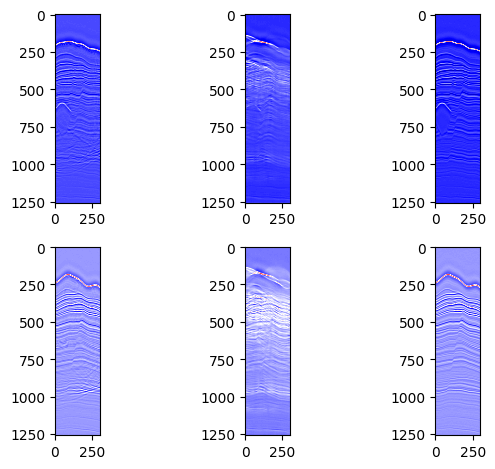

17/17 ━━━━━━━━━━━━━━━━━━━━ 132s 8s/step - ssim: 0.5281 - ssim_loss: 0.4701 - val_ssim: 0.4922 - val_ssim_loss: 0.6107 - learning_rate: 9.5367e-12
Epoch 94/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 8s/step - ssim: 0.5032 - ssim_loss: 0.4780
End of epoch 93, Validation SSIM_Loss: 0.5505

End of epoch 93, Validation SSIM: 0.5145


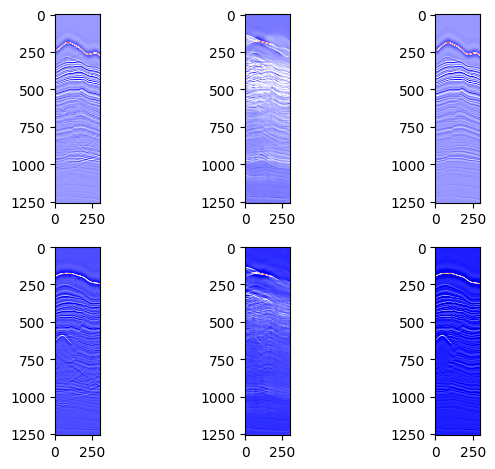

17/17 ━━━━━━━━━━━━━━━━━━━━ 132s 8s/step - ssim: 0.5043 - ssim_loss: 0.4780 - val_ssim: 0.5145 - val_ssim_loss: 0.5505 - learning_rate: 9.5367e-12
Epoch 95/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 8s/step - ssim: 0.5218 - ssim_loss: 0.4786
End of epoch 94, Validation SSIM_Loss: 0.3614

End of epoch 94, Validation SSIM: 0.6239


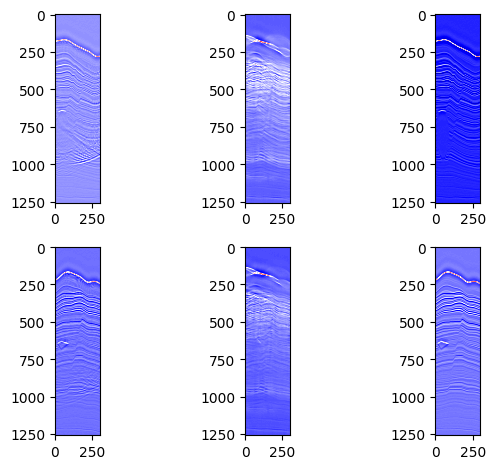

17/17 ━━━━━━━━━━━━━━━━━━━━ 132s 8s/step - ssim: 0.5218 - ssim_loss: 0.4792 - val_ssim: 0.6239 - val_ssim_loss: 0.3614 - learning_rate: 9.5367e-12
Epoch 96/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 8s/step - ssim: 0.5024 - ssim_loss: 0.4771
Epoch 96: ReduceLROnPlateau reducing learning rate to 4.768371461572052e-12.

End of epoch 95, Validation SSIM_Loss: 0.3276

End of epoch 95, Validation SSIM: 0.6271


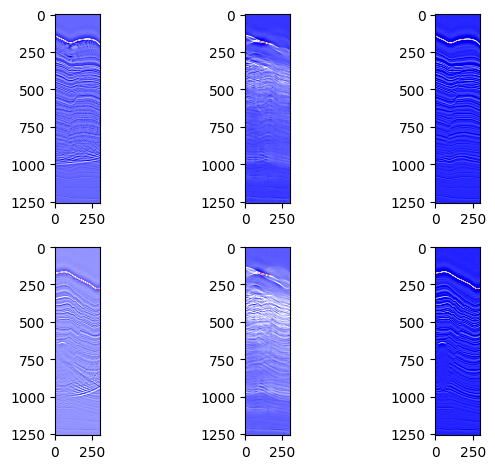

17/17 ━━━━━━━━━━━━━━━━━━━━ 132s 8s/step - ssim: 0.5036 - ssim_loss: 0.4798 - val_ssim: 0.6271 - val_ssim_loss: 0.3276 - learning_rate: 9.5367e-12
Epoch 97/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 8s/step - ssim: 0.5739 - ssim_loss: 0.4493
End of epoch 96, Validation SSIM_Loss: 0.6399

End of epoch 96, Validation SSIM: 0.4630


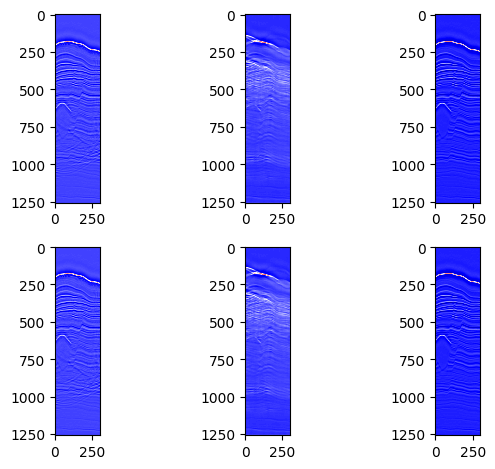

17/17 ━━━━━━━━━━━━━━━━━━━━ 132s 8s/step - ssim: 0.5726 - ssim_loss: 0.4555 - val_ssim: 0.4630 - val_ssim_loss: 0.6399 - learning_rate: 4.7684e-12
Epoch 98/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 8s/step - ssim: 0.5308 - ssim_loss: 0.4774
End of epoch 97, Validation SSIM_Loss: 0.5998

End of epoch 97, Validation SSIM: 0.4412


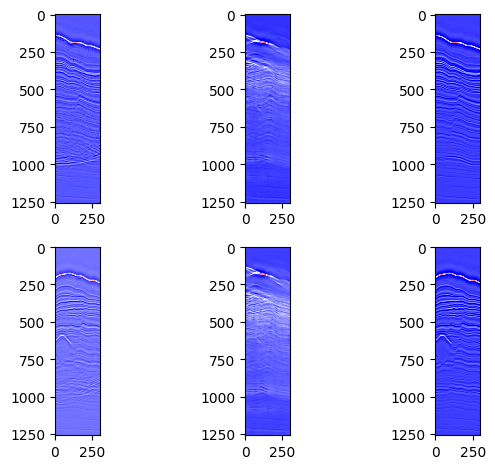

17/17 ━━━━━━━━━━━━━━━━━━━━ 133s 8s/step - ssim: 0.5304 - ssim_loss: 0.4763 - val_ssim: 0.4412 - val_ssim_loss: 0.5998 - learning_rate: 4.7684e-12
Epoch 99/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 8s/step - ssim: 0.5453 - ssim_loss: 0.4495
End of epoch 98, Validation SSIM_Loss: 0.3104

End of epoch 98, Validation SSIM: 0.5990


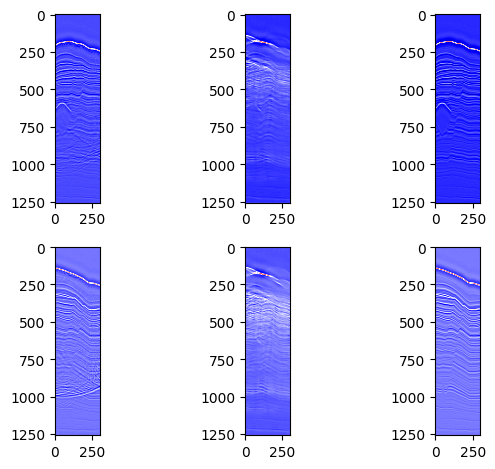

17/17 ━━━━━━━━━━━━━━━━━━━━ 132s 8s/step - ssim: 0.5456 - ssim_loss: 0.4590 - val_ssim: 0.5990 - val_ssim_loss: 0.3104 - learning_rate: 4.7684e-12
Epoch 100/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 8s/step - ssim: 0.5376 - ssim_loss: 0.4636
Epoch 100: ReduceLROnPlateau reducing learning rate to 2.384185730786026e-12.

End of epoch 99, Validation SSIM_Loss: 0.5245

End of epoch 99, Validation SSIM: 0.5714


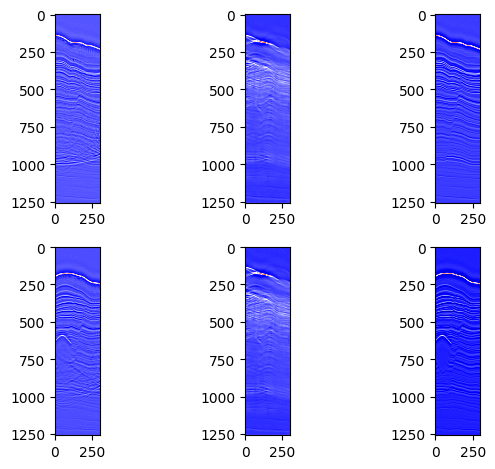

17/17 ━━━━━━━━━━━━━━━━━━━━ 131s 8s/step - ssim: 0.5375 - ssim_loss: 0.4560 - val_ssim: 0.5714 - val_ssim_loss: 0.5245 - learning_rate: 4.7684e-12
Epoch 101/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 8s/step - ssim: 0.5267 - ssim_loss: 0.4863
End of epoch 100, Validation SSIM_Loss: 0.5612

End of epoch 100, Validation SSIM: 0.5147


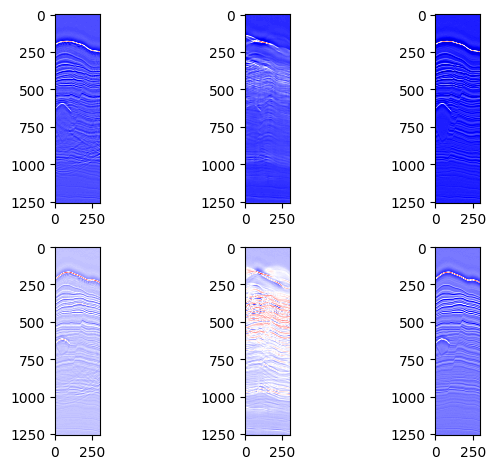

17/17 ━━━━━━━━━━━━━━━━━━━━ 130s 8s/step - ssim: 0.5259 - ssim_loss: 0.4817 - val_ssim: 0.5147 - val_ssim_loss: 0.5612 - learning_rate: 2.3842e-12
Epoch 102/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - ssim: 0.4864 - ssim_loss: 0.4790
End of epoch 101, Validation SSIM_Loss: 0.5160

End of epoch 101, Validation SSIM: 0.5911


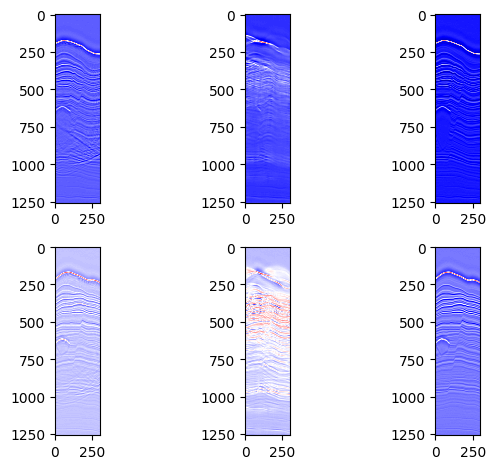

17/17 ━━━━━━━━━━━━━━━━━━━━ 129s 8s/step - ssim: 0.4883 - ssim_loss: 0.4762 - val_ssim: 0.5911 - val_ssim_loss: 0.5160 - learning_rate: 2.3842e-12
Epoch 103/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - ssim: 0.6079 - ssim_loss: 0.4306
End of epoch 102, Validation SSIM_Loss: 0.4476

End of epoch 102, Validation SSIM: 0.5881


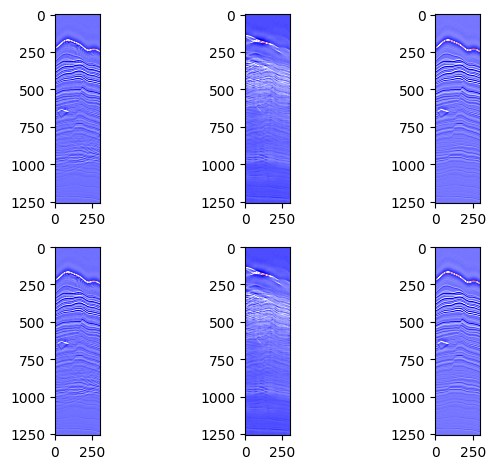

17/17 ━━━━━━━━━━━━━━━━━━━━ 129s 8s/step - ssim: 0.6057 - ssim_loss: 0.4329 - val_ssim: 0.5881 - val_ssim_loss: 0.4476 - learning_rate: 2.3842e-12
Epoch 104/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - ssim: 0.5243 - ssim_loss: 0.4735
Epoch 104: ReduceLROnPlateau reducing learning rate to 1.192092865393013e-12.

End of epoch 103, Validation SSIM_Loss: 0.3920

End of epoch 103, Validation SSIM: 0.5862


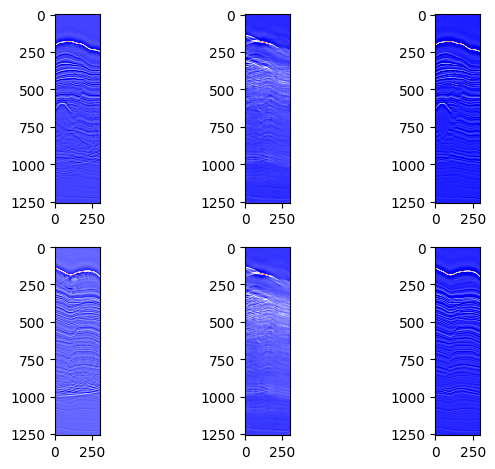

17/17 ━━━━━━━━━━━━━━━━━━━━ 128s 8s/step - ssim: 0.5244 - ssim_loss: 0.4631 - val_ssim: 0.5862 - val_ssim_loss: 0.3920 - learning_rate: 2.3842e-12
Epoch 105/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - ssim: 0.4709 - ssim_loss: 0.4772
End of epoch 104, Validation SSIM_Loss: 0.4013

End of epoch 104, Validation SSIM: 0.5998


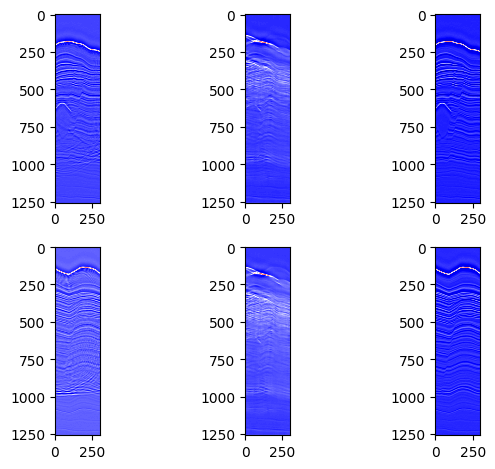

17/17 ━━━━━━━━━━━━━━━━━━━━ 128s 8s/step - ssim: 0.4738 - ssim_loss: 0.4669 - val_ssim: 0.5998 - val_ssim_loss: 0.4013 - learning_rate: 1.1921e-12
Epoch 106/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - ssim: 0.4830 - ssim_loss: 0.4950
End of epoch 105, Validation SSIM_Loss: 0.3665

End of epoch 105, Validation SSIM: 0.5532


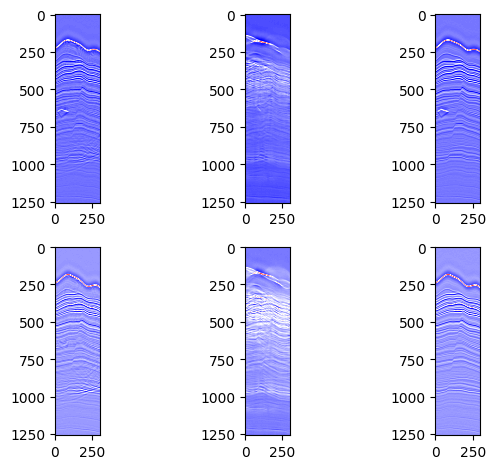

17/17 ━━━━━━━━━━━━━━━━━━━━ 127s 7s/step - ssim: 0.4842 - ssim_loss: 0.4899 - val_ssim: 0.5532 - val_ssim_loss: 0.3665 - learning_rate: 1.1921e-12
Epoch 107/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - ssim: 0.5094 - ssim_loss: 0.4677
End of epoch 106, Validation SSIM_Loss: 0.5027

End of epoch 106, Validation SSIM: 0.4998


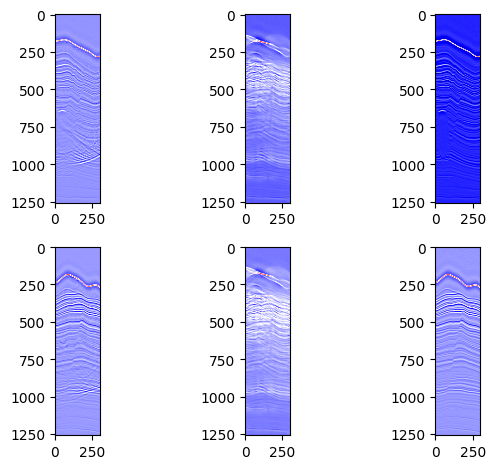

17/17 ━━━━━━━━━━━━━━━━━━━━ 125s 7s/step - ssim: 0.5107 - ssim_loss: 0.4614 - val_ssim: 0.4998 - val_ssim_loss: 0.5027 - learning_rate: 1.1921e-12
Epoch 108/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - ssim: 0.5335 - ssim_loss: 0.4709
Epoch 108: ReduceLROnPlateau reducing learning rate to 5.960464326965065e-13.

End of epoch 107, Validation SSIM_Loss: 0.4894

End of epoch 107, Validation SSIM: 0.5563


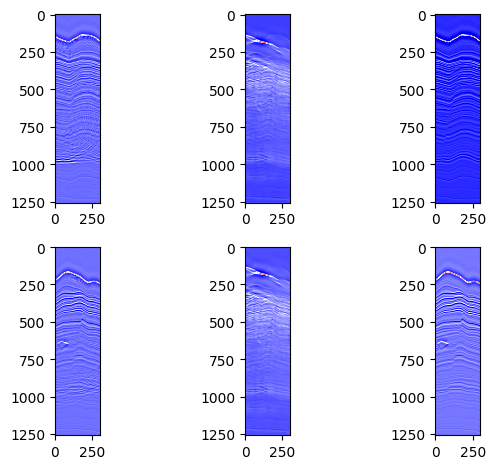

17/17 ━━━━━━━━━━━━━━━━━━━━ 124s 7s/step - ssim: 0.5333 - ssim_loss: 0.4679 - val_ssim: 0.5563 - val_ssim_loss: 0.4894 - learning_rate: 1.1921e-12
Epoch 109/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - ssim: 0.5692 - ssim_loss: 0.4620
End of epoch 108, Validation SSIM_Loss: 0.4446

End of epoch 108, Validation SSIM: 0.5727


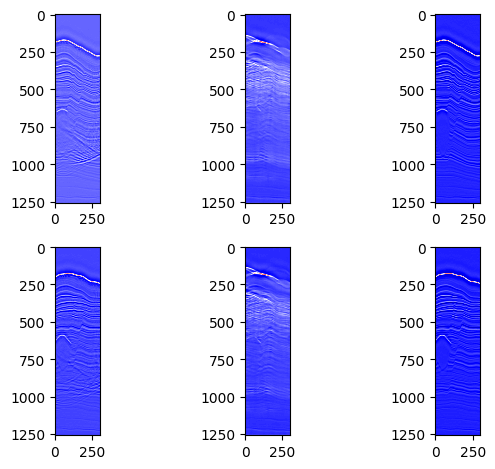

17/17 ━━━━━━━━━━━━━━━━━━━━ 123s 7s/step - ssim: 0.5675 - ssim_loss: 0.4548 - val_ssim: 0.5727 - val_ssim_loss: 0.4446 - learning_rate: 5.9605e-13
Epoch 110/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - ssim: 0.5674 - ssim_loss: 0.4431
End of epoch 109, Validation SSIM_Loss: 0.3159

End of epoch 109, Validation SSIM: 0.6141


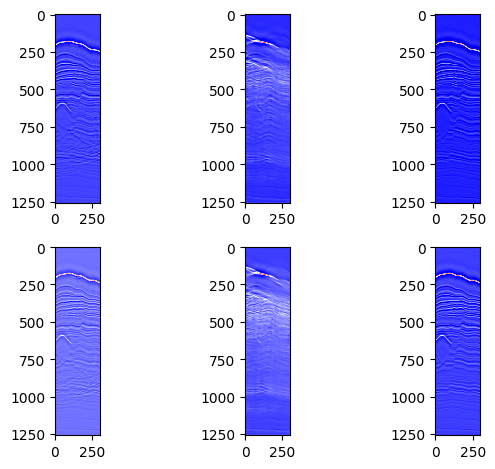

17/17 ━━━━━━━━━━━━━━━━━━━━ 122s 7s/step - ssim: 0.5668 - ssim_loss: 0.4430 - val_ssim: 0.6141 - val_ssim_loss: 0.3159 - learning_rate: 5.9605e-13
Epoch 111/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - ssim: 0.5518 - ssim_loss: 0.4557
End of epoch 110, Validation SSIM_Loss: 0.5481

End of epoch 110, Validation SSIM: 0.5546


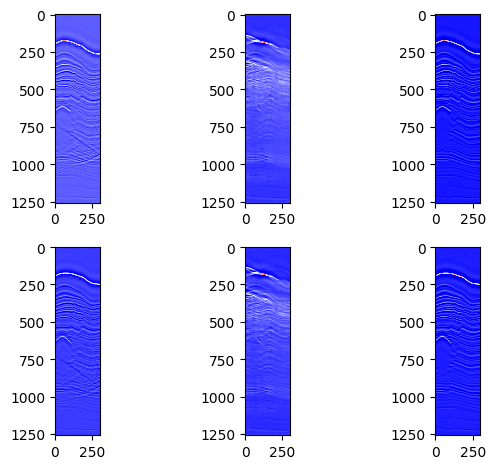

17/17 ━━━━━━━━━━━━━━━━━━━━ 120s 7s/step - ssim: 0.5513 - ssim_loss: 0.4666 - val_ssim: 0.5546 - val_ssim_loss: 0.5481 - learning_rate: 5.9605e-13
Epoch 112/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - ssim: 0.5484 - ssim_loss: 0.4538
Epoch 112: ReduceLROnPlateau reducing learning rate to 2.9802321634825324e-13.

End of epoch 111, Validation SSIM_Loss: 0.3857

End of epoch 111, Validation SSIM: 0.5745


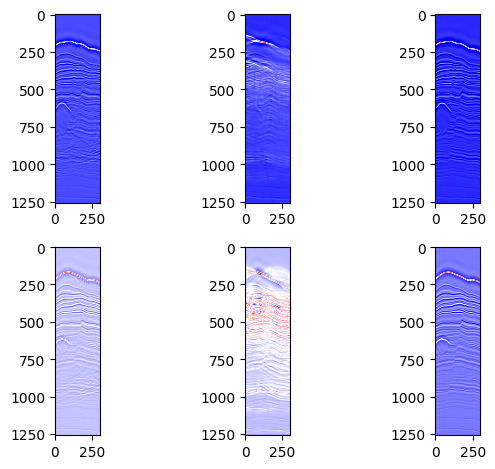

17/17 ━━━━━━━━━━━━━━━━━━━━ 118s 7s/step - ssim: 0.5483 - ssim_loss: 0.4548 - val_ssim: 0.5745 - val_ssim_loss: 0.3857 - learning_rate: 5.9605e-13
Epoch 113/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - ssim: 0.5270 - ssim_loss: 0.4609
End of epoch 112, Validation SSIM_Loss: 0.5468

End of epoch 112, Validation SSIM: 0.5276


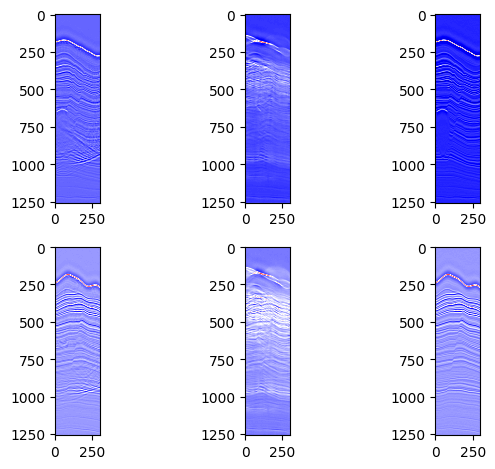

17/17 ━━━━━━━━━━━━━━━━━━━━ 115s 7s/step - ssim: 0.5277 - ssim_loss: 0.4581 - val_ssim: 0.5276 - val_ssim_loss: 0.5468 - learning_rate: 2.9802e-13
Epoch 114/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - ssim: 0.5425 - ssim_loss: 0.4483
End of epoch 113, Validation SSIM_Loss: 0.4140

End of epoch 113, Validation SSIM: 0.5697


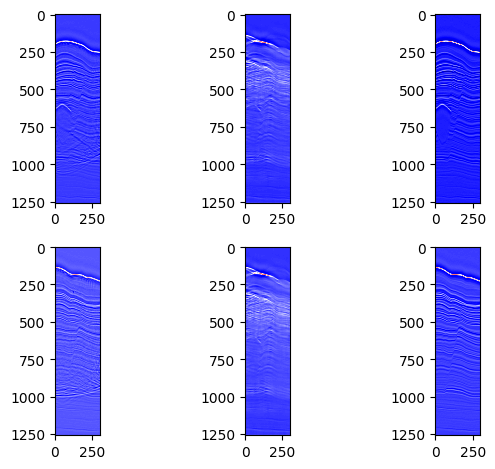

17/17 ━━━━━━━━━━━━━━━━━━━━ 112s 7s/step - ssim: 0.5430 - ssim_loss: 0.4424 - val_ssim: 0.5697 - val_ssim_loss: 0.4140 - learning_rate: 2.9802e-13
Epoch 115/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - ssim: 0.4698 - ssim_loss: 0.4849
End of epoch 114, Validation SSIM_Loss: 0.3817

End of epoch 114, Validation SSIM: 0.5729


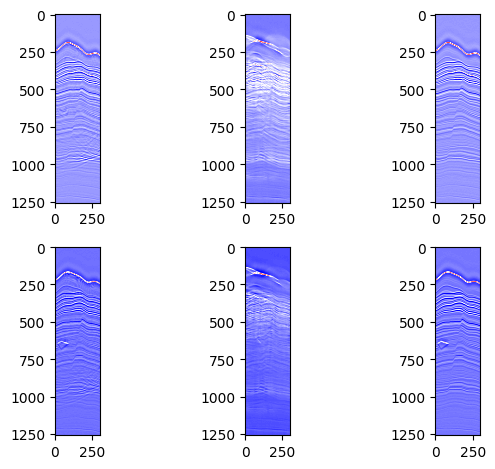

17/17 ━━━━━━━━━━━━━━━━━━━━ 109s 6s/step - ssim: 0.4723 - ssim_loss: 0.4817 - val_ssim: 0.5729 - val_ssim_loss: 0.3817 - learning_rate: 2.9802e-13
Epoch 116/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - ssim: 0.5332 - ssim_loss: 0.4565
Epoch 116: ReduceLROnPlateau reducing learning rate to 1.4901160817412662e-13.

End of epoch 115, Validation SSIM_Loss: 0.5745

End of epoch 115, Validation SSIM: 0.5283


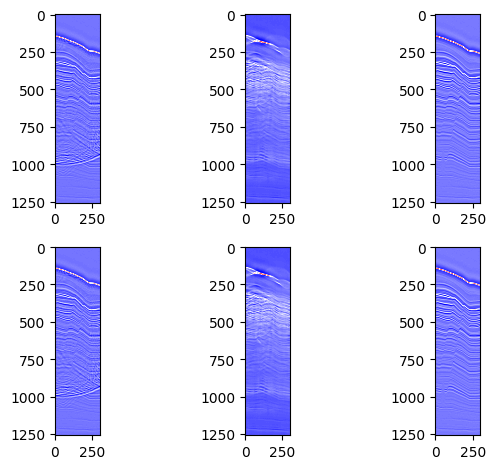

17/17 ━━━━━━━━━━━━━━━━━━━━ 106s 6s/step - ssim: 0.5337 - ssim_loss: 0.4619 - val_ssim: 0.5283 - val_ssim_loss: 0.5745 - learning_rate: 2.9802e-13
Epoch 117/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - ssim: 0.5462 - ssim_loss: 0.4696
End of epoch 116, Validation SSIM_Loss: 0.5006

End of epoch 116, Validation SSIM: 0.4834


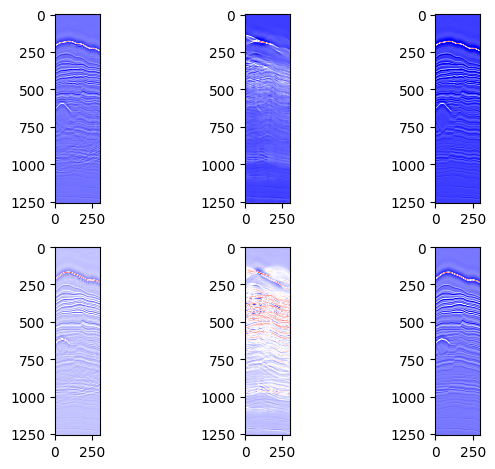

17/17 ━━━━━━━━━━━━━━━━━━━━ 105s 6s/step - ssim: 0.5453 - ssim_loss: 0.4742 - val_ssim: 0.4834 - val_ssim_loss: 0.5006 - learning_rate: 1.4901e-13
Epoch 118/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - ssim: 0.5550 - ssim_loss: 0.4492
End of epoch 117, Validation SSIM_Loss: 0.5302

End of epoch 117, Validation SSIM: 0.5504


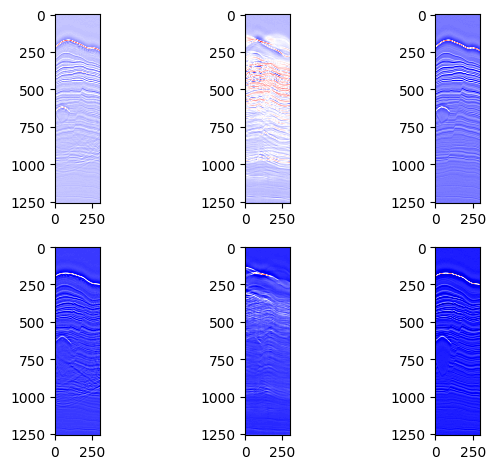

17/17 ━━━━━━━━━━━━━━━━━━━━ 106s 6s/step - ssim: 0.5548 - ssim_loss: 0.4484 - val_ssim: 0.5504 - val_ssim_loss: 0.5302 - learning_rate: 1.4901e-13
Epoch 119/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - ssim: 0.5370 - ssim_loss: 0.4582
End of epoch 118, Validation SSIM_Loss: 0.3976

End of epoch 118, Validation SSIM: 0.6032


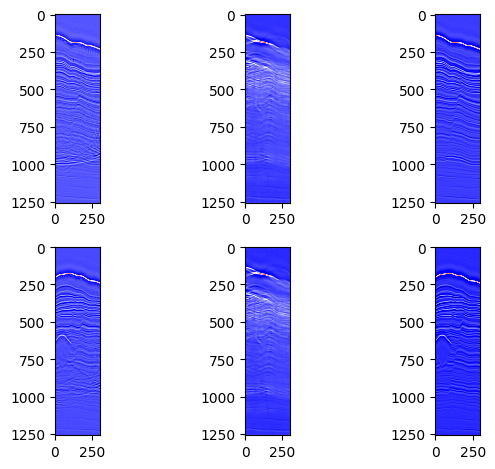

17/17 ━━━━━━━━━━━━━━━━━━━━ 105s 6s/step - ssim: 0.5373 - ssim_loss: 0.4584 - val_ssim: 0.6032 - val_ssim_loss: 0.3976 - learning_rate: 1.4901e-13
Epoch 120/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - ssim: 0.5363 - ssim_loss: 0.4640
Epoch 120: ReduceLROnPlateau reducing learning rate to 7.450580408706331e-14.

End of epoch 119, Validation SSIM_Loss: 0.5115

End of epoch 119, Validation SSIM: 0.5153


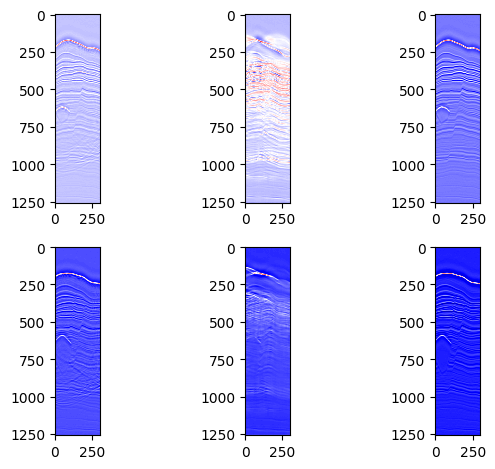

17/17 ━━━━━━━━━━━━━━━━━━━━ 103s 6s/step - ssim: 0.5363 - ssim_loss: 0.4618 - val_ssim: 0.5153 - val_ssim_loss: 0.5115 - learning_rate: 1.4901e-13
Epoch 121/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - ssim: 0.5056 - ssim_loss: 0.4815
End of epoch 120, Validation SSIM_Loss: 0.3671

End of epoch 120, Validation SSIM: 0.5883


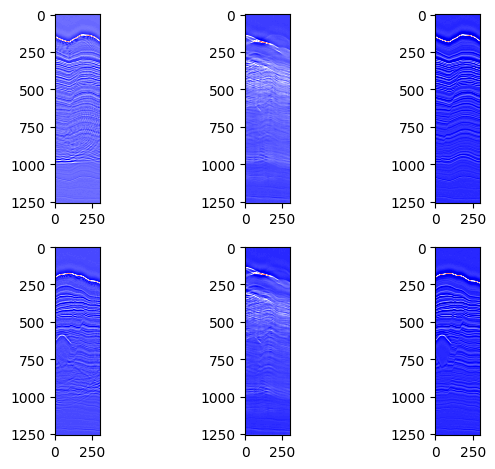

17/17 ━━━━━━━━━━━━━━━━━━━━ 102s 6s/step - ssim: 0.5063 - ssim_loss: 0.4807 - val_ssim: 0.5883 - val_ssim_loss: 0.3671 - learning_rate: 7.4506e-14
Epoch 122/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - ssim: 0.5720 - ssim_loss: 0.4555
End of epoch 121, Validation SSIM_Loss: 0.3930

End of epoch 121, Validation SSIM: 0.5659


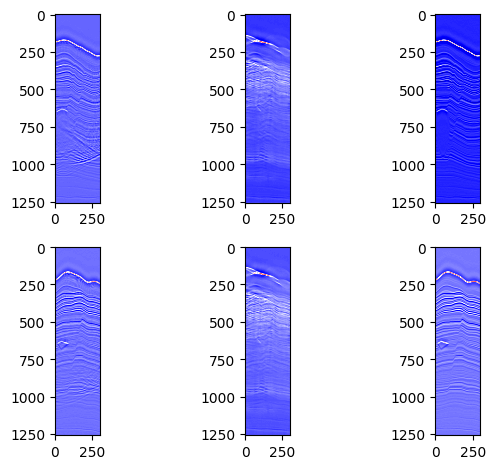

17/17 ━━━━━━━━━━━━━━━━━━━━ 100s 6s/step - ssim: 0.5705 - ssim_loss: 0.4757 - val_ssim: 0.5659 - val_ssim_loss: 0.3930 - learning_rate: 7.4506e-14
Epoch 123/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - ssim: 0.5176 - ssim_loss: 0.4711
End of epoch 122, Validation SSIM_Loss: 0.4333

End of epoch 122, Validation SSIM: 0.6272


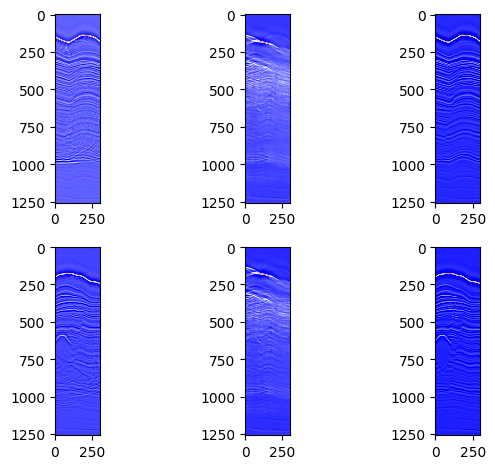

17/17 ━━━━━━━━━━━━━━━━━━━━ 100s 6s/step - ssim: 0.5182 - ssim_loss: 0.4718 - val_ssim: 0.6272 - val_ssim_loss: 0.4333 - learning_rate: 7.4506e-14
Epoch 124/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - ssim: 0.5326 - ssim_loss: 0.4639
Epoch 124: ReduceLROnPlateau reducing learning rate to 3.7252902043531655e-14.

End of epoch 123, Validation SSIM_Loss: 0.4270

End of epoch 123, Validation SSIM: 0.5288


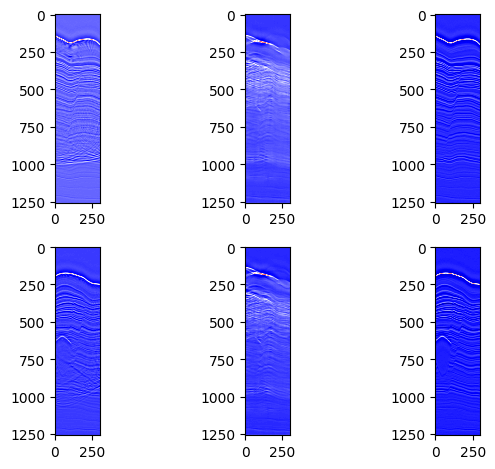

17/17 ━━━━━━━━━━━━━━━━━━━━ 100s 6s/step - ssim: 0.5328 - ssim_loss: 0.4529 - val_ssim: 0.5288 - val_ssim_loss: 0.4270 - learning_rate: 7.4506e-14
Epoch 125/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - ssim: 0.5497 - ssim_loss: 0.4491
End of epoch 124, Validation SSIM_Loss: 0.3299

End of epoch 124, Validation SSIM: 0.6213


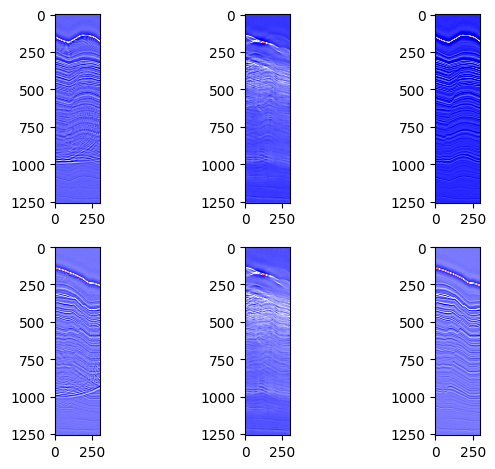

17/17 ━━━━━━━━━━━━━━━━━━━━ 99s 6s/step - ssim: 0.5497 - ssim_loss: 0.4581 - val_ssim: 0.6213 - val_ssim_loss: 0.3299 - learning_rate: 3.7253e-14
Epoch 126/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - ssim: 0.5538 - ssim_loss: 0.4816
End of epoch 125, Validation SSIM_Loss: 0.4121

End of epoch 125, Validation SSIM: 0.5286


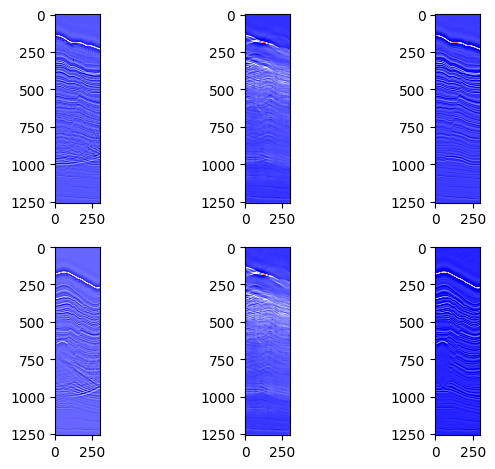

17/17 ━━━━━━━━━━━━━━━━━━━━ 99s 6s/step - ssim: 0.5518 - ssim_loss: 0.4840 - val_ssim: 0.5286 - val_ssim_loss: 0.4121 - learning_rate: 3.7253e-14
Epoch 127/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - ssim: 0.5294 - ssim_loss: 0.4831
End of epoch 126, Validation SSIM_Loss: 0.4454

End of epoch 126, Validation SSIM: 0.5305


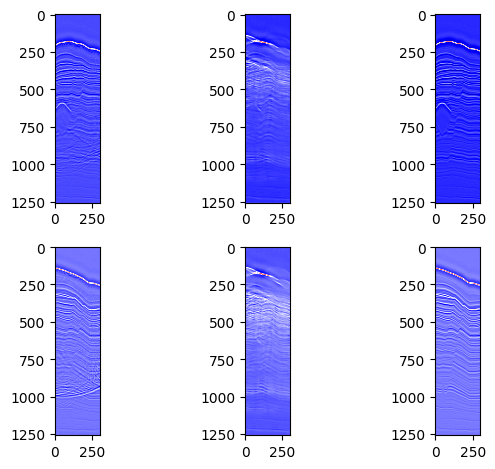

17/17 ━━━━━━━━━━━━━━━━━━━━ 99s 6s/step - ssim: 0.5287 - ssim_loss: 0.4797 - val_ssim: 0.5305 - val_ssim_loss: 0.4454 - learning_rate: 3.7253e-14
Epoch 128/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - ssim: 0.5549 - ssim_loss: 0.4733
End of epoch 127, Validation SSIM_Loss: 0.2993

End of epoch 127, Validation SSIM: 0.5817


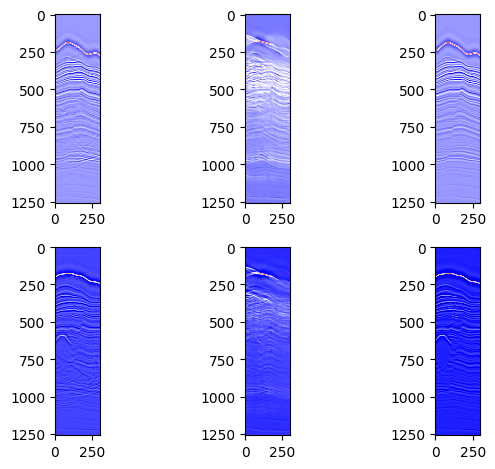

17/17 ━━━━━━━━━━━━━━━━━━━━ 145s 9s/step - ssim: 0.5533 - ssim_loss: 0.4935 - val_ssim: 0.5817 - val_ssim_loss: 0.2993 - learning_rate: 3.7253e-14
Epoch 129/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - ssim: 0.5324 - ssim_loss: 0.4696
End of epoch 128, Validation SSIM_Loss: 0.4976

End of epoch 128, Validation SSIM: 0.5681


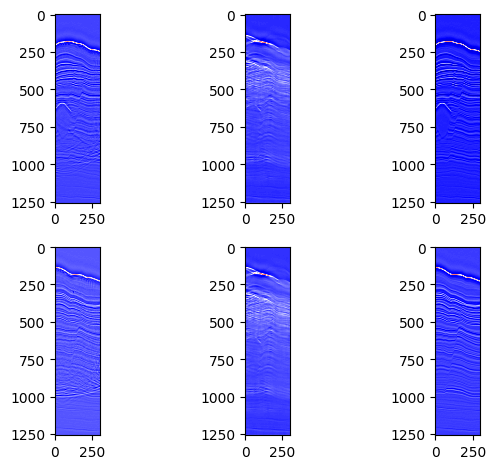

17/17 ━━━━━━━━━━━━━━━━━━━━ 90s 5s/step - ssim: 0.5323 - ssim_loss: 0.4654 - val_ssim: 0.5681 - val_ssim_loss: 0.4976 - learning_rate: 3.7253e-14
Epoch 130/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - ssim: 0.5480 - ssim_loss: 0.4495
End of epoch 129, Validation SSIM_Loss: 0.5269

End of epoch 129, Validation SSIM: 0.5359


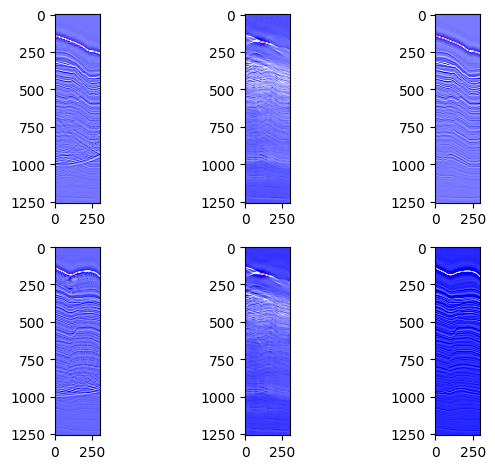

17/17 ━━━━━━━━━━━━━━━━━━━━ 90s 5s/step - ssim: 0.5482 - ssim_loss: 0.4521 - val_ssim: 0.5359 - val_ssim_loss: 0.5269 - learning_rate: 3.7253e-14
Epoch 131/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - ssim: 0.5357 - ssim_loss: 0.4677
End of epoch 130, Validation SSIM_Loss: 0.4346

End of epoch 130, Validation SSIM: 0.5758


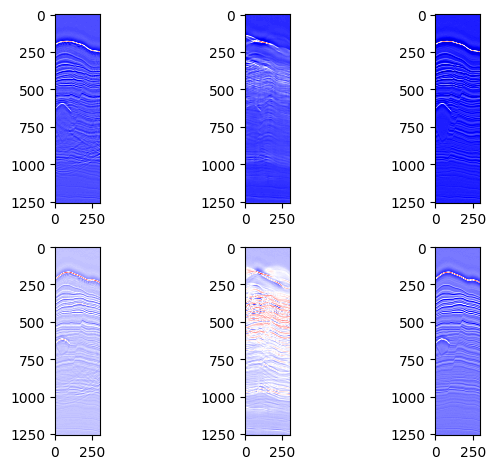

17/17 ━━━━━━━━━━━━━━━━━━━━ 90s 5s/step - ssim: 0.5355 - ssim_loss: 0.4675 - val_ssim: 0.5758 - val_ssim_loss: 0.4346 - learning_rate: 3.7253e-14
Epoch 132/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - ssim: 0.5565 - ssim_loss: 0.4464
Epoch 132: ReduceLROnPlateau reducing learning rate to 1.8626451021765827e-14.

End of epoch 131, Validation SSIM_Loss: 0.4206

End of epoch 131, Validation SSIM: 0.5855


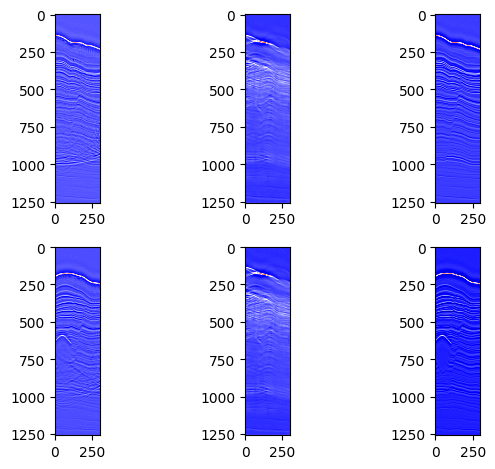

17/17 ━━━━━━━━━━━━━━━━━━━━ 89s 5s/step - ssim: 0.5564 - ssim_loss: 0.4396 - val_ssim: 0.5855 - val_ssim_loss: 0.4206 - learning_rate: 3.7253e-14
Epoch 133/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - ssim: 0.5881 - ssim_loss: 0.4465
End of epoch 132, Validation SSIM_Loss: 0.4681

End of epoch 132, Validation SSIM: 0.5177


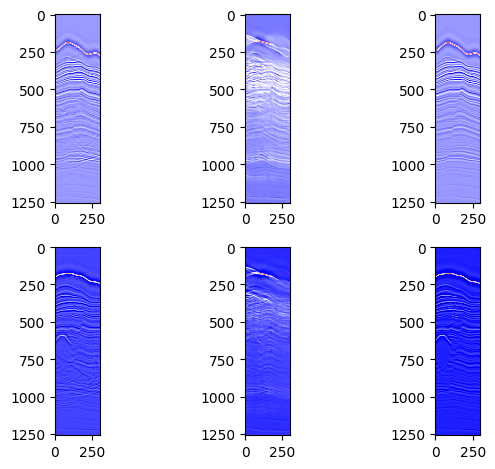

17/17 ━━━━━━━━━━━━━━━━━━━━ 89s 5s/step - ssim: 0.5861 - ssim_loss: 0.4519 - val_ssim: 0.5177 - val_ssim_loss: 0.4681 - learning_rate: 1.8626e-14
Epoch 134/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - ssim: 0.5899 - ssim_loss: 0.4297
End of epoch 133, Validation SSIM_Loss: 0.3800

End of epoch 133, Validation SSIM: 0.5162


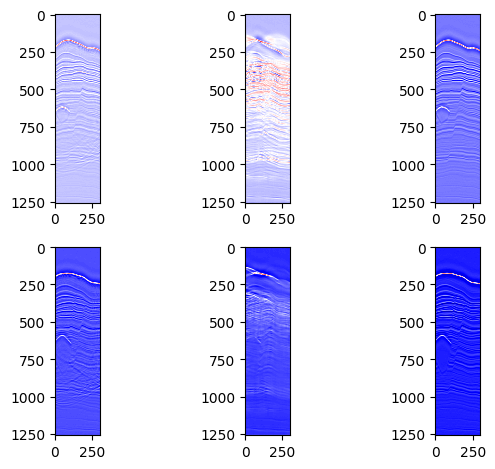

17/17 ━━━━━━━━━━━━━━━━━━━━ 89s 5s/step - ssim: 0.5888 - ssim_loss: 0.4341 - val_ssim: 0.5162 - val_ssim_loss: 0.3800 - learning_rate: 1.8626e-14
Epoch 135/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - ssim: 0.5143 - ssim_loss: 0.4659
End of epoch 134, Validation SSIM_Loss: 0.4263

End of epoch 134, Validation SSIM: 0.5372


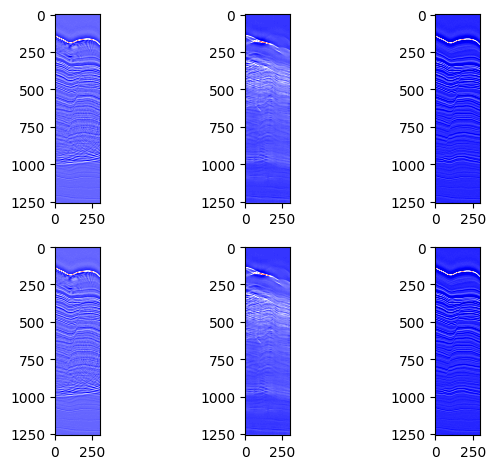

17/17 ━━━━━━━━━━━━━━━━━━━━ 89s 5s/step - ssim: 0.5154 - ssim_loss: 0.4671 - val_ssim: 0.5372 - val_ssim_loss: 0.4263 - learning_rate: 1.8626e-14
Epoch 136/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - ssim: 0.5295 - ssim_loss: 0.5018
Epoch 136: ReduceLROnPlateau reducing learning rate to 9.313225510882914e-15.

End of epoch 135, Validation SSIM_Loss: 0.4019

End of epoch 135, Validation SSIM: 0.5955


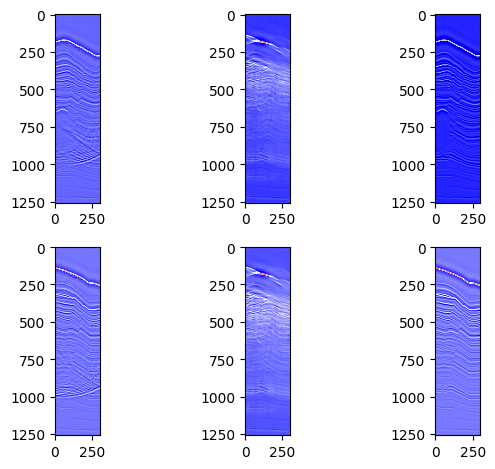

17/17 ━━━━━━━━━━━━━━━━━━━━ 88s 5s/step - ssim: 0.5278 - ssim_loss: 0.5168 - val_ssim: 0.5955 - val_ssim_loss: 0.4019 - learning_rate: 1.8626e-14
Epoch 137/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - ssim: 0.5462 - ssim_loss: 0.4781
End of epoch 136, Validation SSIM_Loss: 0.3081

End of epoch 136, Validation SSIM: 0.5754


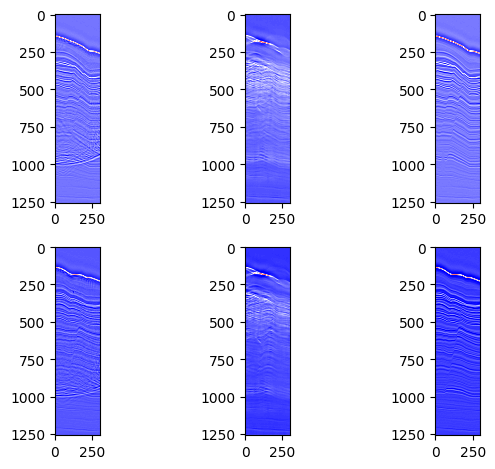

17/17 ━━━━━━━━━━━━━━━━━━━━ 88s 5s/step - ssim: 0.5449 - ssim_loss: 0.4689 - val_ssim: 0.5754 - val_ssim_loss: 0.3081 - learning_rate: 9.3132e-15
Epoch 138/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - ssim: 0.5610 - ssim_loss: 0.4479
End of epoch 137, Validation SSIM_Loss: 0.5176

End of epoch 137, Validation SSIM: 0.5067


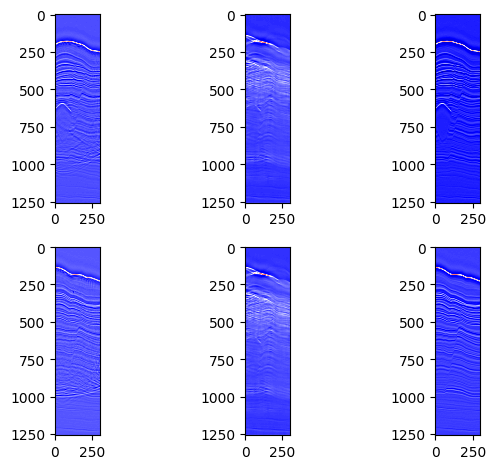

17/17 ━━━━━━━━━━━━━━━━━━━━ 88s 5s/step - ssim: 0.5605 - ssim_loss: 0.4494 - val_ssim: 0.5067 - val_ssim_loss: 0.5176 - learning_rate: 9.3132e-15
Epoch 139/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - ssim: 0.5707 - ssim_loss: 0.4498
End of epoch 138, Validation SSIM_Loss: 0.3919

End of epoch 138, Validation SSIM: 0.5861


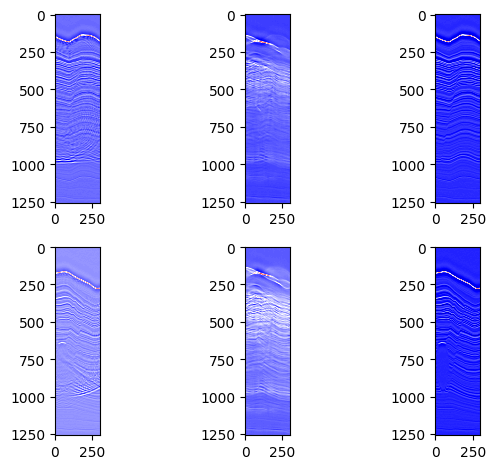

17/17 ━━━━━━━━━━━━━━━━━━━━ 88s 5s/step - ssim: 0.5696 - ssim_loss: 0.4517 - val_ssim: 0.5861 - val_ssim_loss: 0.3919 - learning_rate: 9.3132e-15
Epoch 140/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - ssim: 0.5627 - ssim_loss: 0.4282
Epoch 140: ReduceLROnPlateau reducing learning rate to 4.656612755441457e-15.

End of epoch 139, Validation SSIM_Loss: 0.4453

End of epoch 139, Validation SSIM: 0.5090


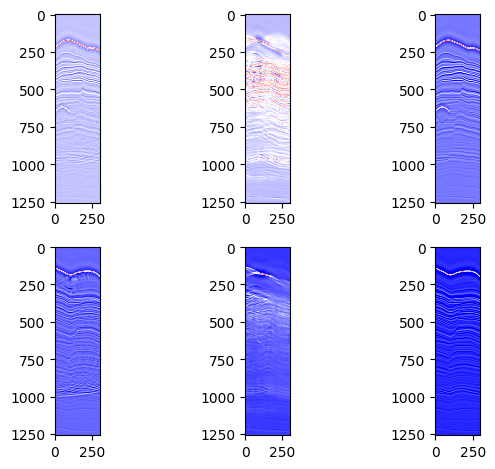

17/17 ━━━━━━━━━━━━━━━━━━━━ 88s 5s/step - ssim: 0.5632 - ssim_loss: 0.4198 - val_ssim: 0.5090 - val_ssim_loss: 0.4453 - learning_rate: 9.3132e-15
Epoch 141/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - ssim: 0.5495 - ssim_loss: 0.4618
End of epoch 140, Validation SSIM_Loss: 0.6451

End of epoch 140, Validation SSIM: 0.4721


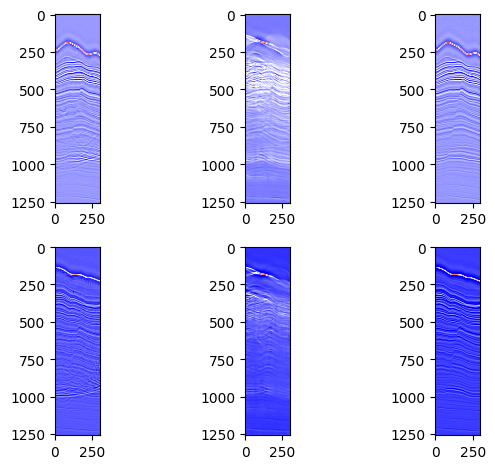

17/17 ━━━━━━━━━━━━━━━━━━━━ 88s 5s/step - ssim: 0.5489 - ssim_loss: 0.4564 - val_ssim: 0.4721 - val_ssim_loss: 0.6451 - learning_rate: 4.6566e-15
Epoch 142/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - ssim: 0.5368 - ssim_loss: 0.4735
End of epoch 141, Validation SSIM_Loss: 0.6225

End of epoch 141, Validation SSIM: 0.5138


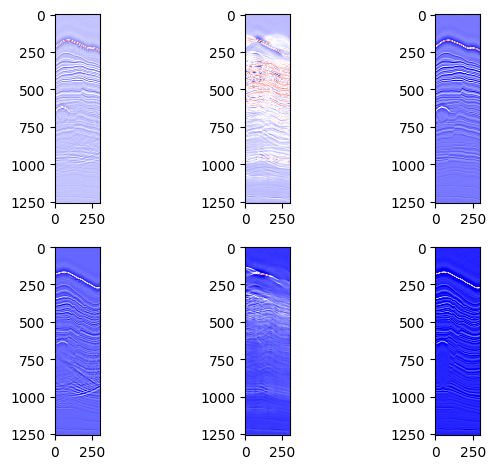

17/17 ━━━━━━━━━━━━━━━━━━━━ 88s 5s/step - ssim: 0.5362 - ssim_loss: 0.4823 - val_ssim: 0.5138 - val_ssim_loss: 0.6225 - learning_rate: 4.6566e-15
Epoch 143/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - ssim: 0.5669 - ssim_loss: 0.4456
End of epoch 142, Validation SSIM_Loss: 0.5470

End of epoch 142, Validation SSIM: 0.5638


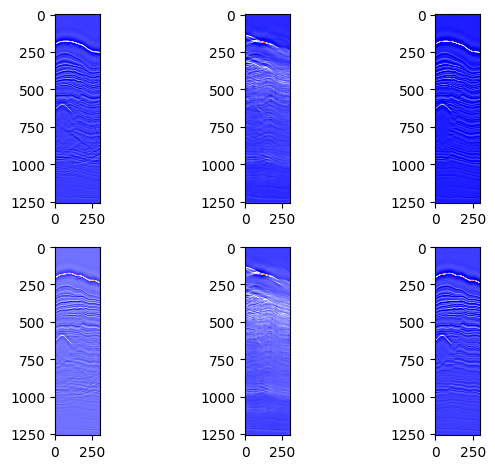

17/17 ━━━━━━━━━━━━━━━━━━━━ 88s 5s/step - ssim: 0.5662 - ssim_loss: 0.4477 - val_ssim: 0.5638 - val_ssim_loss: 0.5470 - learning_rate: 4.6566e-15
Epoch 144/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - ssim: 0.4993 - ssim_loss: 0.4669
Epoch 144: ReduceLROnPlateau reducing learning rate to 2.3283063777207284e-15.

End of epoch 143, Validation SSIM_Loss: 0.4449

End of epoch 143, Validation SSIM: 0.5362


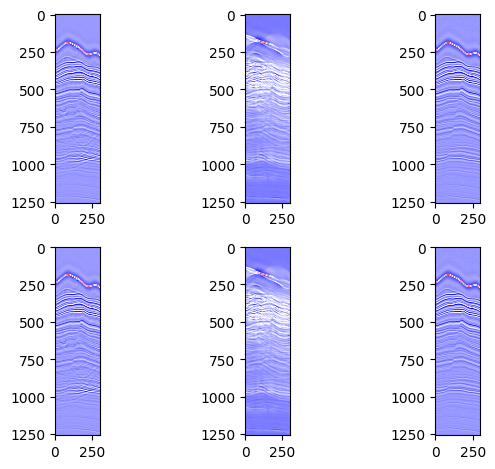

17/17 ━━━━━━━━━━━━━━━━━━━━ 87s 5s/step - ssim: 0.5011 - ssim_loss: 0.4633 - val_ssim: 0.5362 - val_ssim_loss: 0.4449 - learning_rate: 4.6566e-15
Epoch 145/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - ssim: 0.5175 - ssim_loss: 0.4997
End of epoch 144, Validation SSIM_Loss: 0.4628

End of epoch 144, Validation SSIM: 0.6013


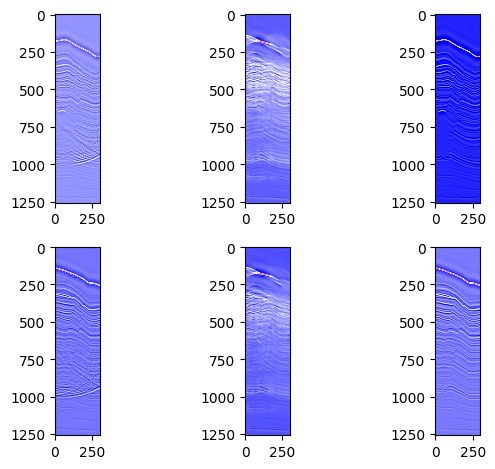

17/17 ━━━━━━━━━━━━━━━━━━━━ 86s 5s/step - ssim: 0.5165 - ssim_loss: 0.5018 - val_ssim: 0.6013 - val_ssim_loss: 0.4628 - learning_rate: 2.3283e-15
Epoch 146/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - ssim: 0.5409 - ssim_loss: 0.4657
End of epoch 145, Validation SSIM_Loss: 0.4364

End of epoch 145, Validation SSIM: 0.5330


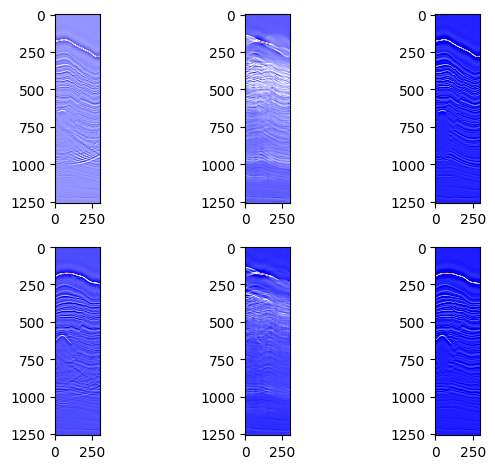

17/17 ━━━━━━━━━━━━━━━━━━━━ 86s 5s/step - ssim: 0.5405 - ssim_loss: 0.4586 - val_ssim: 0.5330 - val_ssim_loss: 0.4364 - learning_rate: 2.3283e-15
Epoch 147/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - ssim: 0.5089 - ssim_loss: 0.4708
End of epoch 146, Validation SSIM_Loss: 0.3966

End of epoch 146, Validation SSIM: 0.5821


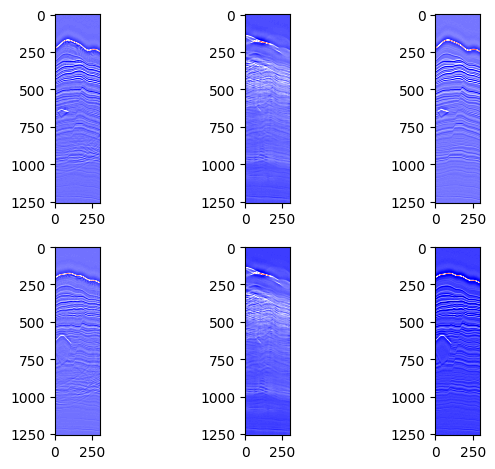

17/17 ━━━━━━━━━━━━━━━━━━━━ 86s 5s/step - ssim: 0.5101 - ssim_loss: 0.4693 - val_ssim: 0.5821 - val_ssim_loss: 0.3966 - learning_rate: 2.3283e-15
Epoch 148/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - ssim: 0.5574 - ssim_loss: 0.4611
Epoch 148: ReduceLROnPlateau reducing learning rate to 1.1641531888603642e-15.

End of epoch 147, Validation SSIM_Loss: 0.3676

End of epoch 147, Validation SSIM: 0.6151


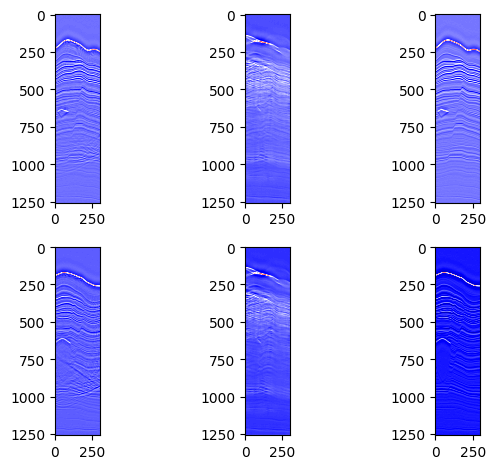

17/17 ━━━━━━━━━━━━━━━━━━━━ 86s 5s/step - ssim: 0.5564 - ssim_loss: 0.4579 - val_ssim: 0.6151 - val_ssim_loss: 0.3676 - learning_rate: 2.3283e-15
Epoch 149/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - ssim: 0.5414 - ssim_loss: 0.4749
End of epoch 148, Validation SSIM_Loss: 0.4011

End of epoch 148, Validation SSIM: 0.6138


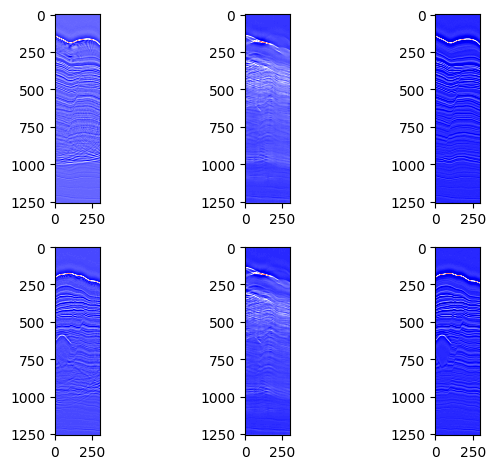

17/17 ━━━━━━━━━━━━━━━━━━━━ 86s 5s/step - ssim: 0.5405 - ssim_loss: 0.4822 - val_ssim: 0.6138 - val_ssim_loss: 0.4011 - learning_rate: 1.1642e-15
Epoch 150/150
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - ssim: 0.5230 - ssim_loss: 0.4717
End of epoch 149, Validation SSIM_Loss: 0.3797

End of epoch 149, Validation SSIM: 0.6071


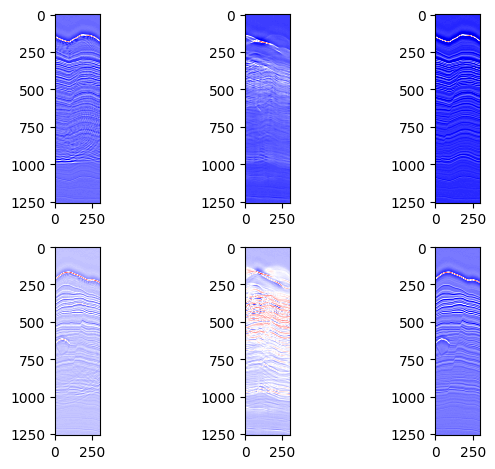

17/17 ━━━━━━━━━━━━━━━━━━━━ 86s 5s/step - ssim: 0.5233 - ssim_loss: 0.4697 - val_ssim: 0.6071 - val_ssim_loss: 0.3797 - learning_rate: 1.1642e-15
02:01:13


In [21]:
from datetime import datetime
now = datetime.now()
current_time = now.strftime("%H:%M:%S")
print(current_time)
history = vit_mae.fit(
    train_dataset,
    epochs=150,
    validation_data=val_dataset,
    callbacks=[
        model_checkpt_callback,
        reduce_lr,
        ImageGenerator(num_img=2,rescale_layer=rescale_volume,validation_data=val_dataset),
        # tensorboard_callback
        # early_stopping
    ]
)
now = datetime.now()
current_time = now.strftime("%H:%M:%S")
print(current_time)
with open('vit_mae_1.pkl','wb') as f:
    pickle.dump(history.history,f)

# Testing

In [22]:
# vit_loaded = models.load_model('vit_mae_1.keras')
vit_loaded = models.load_model('vit_mae_1.keras')

# initial_learning_rate = 1e-3
# vit.compile(optimizer=optimizers.Adam(learning_rate=initial_learning_rate),loss_fn=SSIMLoss(),metrics=[SSIMMetric()])

/home/simlab120/anaconda3/envs/tf/lib/python3.12/site-packages/keras/src/layers/layer.py:391: UserWarning: `build()` was called on layer 'patches_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/simlab120/anaconda3/envs/tf/lib/python3.12/site-packages/keras/src/saving/saving_lib.py:713: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 72 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


(16, 1259, 300)
(1259, 300)


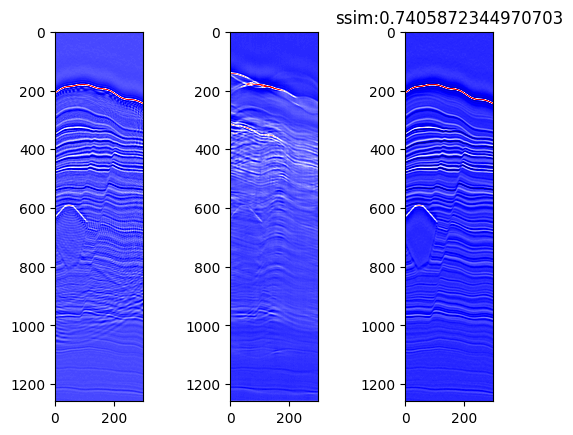

In [ ]:
for batch_inputs, batch_outputs in val_dataset.take(1):
    print(batch_inputs.shape)
    batch_no = 2
    i,j = batch_inputs[batch_no],batch_outputs[batch_no]
    i_rescaled = rescale_volume(i)
    j_rescaled = rescale_volume(j)
    i_expanded =  tf.expand_dims(i,axis=0) # so that the input will go as batch
    out = vit_mae(i_expanded)
    out = tf.squeeze(out,axis=0)
    ssim_value_1 = tf.image.ssim(tf.expand_dims(out,axis=-1),tf.expand_dims(j_rescaled,axis=-1), max_val=1.0)
    

    print(i.shape)
    
    fig, axes = plt.subplots(1,3)
    ax0,ax1,ax2 = axes[0],axes[1],axes[2]
    ax0.imshow(i_rescaled,cmap='seismic',vmin=0,vmax=1)
    ax1.imshow(out,cmap='seismic',vmin=0,vmax=1)
    ax2.imshow(j_rescaled,cmap='seismic',vmin=0,vmax=1)
    plt.title(f"ssim:{ssim_value_1}")
    plt.savefig("fig13.png")


    break




In [24]:












with open('vit_mae_1.pkl','rb') as f:
    h2 = pickle.load(f)

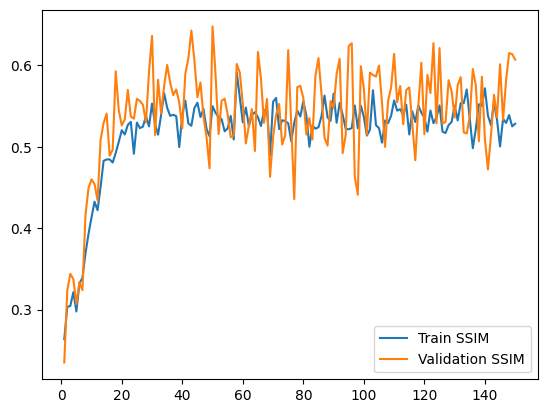

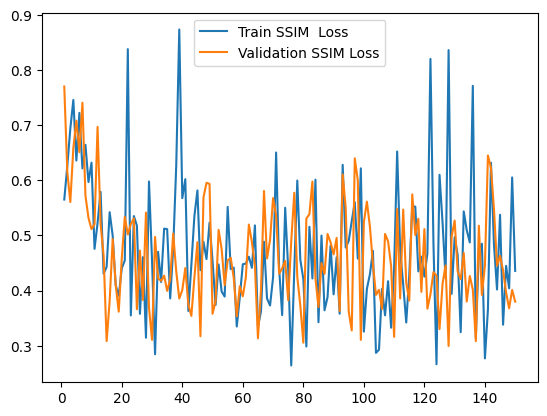

In [25]:
train_ssim = h2['ssim']
val_ssim = h2['val_ssim']
train_ssim_loss = h2['ssim_loss']
val_ssim_loss = h2['val_ssim_loss']
epochs = range(1,len(train_ssim)+1)
plt.figure()
plt.plot(epochs,train_ssim,label="Train SSIM")
plt.plot(epochs,val_ssim,label="Validation SSIM")
plt.legend()

plt.figure()
plt.plot(epochs,train_ssim_loss,label="Train SSIM  Loss")
plt.plot(epochs,val_ssim_loss,label="Validation SSIM Loss")
plt.legend()
